<a href="https://colab.research.google.com/github/kishoret04/statisticallearning_datamining/blob/master/MATH6350_HW4Part2_Tumarada.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **HW4 Part1 : SVM classification for Simulated Data**

---

**Question 1 : Generate a Data Set by Simulations**

**Step 1**

Using random sampling of uniform distribution over the interval [-2, +2],

select 16 random numbers Aij with i= 1 2 3 4 and j = 1 2 3 4

select 4 random numbers Bi with i= 1 2 3 4

select 1 random number c

display the values of these random numbers


Answer:


In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [0]:
class SvmSimulationData():
  Aij = np.array
  Bi = np.array
  c = 0
  x_10000 = np.ndarray
  df_x_10000 = pd.DataFrame
  df_Un = pd.DataFrame
  Yn = np.ndarray
  CL1 = np.ndarray
  CL_1 = np.ndarray
  total_data = pd.DataFrame
  std_data = pd.DataFrame
  train_data = pd.DataFrame
  test_data = pd.DataFrame


  def __init__(self):
    #selecting random numbers from uniform distribution [-2,2]
    np.random.seed(100)
    self.Aij = np.around(np.random.uniform(-2,2,16),2).reshape(4,4)
    self.Bi = np.around(np.random.uniform(-2,2,4),2).reshape(1,4)
    self.c = np.around(np.random.uniform(-2,2,1)/20,2)
    #creating 10,000 vectors of x in R4
    self.x_10000 = np.around(np.random.uniform(-2,2,(10000,4)),2)
    


  def display_data(self):
    print('\nAij: \n',self.Aij,'\nBi: ',self.Bi,'\nc: ',self.c)

  #function to creating polynomial Pol(x) = ∑i ∑j Aij xi xj + ∑ i Bi xi + c
  def polynomial_creator(self):
    def polynomial(x_array):
        x_mat = x_array.reshape(1,4)
        # print('x_mat:',x_mat)
        # Aij_result = np.matmul(np.matmul(self.Aij,x_mat.T),x_mat)
        Aij_result = self.Aij*np.matmul(x_mat.T,x_mat)
        # print('\nAij_result:\n',Aij_result)
        Bi_result = np.matmul(self.Bi,x_mat.T)
        # print('Bi_result:\n',Bi_result)
        # print(sum(sum(Aij_result)))               
        return sum(sum(Aij_result))+sum(Bi_result)+self.c
    return polynomial
    
  #function to compute Un from Pol(x)
  def compute_Un(self):
    p1 = self.polynomial_creator()
    #calculating pol(x) value for each case in X matrix with 4 columns    
    Un = np.apply_along_axis(p1,axis=1,arr = self.x_10000)
    # df_Un = pd.DataFrame(Un.T)
    # self.x_10000['Un'] = pd.Series(Un)
    self.x_10000 = np.append(self.x_10000,Un,axis = 1)
    print('datasetout after appending:',self.x_10000,'\nUn:', Un)
    self.Yn = np.sign(Un)
    print('Yn:',self.Yn)

  #function to create std dataset
  def create_dataset(self):
    
    #create dataframe with CL1 cases
    self.total_data = pd.DataFrame(self.CL1,columns=['x1','x2','x3','x4','Un'])
    CL_1 = pd.DataFrame(self.CL_1,columns=['x1','x2','x3','x4','Un'])
    self.total_data = self.total_data.append(CL_1,ignore_index = True)
    self.std_data = (self.total_data-self.total_data.mean())/self.total_data.std()
    
    #add class label as last column in total dataframe
    self.total_data.loc[:self.CL1.shape[0],'class']=1
    self.total_data.loc[self.CL1.shape[0]:,'class']=-1
    #add class label as last column in std dataframe
    self.std_data.loc[:self.CL1.shape[0],'class']=1
    self.std_data.loc[self.CL1.shape[0]:,'class']=-1


  def create_traintestdata(self,prop):
    #calculate trainset size 
    train_size = int(prop*2500/100)
    
    #extract a random sample of 80% CL1 as train and 20% CL1 as test set
    self.train_data = self.std_data[0:2500].sample(train_size)
    self.test_data = self.std_data[0:2500].drop(self.train_data.index)
    
    #extract a random sample of 80% CL-1 as train and 20% CL-1 as test set
    CL_1_train = self.std_data[2500:].sample(train_size)
    CL_1_test = self.std_data[2500:].drop(CL_1_train.index)

    #creating train and test sets by combinining CL1 and CL-1
    self.train_data = self.train_data.append(CL_1_train,ignore_index = True)
    self.test_data = self.test_data.append(CL_1_test,ignore_index = True)
    



In [0]:
simulated_data = SvmSimulationData()
simulated_data.display_data()


Aij: 
 [[ 0.17 -0.89 -0.3   1.38]
 [-1.98 -1.51  0.68  1.3 ]
 [-1.45  0.3   1.57 -1.16]
 [-1.26 -1.57 -1.12  1.91]] 
Bi:  [[ 1.25 -1.31  1.26 -0.9 ]] 
c:  [-0.01]



Define the polynomial of degree 2 in the 4 variables x1 x2 x3 x4 as follows

-- > Pol(x) = ∑i ∑j Aij xi xj + ∑ i Bi xi + c/20

Answer:

Pol(x) = show equation
\begin{equation*}
\mathbf{Pol(x}_1 , \mathbf{x}_2, \mathbf{x}_3, \mathbf{x}_4) =  \begin{vmatrix}
\mathbf{i} & \mathbf{j} & \mathbf{k} \\
\frac{\partial X}{\partial u} &  \frac{\partial Y}{\partial u} & 0 \\
\frac{\partial X}{\partial v} &  \frac{\partial Y}{\partial v} & 0
\end{vmatrix}
\end{equation*}


# **Step 2**
using random sampling of uniform distribution over the interval [-2, 2],

select 10, 000 vectors x1 ... x10,000 in R4.

Each such vector xn has 4 randomly chosen coordinates with values in [-2, 2]


In [0]:
from scipy import stats
simulated_data.x_10000
stats.describe(simulated_data.x_10000)

DescribeResult(nobs=10000, minmax=(array([-2., -2., -2., -2.]), array([2., 2., 2., 2.])), mean=array([ 0.010514, -0.019496,  0.004572, -0.016153]), variance=array([1.36473937, 1.33106431, 1.32856079, 1.32952808]), skewness=array([-0.01028632,  0.02059666, -0.00514911,  0.030203  ]), kurtosis=array([-1.22781873, -1.19162276, -1.18641199, -1.19354303]))

For each selected xn compute U(n) = Pol(x^n) and y(n) = sign[U(n)]


In [0]:
simulated_data.compute_Un()

datasetout after appending: [[  1.76       1.27      -0.66      -1.3       -4.121085]
 [ -0.51      -1.98      -0.99       1.18      -0.679043]
 [ -1.94       0.4        0.42      -1.58      10.304616]
 ...
 [ -0.9       -1.52      -0.84       0.91      -3.662621]
 [  0.53      -1.64      -1.67      -0.92       6.265027]
 [  1.6        1.95      -0.85      -0.96     -12.921604]] 
Un: [[ -4.121085]
 [ -0.679043]
 [ 10.304616]
 ...
 [ -3.662621]
 [  6.265027]
 [-12.921604]]
Yn: [[-1.]
 [-1.]
 [ 1.]
 ...
 [-1.]
 [ 1.]
 [-1.]]


define two classes by
CL(1) = class1= set of all xn such that y(n) = +1
CL(-1) = class1= set of all xn such that y(n) = -1


In [0]:
bool_filter = simulated_data.Yn>0
sampledata_Cl1 = simulated_data.x_10000[np.concatenate(bool_filter).tolist()].copy()

bool_filter = simulated_data.Yn<0
sampledata_Cl_1 = simulated_data.x_10000[np.concatenate(bool_filter).tolist()].copy()

In [0]:
simulated_data.x_10000.shape

(10000, 5)

keep only 2500 cases in CL(1) and 2500 cases in CL(-1)


In [0]:
#Random selection of 2500 rows from Cl1 and Cl-1
no_cases = 2500
#creating random sample of 2500 cases and filtering sampledata into C1 and C_1
random_list = np.random.randint(0, sampledata_Cl1.shape[0], size=no_cases).tolist()
simulated_data.CL1 = sampledata_Cl1[random_list]
random_list = np.random.randint(0, sampledata_Cl_1.shape[0], size=no_cases).tolist()
simulated_data.CL_1 = sampledata_Cl_1[random_list]

Center and Rescale this data set of size 5000 so that the standardized data set will have mean = 0 and dispersion =1.


In [0]:
simulated_data.create_dataset()
simulated_data.total_data.head()

,x1,x2,x3,x4,Un,class
0,1.55,-0.13,1.11,-1.45,11.909559,1.0
1,-1.15,-0.77,1.42,-0.24,4.176791,1.0
2,1.01,-1.89,0.06,0.68,4.458139,1.0
3,-1.08,0.53,0.49,1.58,2.687662,1.0
4,1.21,-0.92,-1.87,1.49,23.491686,1.0


In [0]:
simulated_data.total_data.describe()

,x1,x2,x3,x4,Un,class
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.0000
mean,-0.066778,0.046946,-0.045412,-0.028140,1.400838,0.0000
std,1.172790,1.203336,1.134268,1.112351,7.229189,1.0001
min,-2.000000,-2.000000,-2.000000,-2.000000,-17.863594,-1.0000
25%,-1.100000,-1.042500,-1.000000,-0.980000,-3.143817,-1.0000
50%,-0.130000,0.100000,-0.090000,-0.050000,0.001753,0.0000
75%,0.950000,1.120000,0.912500,0.880000,5.286275,1.0000
max,2.000000,2.000000,2.000000,2.000000,38.783297,1.0000


In [0]:
simulated_data.std_data.describe()

,x1,x2,x3,x4,Un,class
count,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,5000.0000
mean,4.179990e-16,1.920686e-16,1.700640e-16,-8.393286e-18,1.164735e-15,0.0000
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.0001
min,-1.648396e+00,-1.701059e+00,-1.723215e+00,-1.772695e+00,-2.664812e+00,-1.0000
25%,-8.809950e-01,-9.053545e-01,-8.415895e-01,-8.557189e-01,-6.286534e-01,-1.0000
50%,-5.390735e-02,4.408909e-02,-3.930993e-02,-1.965207e-02,-1.935328e-01,0.0000
75%,8.669737e-01,8.917324e-01,8.445200e-01,8.164148e-01,5.374652e-01,1.0000
max,1.762275e+00,1.623033e+00,1.803288e+00,1.823291e+00,5.171045e+00,1.0000


Then Split each class into a training set and a test set , using the proportions 80% and 20%.This defines a training set TRAIN and a test set TEST of resp. sizes 4000 and 1000

In [0]:
simulated_data.create_traintestdata(80)
simulated_data.train_data.describe()

,x1,x2,x3,x4,Un,class
count,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000
mean,0.004419,0.010063,0.007775,0.002922,0.007335,0.000000
std,0.999208,1.004394,1.001729,1.000094,0.997566,1.000125
min,-1.648396,-1.701059,-1.723215,-1.772695,-2.664812,-1.000000
25%,-0.863942,-0.903277,-0.832773,-0.848976,-0.620203,-1.000000
50%,-0.062434,0.077330,-0.021677,-0.019652,-0.193533,0.000000
75%,0.875500,0.908353,0.859948,0.818662,0.540827,1.000000
max,1.762275,1.623033,1.803288,1.823291,5.171045,1.000000


In [0]:
simulated_data.test_data.describe()

,x1,x2,x3,x4,Un,class
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.0000
mean,-0.017678,-0.040251,-0.031102,-0.011687,-0.029341,0.0000
std,1.003467,0.981691,0.992942,1.000039,1.009646,1.0005
min,-1.648396,-1.701059,-1.723215,-1.763705,-2.481280,-1.0000
25%,-0.923628,-0.919897,-0.887875,-0.875946,-0.670892,-1.0000
50%,-0.036854,-0.047323,-0.074575,-0.019652,-0.195473,0.0000
75%,0.834999,0.833561,0.826887,0.791692,0.518183,1.0000
max,1.762275,1.614722,1.803288,1.814301,4.415864,1.0000


In [0]:
simulated_data.std_data.describe()

,x1,x2,x3,x4,Un,class
count,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,5000.0000
mean,4.179990e-16,1.920686e-16,1.700640e-16,-8.393286e-18,1.164735e-15,0.0000
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.0001
min,-1.648396e+00,-1.701059e+00,-1.723215e+00,-1.772695e+00,-2.664812e+00,-1.0000
25%,-8.809950e-01,-9.053545e-01,-8.415895e-01,-8.557189e-01,-6.286534e-01,-1.0000
50%,-5.390735e-02,4.408909e-02,-3.930993e-02,-1.965207e-02,-1.935328e-01,0.0000
75%,8.669737e-01,8.917324e-01,8.445200e-01,8.164148e-01,5.374652e-01,1.0000
max,1.762275e+00,1.623033e+00,1.803288e+00,1.823291e+00,5.171045e+00,1.0000


In [0]:
print(simulated_data.std_data.head())
print(simulated_data.train_data.head())


         x1        x2        x3        x4        Un  class
0  1.378574 -0.147046  1.018641 -1.278247  1.453651    1.0
1 -0.923628 -0.678901  1.291945 -0.190461  0.383992    1.0
2  0.918134 -1.609646  0.092934  0.636615  0.422911    1.0
3 -0.863942  0.401429  0.472033  1.445712  0.178004    1.0
4  1.088667 -0.803554 -1.608604  1.364803  3.055785    1.0
         x1        x2        x3        x4        Un  class
0  0.722020 -1.509924 -0.294981 -1.601886  1.027424    1.0
1 -0.812782  0.010848  0.145832  1.517632  0.146994    1.0
2  1.370048 -0.878346  1.618147  0.888335  0.452558    1.0
3  1.378574 -1.435132 -0.330246  1.769351  2.277859    1.0
4 -0.088014  1.340485  1.150885 -1.233297  1.250796    1.0




```
`# This is formatted as code`
```

# **Question 2: SVM classification by linear kernel**
(stated for R programming environment, but must have equivalent forms in Python)



In [0]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedShuffleSplit
from matplotlib.colors import Normalize
import math
import matplotlib.pyplot as plt

from scipy import interp
from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc



In [0]:
class MidpointNormalize(Normalize):
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))


class SvmClassification:
  train_data = pd.DataFrame
  train_labels = pd.DataFrame
  train_Un  = pd.DataFrame
  test_data = pd.DataFrame
  test_labels = pd.DataFrame
  test_Un  = pd.DataFrame
  svm_master= Pipeline
  pred_train = pd.DataFrame
  pred_test = pd.DataFrame
  confmat_train = pd.DataFrame
  confmat_test = pd.DataFrame
  confmat_train_error = pd.DataFrame
  confmat_train_confint = pd.DataFrame
  confmat_test_error = pd.DataFrame
  confmat_test_confint = pd.DataFrame
  df_tune_data = pd.DataFrame


  def __init__(self,train_data,test_data):
    #initializing train data and train labels
    self.train_data = train_data.drop(columns = ['class','Un'])
    self.train_labels = train_data['class']
    self.train_Un = train_data['Un']
    
    #initializing test data and test labels
    self.test_data = test_data.drop(columns = ['class','Un'])
    self.test_labels = test_data['class']
    self.test_Un = test_data['Un']

    #initializing pred_train and pred_test
    self.pred_train = pd.DataFrame(0,index =['total','cl1','cl_1'],
                                   columns = ['pred','error','conf_int'])
    self.pred_test = pd.DataFrame(0,index =['total','cl1','cl_1'],
                                   columns = ['pred','error','conf_int'])
    self.confmat_train = pd.DataFrame(0,index = ['true_CL1','true_CL_1'],
                                      columns = ['pred_CL1','pred_CL_1'])
    self.confmat_train_confint = pd.DataFrame(0,index = ['true_CL1','true_CL_1'],
                                      columns = ['pred_CL1','pred_CL_1'])
    
    self.confmat_train_error =  pd.DataFrame(0,index = ['true_CL1','true_CL_1'],
                                      columns = ['pred_CL1','pred_CL_1'])
    self.confmat_train_confint =  pd.DataFrame(0,index = ['true_CL1','true_CL_1'],
                                      columns = ['pred_CL1','pred_CL_1'])
    
    self.confmat_test_error = pd.DataFrame(0,index = ['true_CL1','true_CL_1'],
                                      columns = ['pred_CL1','pred_CL_1'])
    self.confmat_test_confint = pd.DataFrame(0,index = ['true_CL1','true_CL_1'],
                                      columns = ['pred_CL1','pred_CL_1'])
    
    
  def svm_call(self,kernel_type,parameters,is_test):
    
    #choosing kernel based on type
    if kernel_type == 'linear':
      print('kernel_type: ',kernel_type)
      print('parameters: ',parameters)
      self.svm_master = SVC(kernel=kernel_type, C=parameters['C'])

    elif kernel_type == 'rbf':
      print('kernel_type: ',kernel_type)
      self.svm_master = SVC(kernel=kernel_type, gamma=parameters['gamma'], C=parameters['C'])

    elif kernel_type == 'poly':
      print('kernel_type: ',kernel_type)
      self.svm_master = SVC(kernel=kernel_type, 
                            degree = 4,coef0 = parameters['coef0'],
                            gamma = parameters['gamma'],C = parameters['C'])
    
    #######Train set fitted SVM######################
    #fitting train data into svm model   
    print('------Fitting train data into svm model-----')     
    self.svm_master.fit(self.train_data,self.train_labels)
    print('Score for above parameters in SVC model : ',
            self.svm_master.score(self.train_data,self.train_labels))
    size_data = self.train_data.shape[0]    
    
    #ROC plotting
    train_score = self.svm_master.fit(self.train_data, self.train_labels).decision_function(self.train_data)
    self.plot_roc(train_score,self.train_labels)
    
    #train data poly(x) vs svm(x)
    x_values = self.train_Un
    y_values = pd.Series(self.svm_master.decision_function(self.train_data))
    
    #plot poly(x)  and svm(x)
    self.plot_poly_svm(x_values,y_values) 

    #sv count and ratio
    number_sv = sum(self.svm_master.n_support_)
    print('Number of Support vectors,S : ',number_sv)
    ratio_sv = round(number_sv/size_data,2)
    print('Ratio of Support vectors,s : ',ratio_sv) 
    
    ########SVM applied on test set############  
    
    print('------SVM applied on test set-----')    
    print('Score for above parameters in SVC model for testset : ',
          self.svm_master.score(self.test_data,self.test_labels))
    #ROC plotting
    test_score = self.svm_master.fit(self.train_data, self.train_labels).decision_function(self.test_data)
    self.plot_roc(test_score,self.test_labels)
    
    #test data poly(x) vs svm(x)
    x_values = self.test_Un
    y_values = pd.Series(self.svm_master.decision_function(self.test_data))
    
    #plot poly(x)  and svm(x)
    self.plot_poly_svm(x_values,y_values) 
       
    
  
  def plot_roc(self,y_score,y_true):
        
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    # # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_true.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    #For CL1
    fpr[0], tpr[0], _ = roc_curve(y_true[y_score>0], y_score[y_score>0])
    roc_auc[0] = auc(fpr[0], tpr[0])
    #Plot of a ROC curve for a CL1
    plt.figure()
    lw = 2
    plt.plot(fpr[0], tpr[0], color='darkorange',
             lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[0])
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic CL1')
    plt.legend(loc="lower right")
    plt.show()

    #For CL_1
    fpr[1], tpr[1], _ = roc_curve(y_true[y_score<0], y_score[y_score<0])
    roc_auc[1] = auc(fpr[1], tpr[1])
    #Plot of a ROC curve for a CL1
    plt.figure()
    lw = 2
    plt.plot(fpr[1], tpr[1], color='darkorange',
             lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic CL -1')
    plt.legend(loc="lower right")
    plt.show()

  def plot_poly_svm(self,x_values,y_values):
       
    col = np.where(np.sign(x_values) == np.sign(y_values),'g','r')
    
    fig = plt.figure()
    ax = fig.add_subplot(1,1, 1)
    fig.set_size_inches(8,6)
    ax.scatter(x_values,y_values,c=col, s=5, linewidth=0)
    
    ax.spines['left'].set_position('zero')
    ax.spines['right'].set_color('none')
    ax.spines['bottom'].set_position('zero')
    ax.spines['top'].set_color('none')
    ax.spines['left'].set_smart_bounds(True)
    ax.spines['bottom'].set_smart_bounds(True)
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')
    ax.set_xlabel('poly(x)') 
    ax.xaxis.set_label_coords(1,0)
    ax.set_ylabel('svm(x)')
    ax.yaxis.set_label_coords(-0.1,1)
    ax.set_title("poly(x) Vs svm(x)")

  def tune(self,tuned_parameters,nfolds,is_test):
   
    kernel_type = tuned_parameters['kernel'][0]
    print('kernel_type : ',kernel_type)

    grid_search = GridSearchCV(SVC(), tuned_parameters, cv=nfolds)
    print('------Fitting train data into svm model-----')      
    grid_search.fit(self.train_data,self.train_labels)
    size_data = self.train_data.shape[0]
    #train data scores and plots
    self.best_params  = grid_search.best_params_
    #display scores and parameters
    print("# Tuning hyper-parameters\n")
    print("\nBest parameters set found on development set:\n")
    print(grid_search.best_params_)
    print("\nGrid scores on development set:\n")
    means = grid_search.cv_results_['mean_test_score']
    stds = grid_search.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
        
    #number of support vectors for train data model
    self.tune_sv_score(tuned_parameters,False)

    #fitting test data into svm model
    print('------calculating scores for test data for various svm models-----') 
    size_data = self.test_data.shape[0]   
    self.tune_sv_score(tuned_parameters,True)
    
    

    if kernel_type in ['rbf','poly']:
      print('in heatmap:',kernel_type)
      self.tune_heatmap(tuned_parameters,grid_search)
        
  def tune_sv_score(self,tuned_parameters,is_test):    
    # tuned_parameters = [{'kernel': ['linear'], 'C': [0.001, 0.01, 0.1, 1, 10,100]}]
    #C = tuned_parameters[0]['C']
    # tuned_parameters[0]['kernel'][0]
    # tuned_parameters = {'kernel': ['rbf'], 'C': C_range, 'gamma': gamma_range}
    # C = tuned_parameters['C']
    kernel_type = tuned_parameters['kernel'][0]
    tune_data_col = {'cost':[],'gamma':[],'coef0':[],'number_sv':[],
                     'ratio_sv':[],'score_tr':[],'score_tt':[],'score_diff':[]}
    self.df_tune_data = pd.DataFrame(tune_data_col) 

    
    if is_test:
      #fitting test data into svm model
      #print('------Fitting test data into svm model-----') 
      select_data =  self.test_data
      select_data_labels = self.test_labels        
      #size_data = self.test_data.shape[0]

    else:
      #fitting train data into svm model  
      print('------Fitting train data into svm model-----')
      select_data =  self.train_data
      select_data_labels = self.train_labels
    size_data = self.train_data.shape[0]

    
    #choosing kernel based on type
    if kernel_type == 'linear':
      C_range = tuned_parameters['C']
      for cost in C_range:        
        svm_sample = SVC(kernel=kernel_type, C=cost)
        svm_sample.fit(self.train_data,self.train_labels)
        
        #getting scores and SVs for each cost
        number_sv,svm_sam_tr_score,svm_sam_tt_score = self.calc_sv_score(
          svm_sample,select_data,select_data_labels)

        ratio_sv = np.around(number_sv/size_data,2)
        append_data = {'cost':cost,'number_sv':number_sv,'ratio_sv':ratio_sv, 
                       'score_tr':svm_sam_tr_score,'score_tt':svm_sam_tt_score,
                       'score_diff':svm_sam_tr_score-svm_sam_tt_score}
        self.df_tune_data = self.df_tune_data.append(append_data,ignore_index = True)

        #plot ROC for each cost/parameter        
        test_score = svm_sample.fit(self.train_data, self.train_labels).decision_function(self.test_data)
        
        self.plot_roc(test_score,self.test_labels)
               
        #print('C: {0} ; Number of Support vectors,S : {1};score : {2}'.format(cost,number_sv,svm_sample_score))
      
      self.plot_tune_data(kernel_type)        

    elif kernel_type == 'rbf':
      C_range = tuned_parameters['C']
      gamma_range = tuned_parameters['gamma']
      for cost in C_range:
        for gamma in gamma_range:            
          svm_sample = SVC(kernel=kernel_type, C=cost,gamma = gamma)
          svm_sample.fit(self.train_data,self.train_labels)
          #getting scores and SVs for each cost
          number_sv,svm_sam_tr_score,svm_sam_tt_score = self.calc_sv_score(
              svm_sample,select_data,select_data_labels)
          ratio_sv = np.around(number_sv/size_data,2)
          append_data = {'cost':cost,'gamma':gamma,'number_sv':number_sv,
                         'ratio_sv':ratio_sv,'score_tr':svm_sam_tr_score,
                         'score_tt':svm_sam_tt_score,'score_diff':svm_sam_tr_score-svm_sam_tt_score}
          self.df_tune_data = self.df_tune_data.append(append_data,ignore_index = True)
          #print('C: {0} ;gamma:{3} Number of Support vectors,S : {1};score : {2}'.format(cost,number_sv,svm_sample_score,gamma))
          #plot ROC for each cost/parameter          
          test_score = svm_sample.fit(self.train_data, self.train_labels).decision_function(self.test_data)
          self.plot_roc(test_score,self.test_labels)
      
      self.plot_tune_data(kernel_type)
      

    elif kernel_type == 'poly':
      print('kernel_type: ',kernel_type)
      C_range = tuned_parameters['C']
      coef0_range = tuned_parameters['coef0']
      gamma = tuned_parameters['gamma'][0]
      for cost in C_range:
        for coef0 in coef0_range:            
          svm_sample = SVC(kernel=kernel_type,degree = 4,coef0 = coef0,
                           gamma = gamma,C = cost)
          svm_sample.fit(self.train_data,self.train_labels)
          #getting scores and SVs for each cost
          number_sv,svm_sam_tr_score,svm_sam_tt_score = self.calc_sv_score(
              svm_sample,select_data,select_data_labels)
          ratio_sv = np.around(number_sv/size_data,2)
          append_data = {'cost':cost,'gamma':gamma,'number_sv':number_sv,
                         'coef0':coef0,'ratio_sv':ratio_sv,'score_tr':svm_sam_tr_score,
                         'score_tt':svm_sam_tt_score,'score_diff':svm_sam_tr_score-svm_sam_tt_score}
          self.df_tune_data = self.df_tune_data.append(append_data,ignore_index = True)
          #plot ROC for each cost/parameter        
          test_score = svm_sample.fit(self.train_data, self.train_labels).decision_function(self.test_data)
          self.plot_roc(test_score,self.test_labels)

      self.plot_tune_data(kernel_type)

		      #print('C: {0} ;coef0:{3} Number of Support vectors,S : {1};score : {2}'.format(cost,number_sv,svm_sample_score,coef0))

  def plot_tune_data(self,kernel_type):
        print('df_tune_data:\n',self.df_tune_data)
        #{'cost':cost,'gamma':gamma,'number_sv':number_sv,
                        #  'ratio_sv':ratio_sv,'score_tr':svm_sam_tr_score,
                        #  'score_tt':svm_sam_tt_score}

        #cost vs ratio_sv
        ax = self.df_tune_data.plot('cost','ratio_sv',kind = 'scatter',title = 'cost vs sv ratio',style='b')
        self.df_tune_data.plot('cost','ratio_sv',kind = 'line',title = 'cost vs sv ratio',
                                ax=ax,style='r',logx=True,grid=True)
        #cost vs score_Train and score_test
        # ax = self.df_tune_data.plot('cost',y = 'score_tr',kind = 'scatter',
        #                             title = 'cost vs Train score',style='b',logx=True,grid=True)
        # self.df_tune_data.plot('cost',y = 'score_tr',kind = 'line',title = 'cost vs Train score',
        #                         ax=ax,style='r',logx=True,grid=True)
        
        # ax1 = self.df_tune_data.plot('cost',y = 'score_tt',kind = 'scatter',
        #                             title = 'cost vs Test score',style='b',logx=True,grid=True)
        # self.df_tune_data.plot('cost',y = 'score_tt',kind = 'line',title = 'cost vs Test score',
        #                         ax=ax1,style='r',logx=True,grid=True)
        
        ax = self.df_tune_data.plot(x = 'cost', y =['score_tt','score_tr'],  title = 'cost vs score',
                                    logx=True,grid=True)
        # self.df_tune_data.plot(x = 'cost', y =['score_tt','score_tr'],  title = 'cost vs score',
        #                        ax=ax,logx=True,grid=True)

        if kernel_type == 'linear':                   
          pass
        elif kernel_type == 'rbf':
          #gamma vs ratio_sv
          ax = self.df_tune_data.plot('gamma','ratio_sv',kind = 'scatter',title = 'gamma vs sv ratio',style='b')
          self.df_tune_data.plot('gamma','ratio_sv',kind = 'line',title = 'gamma vs sv ratio',
                                 ax=ax,style='r',logx=True,grid=True)
          
          #gamma vs score Tr
          ax = self.df_tune_data.plot(x = 'gamma', y =['score_tt','score_tr'],  title = 'gamma vs score',
                                    logx=True,grid=True)
          # ax = self.df_tune_data.plot('gamma',y = 'score_tr',kind = 'scatter',title = 'gamma vs score Train',style='b')
          # self.df_tune_data.plot('gamma',y = 'score_tr',kind = 'line',title = 'gamma vs score Train',
          #                        ax=ax,style='r',logx=True,grid=True)
          
          # ax1 = self.df_tune_data.plot('gamma',y = 'score_tt',kind = 'scatter',
          #                             title = 'cost vs Test score',style='b',logx=True,grid=True)
          # self.df_tune_data.plot('gamma',y = 'score_tt',kind = 'line',title = 'gamma vs Test score',
          #                        ax=ax,style='r',logx=True,grid=True)
          
          
        elif kernel_type == 'poly':       
                   
          #coef0 vs ratio_sv
          ax = self.df_tune_data.plot('coef0','ratio_sv',kind = 'scatter',title = 'coef0 vs sv ratio',style='b')
          self.df_tune_data.plot('coef0','ratio_sv',kind = 'line',title = 'coef0 vs sv ratio',
                                 ax=ax,style='r',logx=True,grid=True)
          
          #coef0 vs score Train
          ax = self.df_tune_data.plot(x = 'coef0', y =['score_tt','score_tr'],  title = 'coef0 vs score',
                                    logx=True,grid=True)
          
          # ax = self.df_tune_data.plot('coef0',y = 'score_tr',kind = 'scatter',title = 'coef0 vs score Train',style='b')
          # self.df_tune_data.plot('coef0',y = 'score_tr',kind = 'line',title = 'coef0 vs score Train',
          #                        ax=ax,style='r',logx=True,grid=True)
          
          # ax1 = self.df_tune_data.plot('coef0',y = 'score_tt',kind = 'scatter',
          #                             title = 'cost vs Test score',style='b',logx=True,grid=True)
          # self.df_tune_data.plot('coef0',y = 'score_tt',kind = 'line',title = 'coef0 vs Test score',
          #                        ax=ax,style='r',logx=True,grid=True)
          
  def calc_sv_score(self,svm_sample,select_data,select_data_labels):
    #train score
    svm_sample_tr_score = svm_sample.score(self.train_data,self.train_labels)

    #test score
    svm_sample_tt_score = svm_sample.score(self.test_data,self.test_labels)

    #getting decision function and identifying support vectors for train data - same for test data
    decision_function = svm_sample.decision_function(self.train_data)
    sv_indices = np.where(self.train_labels * decision_function <= 1)[0]
    support_vectors = self.train_data.loc[sv_indices]
    number_sv = sum(svm_sample.n_support_)
    return number_sv,svm_sample_tr_score,svm_sample_tt_score

  def tune_heatmap(self,tuned_parameters,grid):
    
    kernel_type = tuned_parameters['kernel'][0]
    if kernel_type == 'rbf':
      C_range = tuned_parameters['C']
      parameter_range = tuned_parameters['gamma']      
      parameter_name = 'gamma'
    elif kernel_type == 'poly':
      C_range = tuned_parameters['C']
      parameter_range = tuned_parameters['coef0']
      parameter_name = 'a'

    scores = grid.cv_results_['mean_test_score'].reshape(len(C_range),
                              len(parameter_range))

    
    
    # Draw heatmap of the validation accuracy as a function of gamma and C
    #
    # The score are encoded as colors with the hot colormap which varies from dark
    # red to bright yellow. As the most interesting scores are all located in the
    # 0.92 to 0.97 range we use a custom normalizer to set the mid-point to 0.92 so
    # as to make it easier to visualize the small variations of score values in the
    # interesting range while not brutally collapsing all the low score values to
    # the same color.

    plt.figure(figsize=(8, 6))
    plt.subplots_adjust(left=.2, right=0.95, bottom=0.15, top=0.95)
    plt.imshow(scores, interpolation='nearest', cmap=plt.cm.hot,
          norm=MidpointNormalize(vmin=0.2, midpoint=0.92))
    plt.xlabel(parameter_name)
    
    plt.ylabel('C')
    plt.colorbar()
    plt.xticks(np.arange(len(parameter_range)), parameter_range, rotation=45)
    plt.yticks(np.arange(len(C_range)), C_range)
    plt.title('Validation accuracy')
    plt.show()


  def calc_correct_pred(self):
    #calculating correct prediction for train data
    self.pred_train.loc['total','pred'] = self.svm_master.score(self.train_data,self.train_labels)*100
    
    #Prediction accuracy on train set for CL1 and CL_1
    self.pred_train.loc['cl1','pred'] = self.svm_master.score(
        self.train_data[self.train_labels > 0],self.train_labels[self.train_labels > 0])*100

    self.pred_train.loc['cl_1','pred'] = self.svm_master.score(
        self.train_data[self.train_labels < 0],self.train_labels[self.train_labels < 0])*100

    #calculating correct prediction for test data
    self.pred_test.loc['total','pred'] = self.svm_master.score(self.test_data,self.test_labels)*100
    
    #Prediction accuracy on test set for CL1 and CL_1           
    self.pred_test.loc['cl1','pred'] = self.svm_master.score(
        self.test_data[self.test_labels > 0],self.test_labels[self.test_labels > 0])*100

    self.pred_test.loc['cl_1','pred'] = self.svm_master.score(
        self.test_data[self.test_labels < 0],self.test_labels[self.test_labels < 0])*100
  
  def calc_confusionmatrix(self):      
    #reading predictions for cl1 and cl_1
    pred_train_cl1 = self.pred_train.loc['cl1','pred']
    pred_train_cl_1 = self.pred_train.loc['cl_1','pred']

    #creating confusion matrix for train data
    confmat_train_data = np.array([pred_train_cl1,100-pred_train_cl1,100-pred_train_cl_1,pred_train_cl_1]).reshape(2,2)
    self.confmat_train = pd.DataFrame(np.around(confmat_train_data,2),index = ['true_CL1','true_CL_1'],columns = ['pred_CL1','pred_CL_1'])

    #reading predictions for cl1 and cl_1
    pred_test_cl1 = self.pred_test.loc['cl1','pred']
    pred_test_cl_1 = self.pred_test.loc['cl_1','pred']

    #creating confusion matrix for test data
    confmat_test_data = np.array([pred_test_cl1,100-pred_test_cl1,100-pred_test_cl_1,pred_test_cl_1]).reshape(2,2)
    self.confmat_test = pd.DataFrame(np.around(confmat_test_data,2),index = ['true_CL1','true_CL_1'],columns = ['pred_CL1','pred_CL_1'])


  def error_estimate(self):
    #error estimation for train data
    size_train_cl1 = sum(self.train_labels > 0)
    size_train_cl_1 = sum(self.train_labels < 0)
    #sigma estimation
    self.pred_train.loc['total','error'] = self.err_est_element(self.pred_train.loc['total','pred'],
                                                          self.train_data.shape[0],True)
    self.pred_train.loc['cl1','error'] = self.err_est_element(self.pred_train.loc['cl1','pred'],
                                                          size_train_cl1,True)
    self.pred_train.loc['cl_1','error'] = self.err_est_element(self.pred_train.loc['cl_1','pred'],
                                                          size_train_cl_1,True)
    #confidence interval calculation
    self.pred_train.loc['total','conf_int'] = self.err_est_element(self.pred_train.loc['total','pred'],
                                                          self.train_data.shape[0],False)
    self.pred_train.loc['cl1','conf_int'] = self.err_est_element(self.pred_train.loc['cl1','pred'],
                                                          size_train_cl1,False)
    self.pred_train.loc['cl_1','conf_int'] = self.err_est_element(self.pred_train.loc['cl_1','pred'],
                                                          size_train_cl_1,False)
    #sigma and confid interval estimation for confmat_train
    #calculations for first row
    #size = self.confmat_train.loc['true_CL1','pred_CL1']*size_train_cl1/100
    size = size_train_cl1
    self.confmat_train_error.loc['true_CL1','pred_CL1'] = self.err_est_element(self.confmat_train.loc['true_CL1','pred_CL1'],size,True)
    self.confmat_train_confint.loc['true_CL1','pred_CL1'] = self.err_est_element(self.confmat_train.loc['true_CL1','pred_CL1'],size,False)
    #size = self.confmat_train.loc['true_CL1','pred_CL_1']*size_train_cl1/100
    self.confmat_train_error.loc['true_CL1','pred_CL_1'] = self.err_est_element(self.confmat_train.loc['true_CL1','pred_CL_1'],size,True)
    self.confmat_train_confint.loc['true_CL1','pred_CL_1'] = self.err_est_element(self.confmat_train.loc['true_CL1','pred_CL_1'],size,False)

    #calculations for second row
    #size = self.confmat_train.loc['true_CL_1','pred_CL1']*size_train_cl_1/100
    size = size_train_cl_1
    self.confmat_train_error.loc['true_CL_1','pred_CL1'] = self.err_est_element(self.confmat_train.loc['true_CL_1','pred_CL1'],size,True)
    self.confmat_train_confint.loc['true_CL_1','pred_CL1'] = self.err_est_element(self.confmat_train.loc['true_CL_1','pred_CL1'],size,False)
    #size = self.confmat_train.loc['true_CL_1','pred_CL_1']*size_train_cl_1/100
    self.confmat_train_error.loc['true_CL_1','pred_CL_1'] = self.err_est_element(self.confmat_train.loc['true_CL_1','pred_CL_1'],size,True)
    self.confmat_train_confint.loc['true_CL_1','pred_CL_1'] = self.err_est_element(self.confmat_train.loc['true_CL_1','pred_CL_1'],size,False)
    
    #error estimation for test data
    size_test_cl1 = sum(self.test_labels > 0)
    size_test_cl_1 = sum(self.test_labels < 0)
    #sigma estimation
    self.pred_test.loc['total','error'] = self.err_est_element(self.pred_test.loc['total','pred'],
                                                          self.test_data.shape[0],True)
    self.pred_test.loc['cl1','error'] = self.err_est_element(self.pred_test.loc['cl1','pred'],
                                                          size_test_cl1,True)
    self.pred_test.loc['cl_1','error'] = self.err_est_element(self.pred_test.loc['cl_1','pred'],
                                                          size_test_cl_1,True)
    #confidence interval calculation
    self.pred_test.loc['total','conf_int'] = self.err_est_element(self.pred_test.loc['total','pred'],
                                                          self.test_data.shape[0],False)
    self.pred_test.loc['cl1','conf_int'] = self.err_est_element(self.pred_test.loc['cl1','pred'],
                                                          size_test_cl1,False)
    self.pred_test.loc['cl_1','conf_int'] = self.err_est_element(self.pred_test.loc['cl_1','pred'],
                                                          size_test_cl_1,False)
    
    #sigma and confid interval estimation for confmat_test
    #calculations for first row for true_cl1
    #size = self.confmat_test.loc['true_CL1','pred_CL1']*size_test_cl1/100
    size = size_test_cl1
    self.confmat_test_error.loc['true_CL1','pred_CL1'] = self.err_est_element(self.confmat_test.loc['true_CL1','pred_CL1'],size,True)
    self.confmat_test_confint.loc['true_CL1','pred_CL1'] = self.err_est_element(self.confmat_test.loc['true_CL1','pred_CL1'],size,False)
    #size = self.confmat_test.loc['true_CL1','pred_CL_1']*size_test_cl1/100
    self.confmat_test_error.loc['true_CL1','pred_CL_1'] = self.err_est_element(self.confmat_test.loc['true_CL1','pred_CL_1'],size,True)
    self.confmat_test_confint.loc['true_CL1','pred_CL_1'] = self.err_est_element(self.confmat_test.loc['true_CL1','pred_CL_1'],size,False)

    #calculations for second row for true_cl_1
    #size = self.confmat_test.loc['true_CL_1','pred_CL1']*size_test_cl_1/100
    size = size_test_cl_1
    self.confmat_test_error.loc['true_CL_1','pred_CL1'] = self.err_est_element(self.confmat_test.loc['true_CL_1','pred_CL1'],size,True)
    self.confmat_test_confint.loc['true_CL_1','pred_CL1'] = self.err_est_element(self.confmat_test.loc['true_CL_1','pred_CL1'],size,False)
    #size = self.confmat_test.loc['true_CL_1','pred_CL_1']*size_test_cl_1/100
    self.confmat_test_error.loc['true_CL_1','pred_CL_1'] = self.err_est_element(self.confmat_test.loc['true_CL_1','pred_CL_1'],size,True)
    self.confmat_test_confint.loc['true_CL_1','pred_CL_1'] = self.err_est_element(self.confmat_test.loc['true_CL_1','pred_CL_1'],size,False)
    
    # print('For 95% confidence level, Errors of estimation on {0} = {1} is {2} and confidence interval is {3}'.
    #     format(term_name,term,sigma,conf_int))
    
  def err_est_element(self,term,size,return_sigma):
    sigma = np.around(math.sqrt(term*(100-term)/size),2)
    
    #for 95% confidence level
    Z_VAL = 1.96
    limit_lower = np.around((term - Z_VAL*sigma),2)
    if limit_lower < 0:
      #print('before if:',limit_lower)
      limit_lower = 0
      #print('after if:',limit_lower)

    limit_upper = np.around((term + Z_VAL*sigma),2)
    if limit_upper > 100:
      #print('before if:',limit_upper)
      limit_upper = 100
      #print('after if:',limit_upper)      

    conf_int = [limit_lower,limit_upper]
    
    if return_sigma:
      return sigma
    else:
      return str(conf_int)


# Run the svm() function on the set TRAIN
Fix arbitrarily the "cost" parameter in the svm() function, for instance cost = 5; Select the kernel parameter kernel = "linear "


In [0]:
#create linear SVM with parameter C
svm_linear = SvmClassification(simulated_data.train_data,simulated_data.test_data)


compute the number S of support vectors and the ratio s = S/4000


kernel_type:  linear
parameters:  {'C': 5}
------Fitting train data into svm model-----
Score for above parameters in SVC model :  0.672


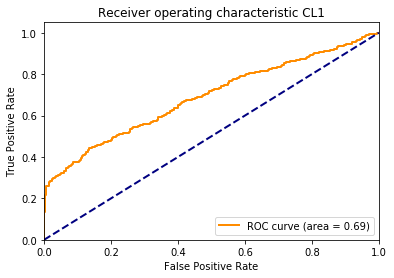

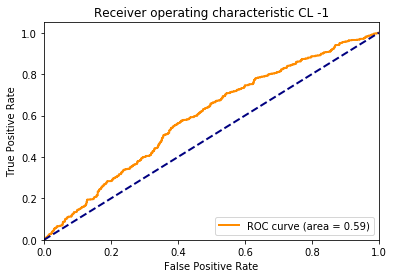

Number of Support vectors,S :  2954
Ratio of Support vectors,s :  0.74
------SVM applied on test set-----
Score for above parameters in SVC model for testset :  0.65


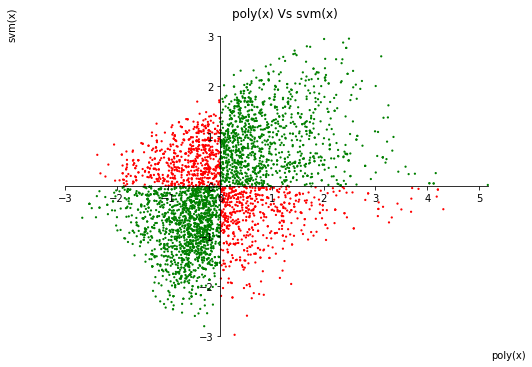

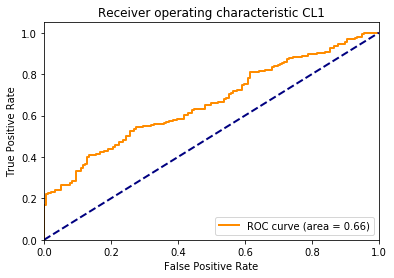

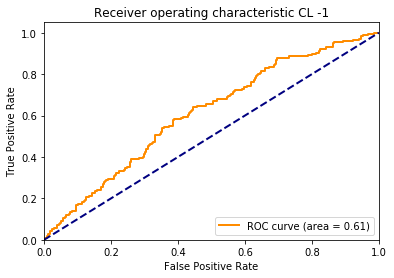

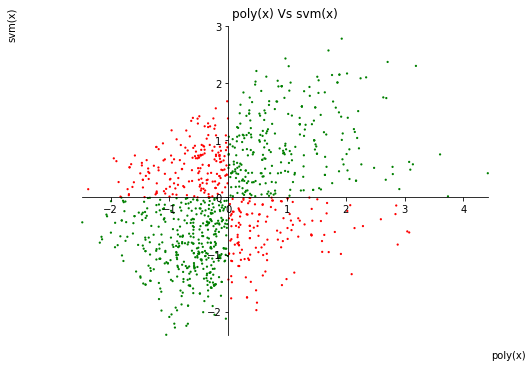

In [0]:
#creating dicitionary for parameters
parameters = {'C':5}
kernel_type = 'linear'
svm_linear.svm_call(kernel_type,parameters,False)

compute the percentages of correct prediction PredTrain and PredTest on the sets TRAIN and TEST


In [0]:
svm_linear.calc_correct_pred()
print(svm_linear.pred_train['pred'])
print(svm_linear.pred_test['pred'])

total    67.20
cl1      62.95
cl_1     71.45
Name: pred, dtype: float64
total    65.0
cl1      61.2
cl_1     68.8
Name: pred, dtype: float64


compute two confusion matrices (one for the set TRAIN and one for the test set
confusion matrices must be converted in terms of frequencies of correct predictions within each class


In [0]:
svm_linear.calc_confusionmatrix()
print(svm_linear.confmat_train)
print(svm_linear.confmat_test)

           pred_CL1  pred_CL_1
true_CL1      62.95      37.05
true_CL_1     28.55      71.45
           pred_CL1  pred_CL_1
true_CL1       61.2       38.8
true_CL_1      31.2       68.8


compute the errors of estimation on PredTRAIN, PredTEST, and on the terms of the confusion matrices


In [0]:
svm_linear.error_estimate()
print(svm_linear.pred_train)
print(svm_linear.pred_test)

        pred  error        conf_int
total  67.20   0.74  [65.75, 68.65]
cl1    62.95   1.08  [60.83, 65.07]
cl_1   71.45   1.01  [69.47, 73.43]
       pred  error        conf_int
total  65.0   1.51  [62.04, 67.96]
cl1    61.2   2.18  [56.93, 65.47]
cl_1   68.8   2.07  [64.74, 72.86]


In [0]:
print('confmat_train_error:\n',svm_linear.confmat_train_error)
print('confmat_train_confint:\n',svm_linear.confmat_train_confint)
print('confmat_test_error:\n',svm_linear.confmat_test_error)
print('confmat_test_confint:\n',svm_linear.confmat_test_confint)

confmat_train_error:
            pred_CL1  pred_CL_1
true_CL1       1.08       1.08
true_CL_1      1.01       1.01
confmat_train_confint:
                  pred_CL1       pred_CL_1
true_CL1   [60.83, 65.07]  [34.93, 39.17]
true_CL_1  [26.57, 30.53]  [69.47, 73.43]
confmat_test_error:
            pred_CL1  pred_CL_1
true_CL1       2.18       2.18
true_CL_1      2.07       2.07
confmat_test_confint:
                  pred_CL1       pred_CL_1
true_CL1   [56.93, 65.47]  [34.53, 43.07]
true_CL_1  [27.14, 35.26]  [64.74, 72.86]


interpret your results


# **Question 3 : optimize the parameter "cost"**

Select a list of 6 values for the "cost " parameter
Run the tuning function tune() for the linear svm() to identify the best value of "cost"


kernel_type :  linear
------Fitting train data into svm model-----
# Tuning hyper-parameters


Best parameters set found on development set:

{'C': 10, 'kernel': 'linear'}

Grid scores on development set:

0.666 (+/-0.048) for {'C': 0.001, 'kernel': 'linear'}
0.667 (+/-0.044) for {'C': 0.01, 'kernel': 'linear'}
0.672 (+/-0.053) for {'C': 0.1, 'kernel': 'linear'}
0.672 (+/-0.055) for {'C': 1, 'kernel': 'linear'}
0.673 (+/-0.055) for {'C': 10, 'kernel': 'linear'}
0.673 (+/-0.057) for {'C': 100, 'kernel': 'linear'}
------Fitting train data into svm model-----


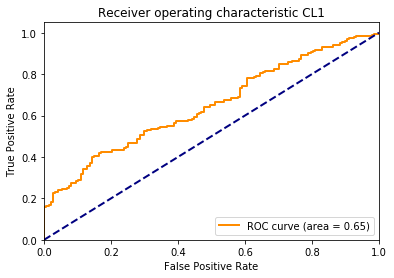

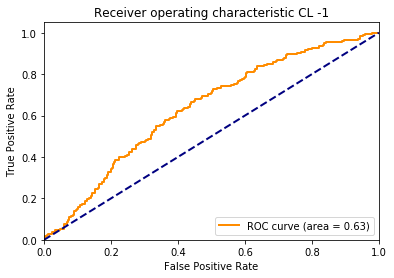

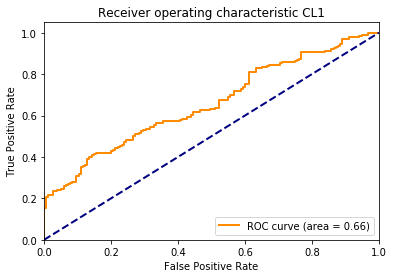

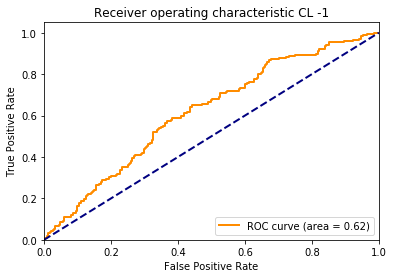

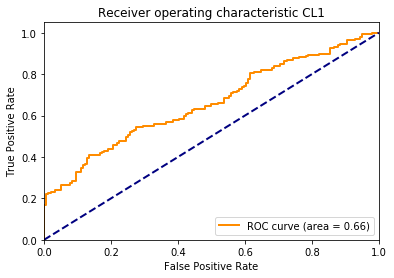

...

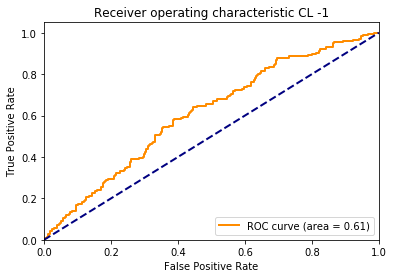

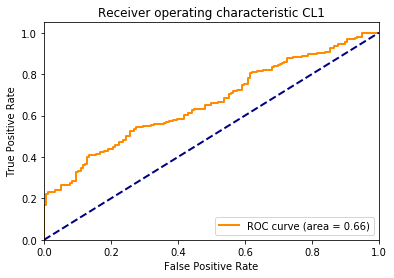

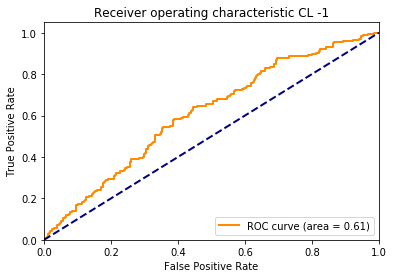

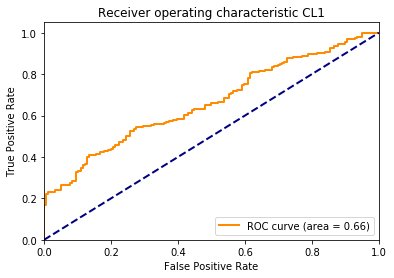

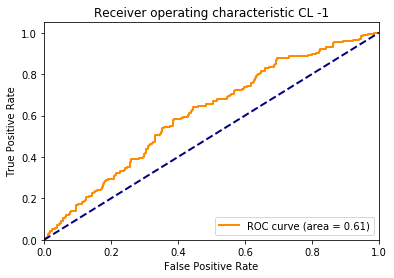

df_tune_data:
       cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0    0.001    NaN    NaN     3511.0      0.88    0.6655     0.647      0.0185
1    0.010    NaN    NaN     3046.0      0.76    0.6690     0.649      0.0200
2    0.100    NaN    NaN     2966.0      0.74    0.6720     0.651      0.0210
3    1.000    NaN    NaN     2954.0      0.74    0.6720     0.650      0.0220
4   10.000    NaN    NaN     2954.0      0.74    0.6720     0.650      0.0220
5  100.000    NaN    NaN     2954.0      0.74    0.6720     0.650      0.0220
------calculating scores for test data for various svm models-----


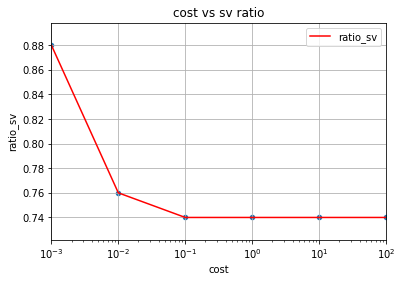

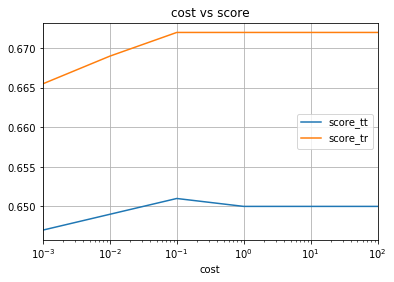

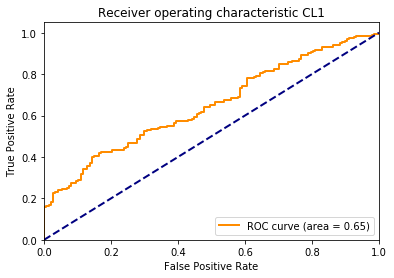

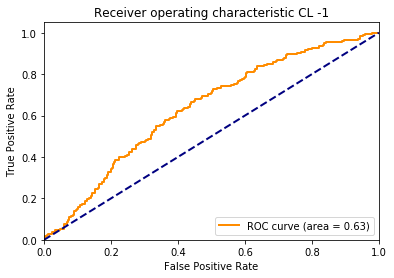

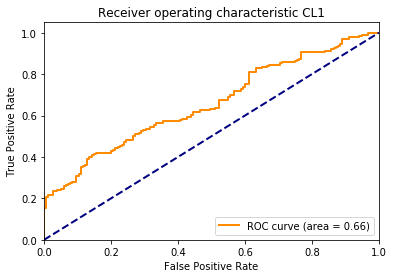

...

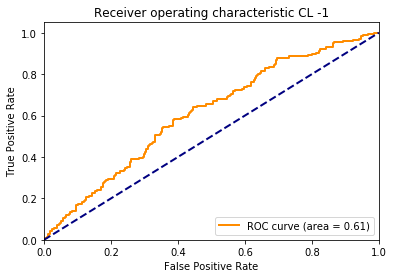

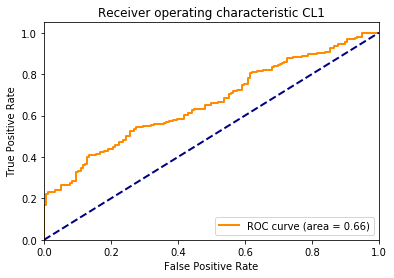

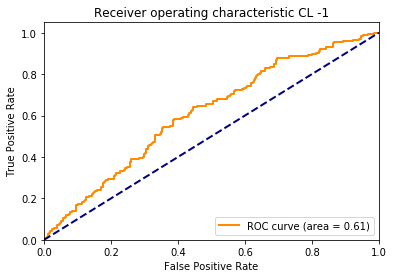

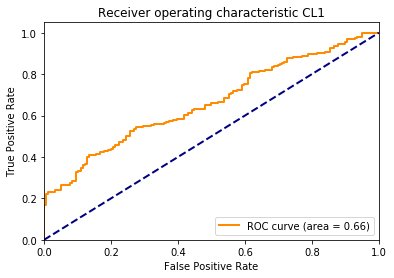

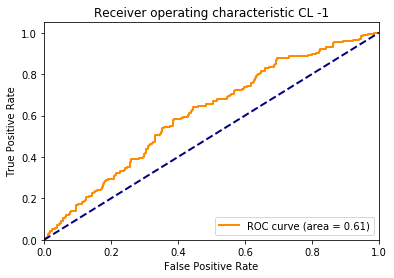

df_tune_data:
       cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0    0.001    NaN    NaN     3511.0      0.88    0.6655     0.647      0.0185
1    0.010    NaN    NaN     3046.0      0.76    0.6690     0.649      0.0200
2    0.100    NaN    NaN     2966.0      0.74    0.6720     0.651      0.0210
3    1.000    NaN    NaN     2954.0      0.74    0.6720     0.650      0.0220
4   10.000    NaN    NaN     2954.0      0.74    0.6720     0.650      0.0220
5  100.000    NaN    NaN     2954.0      0.74    0.6720     0.650      0.0220


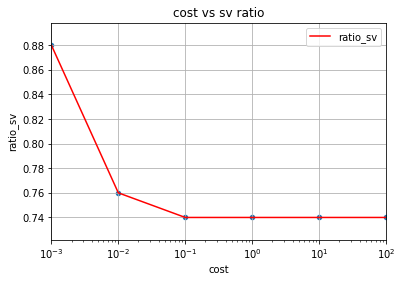

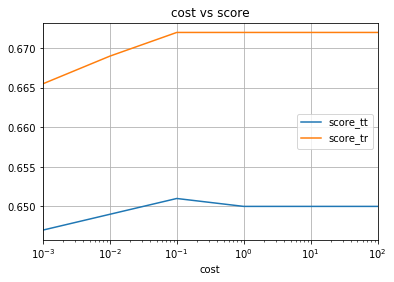

In [0]:
# Set the parameters by cross-validation
tuned_parameters = {'kernel': ['linear'], 'C': [0.001, 0.01, 0.1, 1, 10,100]}
nfolds = 10
#building SVMs with train dataset and calculating SV ratio and scores
svm_linear.tune(tuned_parameters,nfolds,False)

Evaluate the performance characteristics of the "best" linear svm as in question 2

In [0]:
svm_linear.best_params 

{'C': 10, 'kernel': 'linear'}

kernel_type :  linear
------Fitting train data into svm model-----
# Tuning hyper-parameters


Best parameters set found on development set:

{'C': 5, 'kernel': 'linear'}

Grid scores on development set:

0.672 (+/-0.053) for {'C': 0.1, 'kernel': 'linear'}
0.672 (+/-0.055) for {'C': 1, 'kernel': 'linear'}
0.673 (+/-0.055) for {'C': 5, 'kernel': 'linear'}
0.673 (+/-0.055) for {'C': 10, 'kernel': 'linear'}
0.672 (+/-0.056) for {'C': 15, 'kernel': 'linear'}
------Fitting train data into svm model-----


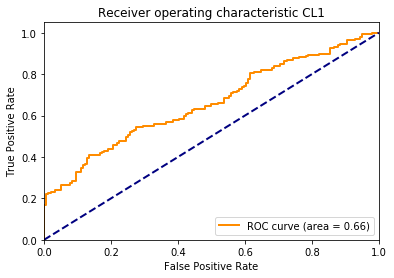

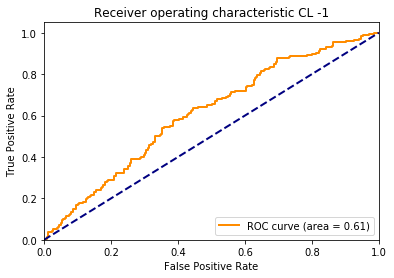

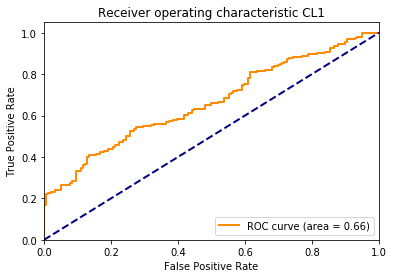

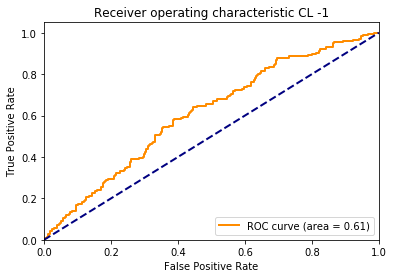

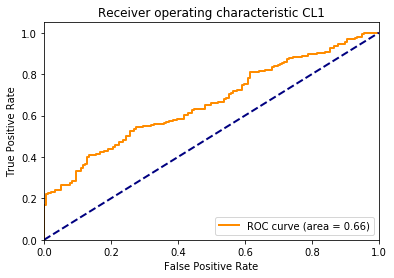

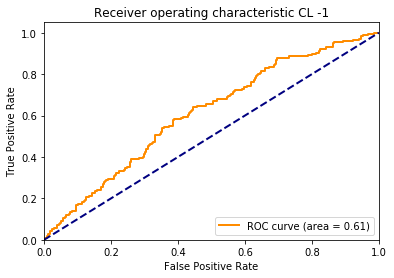

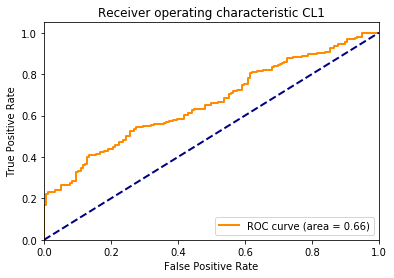

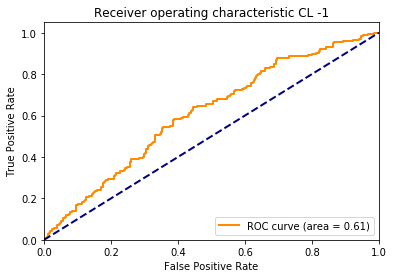

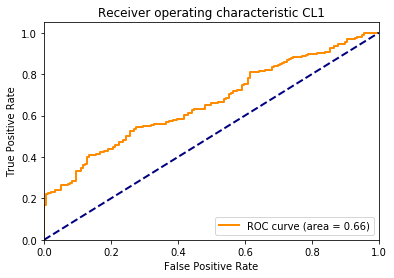

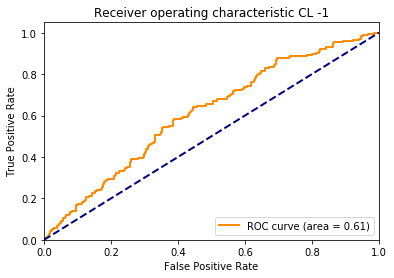

df_tune_data:
    cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0   0.1    NaN    NaN     2966.0      0.74     0.672     0.651       0.021
1   1.0    NaN    NaN     2954.0      0.74     0.672     0.650       0.022
2   5.0    NaN    NaN     2954.0      0.74     0.672     0.650       0.022
3  10.0    NaN    NaN     2954.0      0.74     0.672     0.650       0.022
4  15.0    NaN    NaN     2954.0      0.74     0.672     0.650       0.022
------calculating scores for test data for various svm models-----


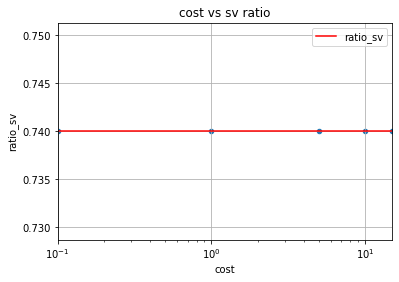

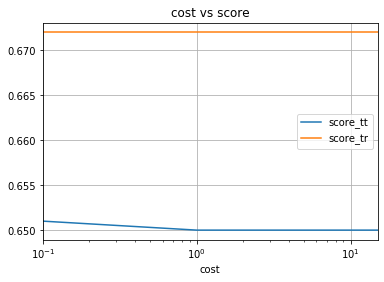

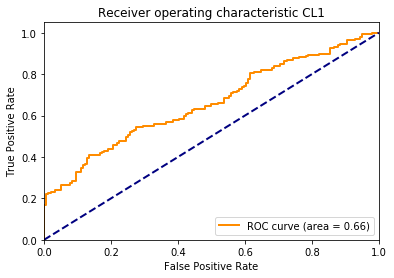

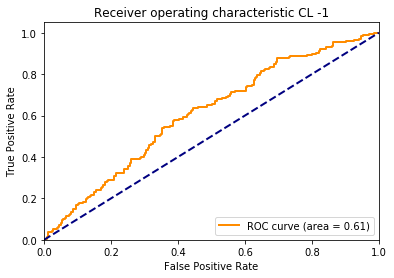

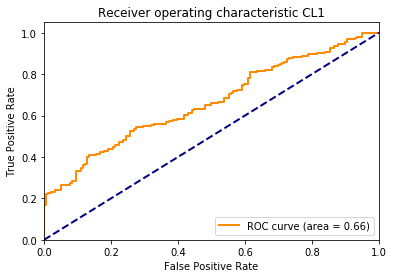

...

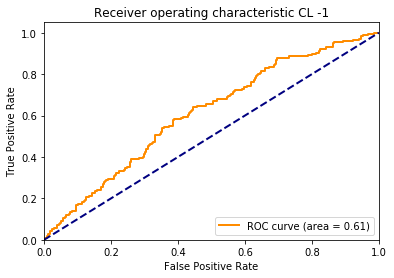

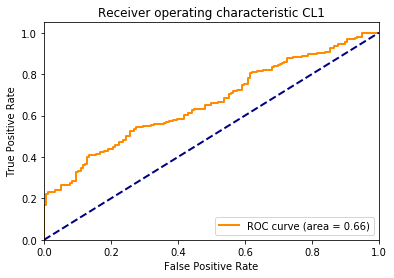

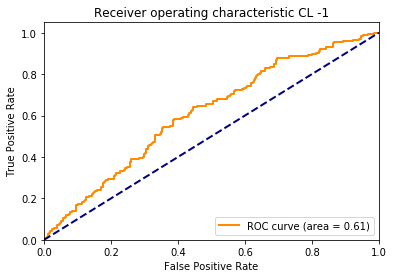

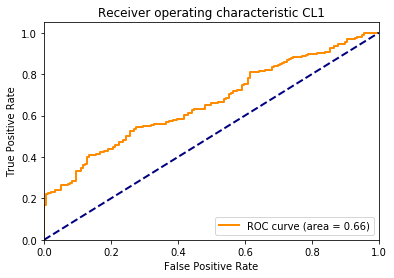

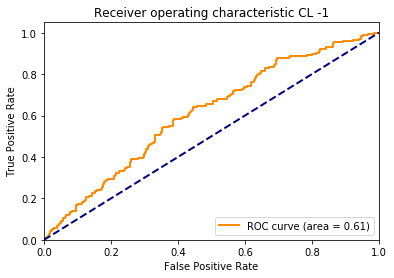

df_tune_data:
    cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0   0.1    NaN    NaN     2966.0      0.74     0.672     0.651       0.021
1   1.0    NaN    NaN     2954.0      0.74     0.672     0.650       0.022
2   5.0    NaN    NaN     2954.0      0.74     0.672     0.650       0.022
3  10.0    NaN    NaN     2954.0      0.74     0.672     0.650       0.022
4  15.0    NaN    NaN     2954.0      0.74     0.672     0.650       0.022


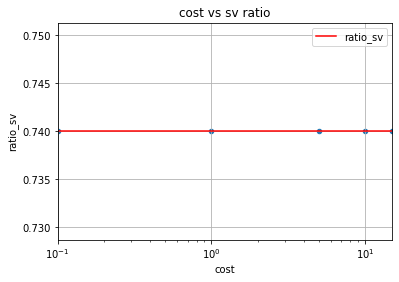

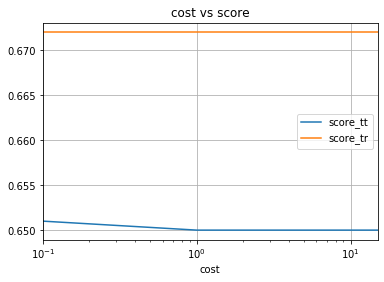

In [0]:
# Set the parameters by cross-validation for finetuning 0.1 to 20
tuned_parameters = {'kernel': ['linear'], 'C': [0.1, 1, 5,10,15]}
nfolds = 10
#building SVMs with train dataset and calculating SV ratio and scores
svm_linear.tune(tuned_parameters,nfolds,False)

kernel_type:  linear
parameters:  {'C': 5, 'kernel': 'linear'}
------Fitting train data into svm model-----
Score for above parameters in SVC model :  0.672


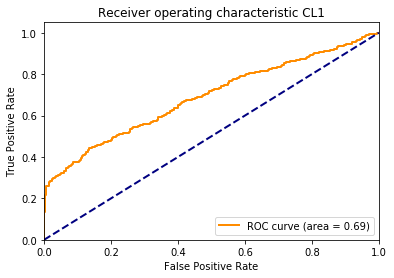

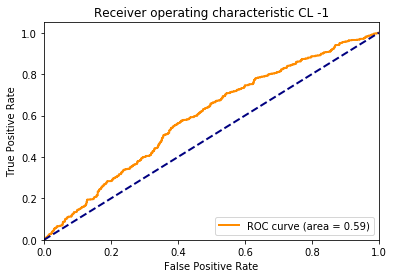

Number of Support vectors,S :  2954
Ratio of Support vectors,s :  0.74
------SVM applied on test set-----
Score for above parameters in SVC model for testset :  0.65


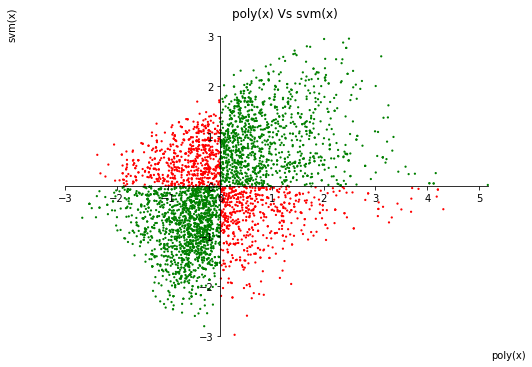

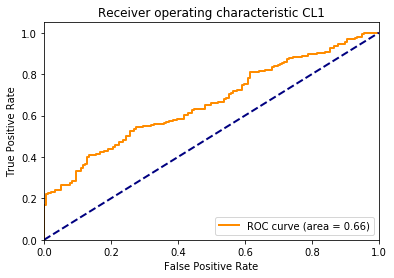

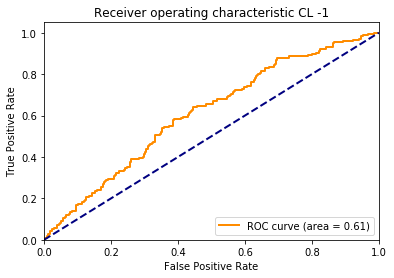

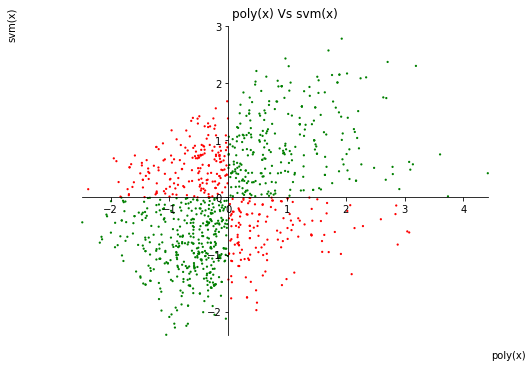

In [0]:
#creating svm_master for best
kernel_type = svm_linear.best_params['kernel']
parameters = svm_linear.best_params 
svm_linear.svm_call(kernel_type,parameters,False)


In [0]:
#support vectors
#counting support vectors and their proportion


#calculating PredTrain and PredTest for best SVM
svm_linear.calc_correct_pred()
print(svm_linear.pred_train['pred'])
print(svm_linear.pred_test['pred'])

total    67.20
cl1      62.95
cl_1     71.45
Name: pred, dtype: float64
total    65.0
cl1      61.2
cl_1     68.8
Name: pred, dtype: float64


In [0]:
#calulating confusion matrix for best params
svm_linear.calc_confusionmatrix()
print(svm_linear.confmat_train)
print(svm_linear.confmat_test)

           pred_CL1  pred_CL_1
true_CL1      62.95      37.05
true_CL_1     28.55      71.45
           pred_CL1  pred_CL_1
true_CL1       61.2       38.8
true_CL_1      31.2       68.8


In [0]:
#error estimation for best params
svm_linear.error_estimate()
print(svm_linear.pred_train)
print(svm_linear.pred_test)
print('confmat_train_error:\n',svm_linear.confmat_train_error)
print('confmat_train_confint:\n',svm_linear.confmat_train_confint)
print('confmat_test_error:\n',svm_linear.confmat_test_error)
print('confmat_test_confint:\n',svm_linear.confmat_test_confint)

        pred  error        conf_int
total  67.20   0.74  [65.75, 68.65]
cl1    62.95   1.08  [60.83, 65.07]
cl_1   71.45   1.01  [69.47, 73.43]
       pred  error        conf_int
total  65.0   1.51  [62.04, 67.96]
cl1    61.2   2.18  [56.93, 65.47]
cl_1   68.8   2.07  [64.74, 72.86]
confmat_train_error:
            pred_CL1  pred_CL_1
true_CL1       1.08       1.08
true_CL_1      1.01       1.01
confmat_train_confint:
                  pred_CL1       pred_CL_1
true_CL1   [60.83, 65.07]  [34.93, 39.17]
true_CL_1  [26.57, 30.53]  [69.47, 73.43]
confmat_test_error:
            pred_CL1  pred_CL_1
true_CL1       2.18       2.18
true_CL_1      2.07       2.07
confmat_test_confint:
                  pred_CL1       pred_CL_1
true_CL1   [56.93, 65.47]  [34.53, 43.07]
true_CL_1  [27.14, 35.26]  [64.74, 72.86]


# Question 4: SVM classification by radial kernel
Fix the "cost" parameter in the svm() function to the best cost value identified in question 3
Select the kernel parameter kernel = "radial " which means that the kernel ks given by the formula
K(x,y) = exp(-gamma || x- y ||2)
Select arbitrarily the gamma parameter "gamma" = 1
Run the svm() function on the set TRAIN


In [0]:
svm_radial = SvmClassification(simulated_data.train_data,simulated_data.test_data)

as in question 2 compute the number S and the ratio s = S/4000


kernel_type:  rbf
------Fitting train data into svm model-----
Score for above parameters in SVC model :  0.995


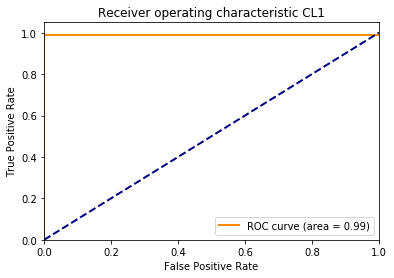

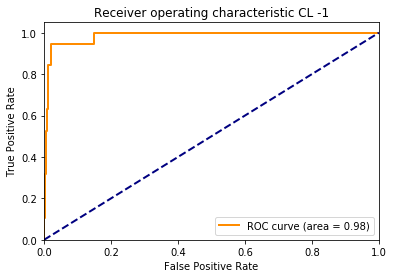

Number of Support vectors,S :  472
Ratio of Support vectors,s :  0.12
------SVM applied on test set-----
Score for above parameters in SVC model for testset :  0.986


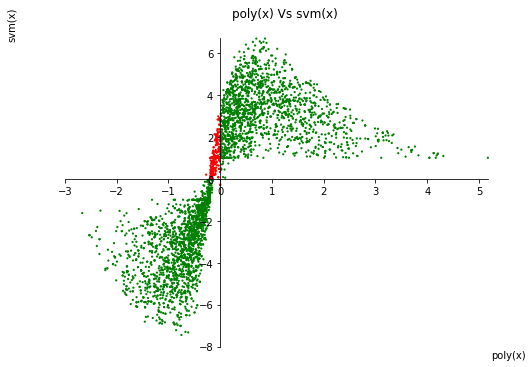

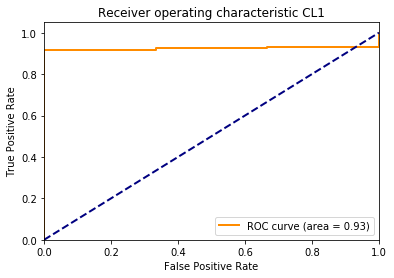

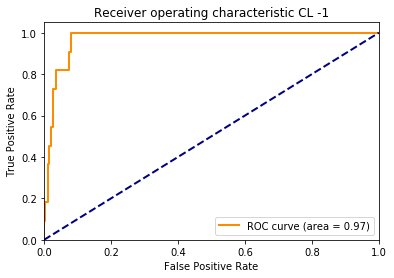

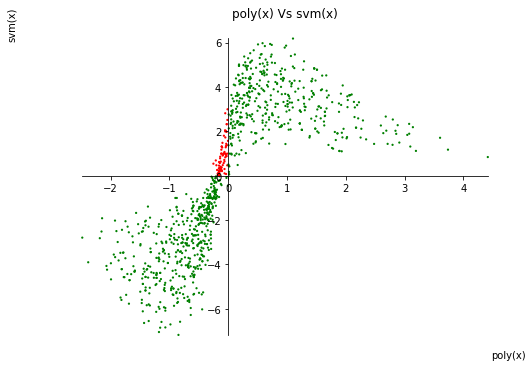

In [0]:
#Build Radial kernel SVM with cost as linear's best cost and gamma = 1
parameters = {'kernel': ['rbf'], 'C': svm_linear.best_params['C'],'gamma' : 1}
#build SVM with Training set
svm_radial.svm_call("rbf",parameters,False)

the percentages of correct predictions PredTrain and PredTest and the two confusion matrices


In [0]:
svm_radial.calc_correct_pred()
print('Predictions Train:\n',svm_radial.pred_train)
print('Predictions Test:\n',svm_radial.pred_test)

Predictions Train:
         pred  error  conf_int
total  99.50      0         0
cl1    99.05      0         0
cl_1   99.95      0         0
Predictions Test:
        pred  error  conf_int
total  98.6      0         0
cl1    97.8      0         0
cl_1   99.4      0         0


In [0]:
svm_radial.calc_confusionmatrix()
print('Confusion matrix for Train:\n',svm_radial.confmat_train)
print('Confusion matrix for Test:\n',svm_radial.confmat_test)


Confusion matrix for Train:
            pred_CL1  pred_CL_1
true_CL1      99.05       0.95
true_CL_1      0.05      99.95
Confusion matrix for Test:
            pred_CL1  pred_CL_1
true_CL1       97.8        2.2
true_CL_1       0.6       99.4


In [0]:
svm_radial.error_estimate()
print('prediction errors train:\n',svm_radial.pred_train)
print('prediction errors test:\n',svm_radial.pred_test)

print('confmat_train_error:\n',svm_radial.confmat_train_error)
print('confmat_train_confint:\n',svm_radial.confmat_train_confint)
print('confmat_test_error:\n',svm_radial.confmat_test_error)
print('confmat_test_confint:\n',svm_radial.confmat_test_confint)

prediction errors train:
         pred  error        conf_int
total  99.50   0.11  [99.28, 99.72]
cl1    99.05   0.22  [98.62, 99.48]
cl_1   99.95   0.05    [99.85, 100]
prediction errors test:
        pred  error        conf_int
total  98.6   0.37  [97.87, 99.33]
cl1    97.8   0.66  [96.51, 99.09]
cl_1   99.4   0.35    [98.71, 100]
confmat_train_error:
            pred_CL1  pred_CL_1
true_CL1       0.22       0.22
true_CL_1      0.05       0.05
confmat_train_confint:
                  pred_CL1     pred_CL_1
true_CL1   [98.62, 99.48]  [0.52, 1.38]
true_CL_1       [0, 0.15]  [99.85, 100]
confmat_test_error:
            pred_CL1  pred_CL_1
true_CL1       0.66       0.66
true_CL_1      0.35       0.35
confmat_test_confint:
                  pred_CL1     pred_CL_1
true_CL1   [96.51, 99.09]  [0.91, 3.49]
true_CL_1       [0, 1.29]  [98.71, 100]


interpret your results

# Question 5 : optimize the parameter "cost"and "gamma"
Select a list of 5 values for the "cost " parameter and a list of 5 values for the parameter "gamma"
On the TRAIN set , run the tuning function tune() for the radial svm() to identify the best value of the
pair ("cost", "gamma") among the 25 values you have listed


kernel_type :  rbf
------Fitting train data into svm model-----
# Tuning hyper-parameters


Best parameters set found on development set:

{'C': 5, 'gamma': 0.1, 'kernel': 'rbf'}

Grid scores on development set:

0.897 (+/-0.017) for {'C': 5, 'gamma': 0.01, 'kernel': 'rbf'}
0.979 (+/-0.005) for {'C': 5, 'gamma': 0.1, 'kernel': 'rbf'}
0.975 (+/-0.010) for {'C': 5, 'gamma': 1.0, 'kernel': 'rbf'}
0.958 (+/-0.012) for {'C': 5, 'gamma': 10.0, 'kernel': 'rbf'}
0.718 (+/-0.024) for {'C': 5, 'gamma': 100.0, 'kernel': 'rbf'}
------Fitting train data into svm model-----


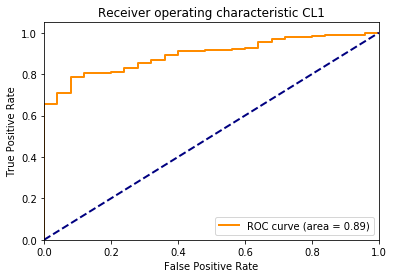

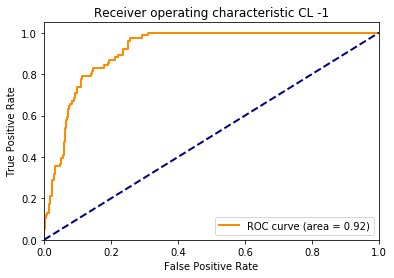

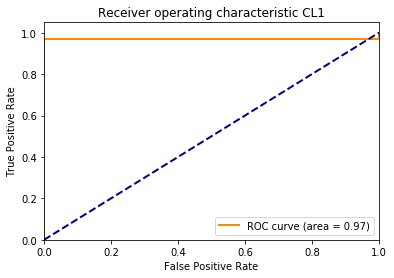

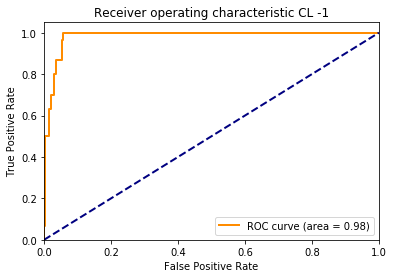

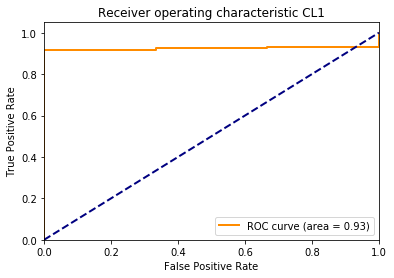

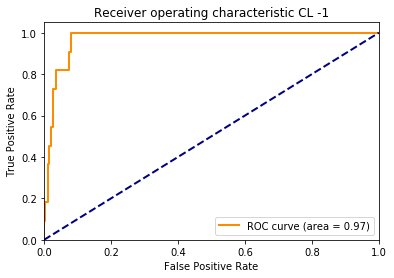

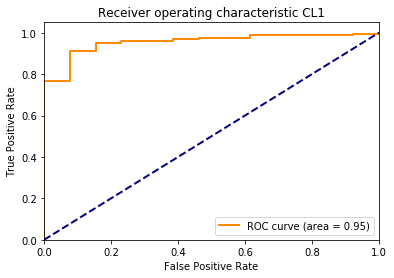

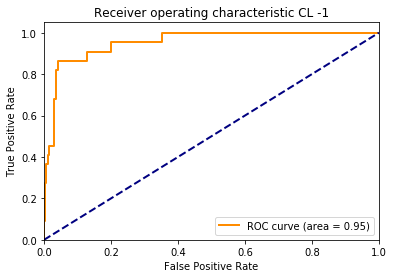

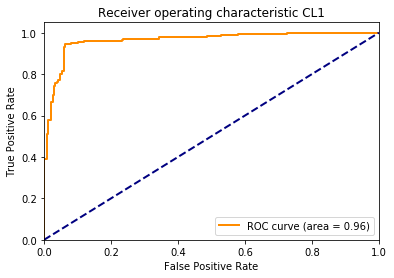

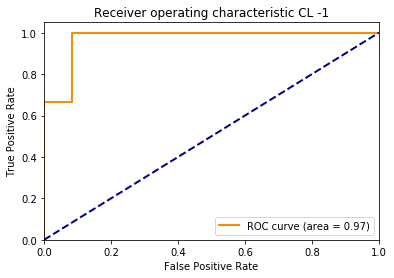

df_tune_data:
    cost   gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0   5.0    0.01    NaN     2074.0      0.52   0.90725     0.899     0.00825
1   5.0    0.10    NaN      643.0      0.16   0.98375     0.969     0.01475
2   5.0    1.00    NaN      472.0      0.12   0.99500     0.986     0.00900
3   5.0   10.00    NaN     2970.0      0.74   1.00000     0.965     0.03500
4   5.0  100.00    NaN     3227.0      0.81   1.00000     0.760     0.24000


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 5.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


------calculating scores for test data for various svm models-----


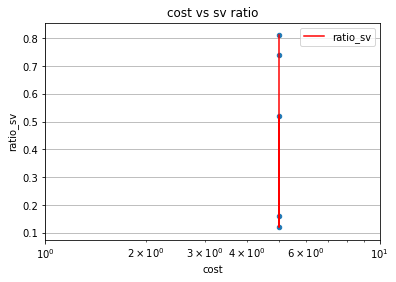

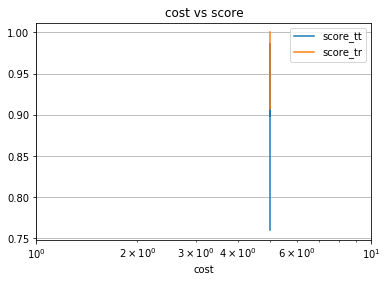

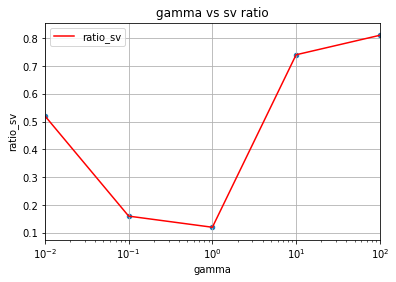

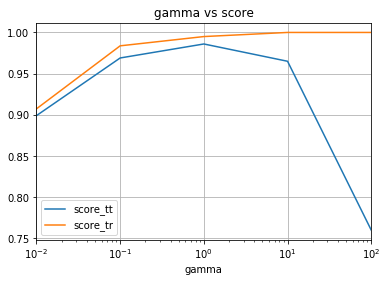

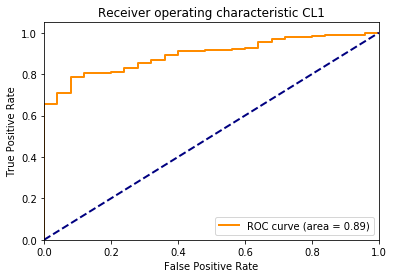

...

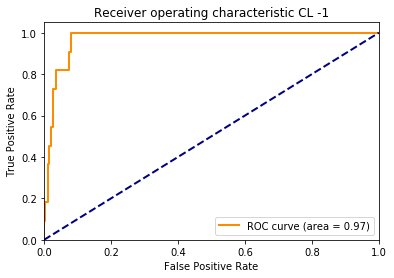

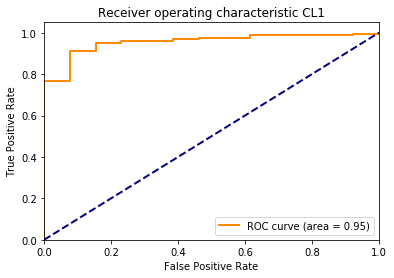

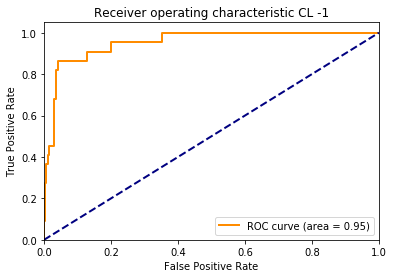

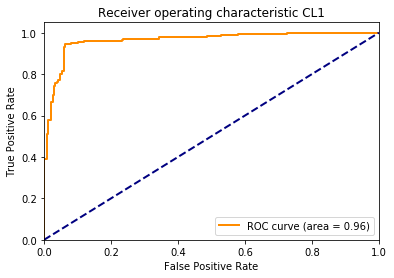

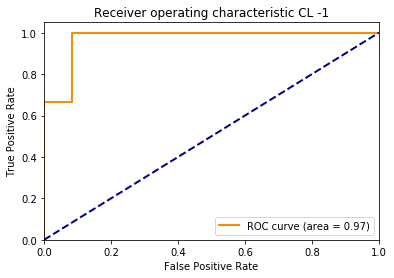

df_tune_data:
    cost   gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0   5.0    0.01    NaN     2074.0      0.52   0.90725     0.899     0.00825
1   5.0    0.10    NaN      643.0      0.16   0.98375     0.969     0.01475
2   5.0    1.00    NaN      472.0      0.12   0.99500     0.986     0.00900
3   5.0   10.00    NaN     2970.0      0.74   1.00000     0.965     0.03500
4   5.0  100.00    NaN     3227.0      0.81   1.00000     0.760     0.24000


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 5.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


in heatmap: rbf


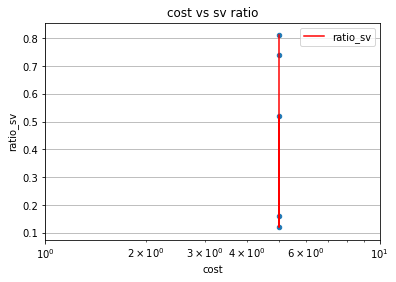

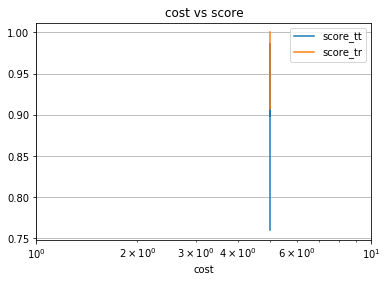

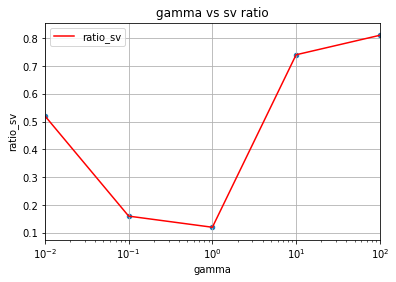

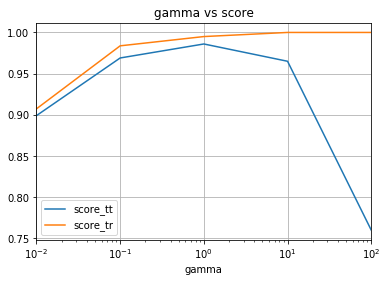

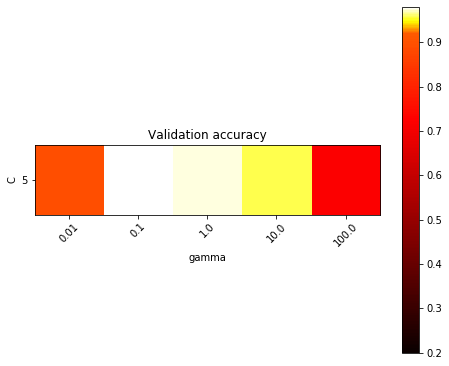

In [0]:
# Set the parameters by cross-validation with C= best_param of linear and gamma as below

C_range = [svm_linear.best_params['C']]
gamma_range = np.logspace(-2, 2, 5)

tuned_parameters = {'kernel': ['rbf'], 'C': C_range, 'gamma': gamma_range}
nfolds = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=42)

svm_radial.tune(tuned_parameters,nfolds,False)

kernel_type :  rbf
------Fitting train data into svm model-----
# Tuning hyper-parameters


Best parameters set found on development set:

{'C': 5, 'gamma': 0.1, 'kernel': 'rbf'}

Grid scores on development set:

0.979 (+/-0.005) for {'C': 5, 'gamma': 0.1, 'kernel': 'rbf'}
0.974 (+/-0.006) for {'C': 5, 'gamma': 0.05, 'kernel': 'rbf'}
0.975 (+/-0.010) for {'C': 5, 'gamma': 1, 'kernel': 'rbf'}
0.967 (+/-0.011) for {'C': 5, 'gamma': 5, 'kernel': 'rbf'}
0.962 (+/-0.012) for {'C': 5, 'gamma': 8, 'kernel': 'rbf'}
------Fitting train data into svm model-----


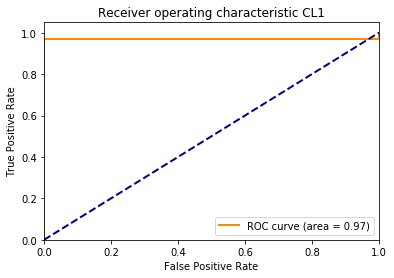

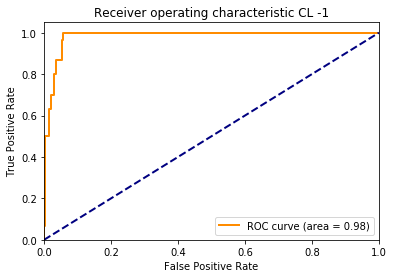

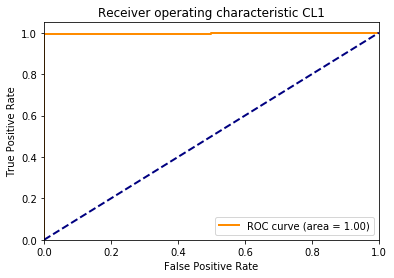

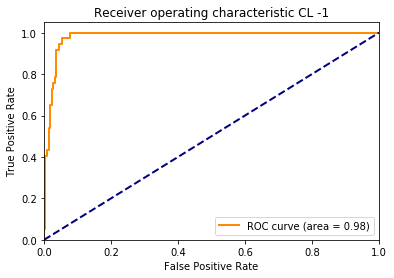

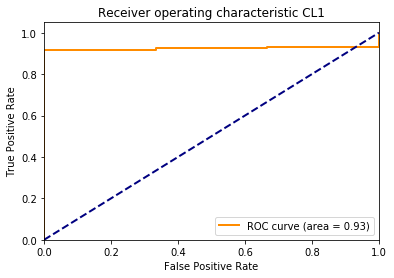

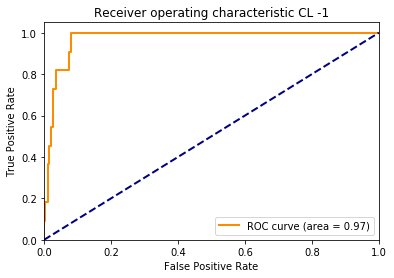

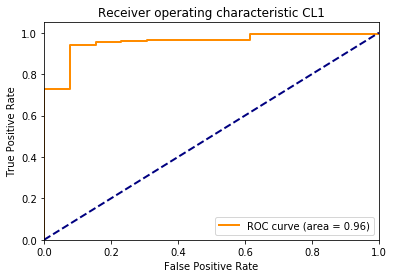

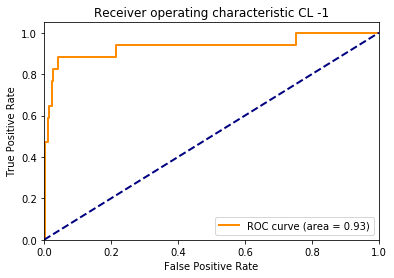

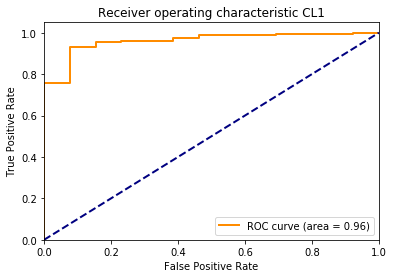

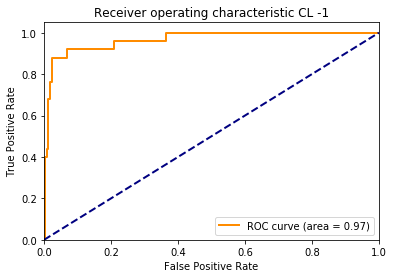

df_tune_data:
    cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0   5.0   0.10    NaN      643.0      0.16   0.98375     0.969     0.01475
1   5.0   0.05    NaN      901.0      0.23   0.97825     0.961     0.01725
2   5.0   1.00    NaN      472.0      0.12   0.99500     0.986     0.00900
3   5.0   5.00    NaN     1835.0      0.46   0.99925     0.970     0.02925
4   5.0   8.00    NaN     2703.0      0.68   0.99975     0.962     0.03775


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 5.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


------calculating scores for test data for various svm models-----


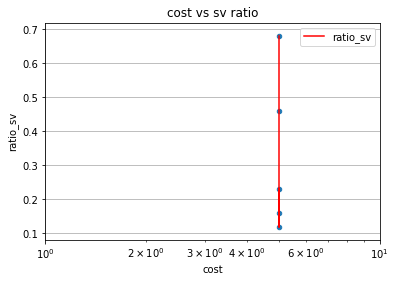

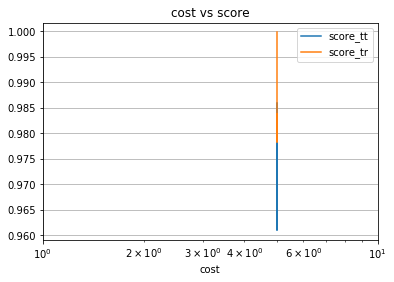

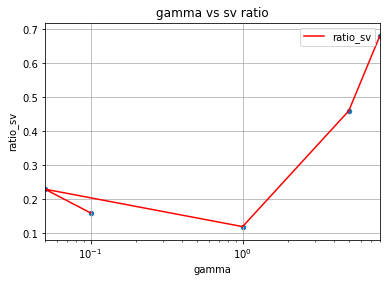

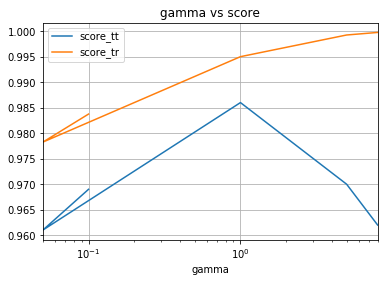

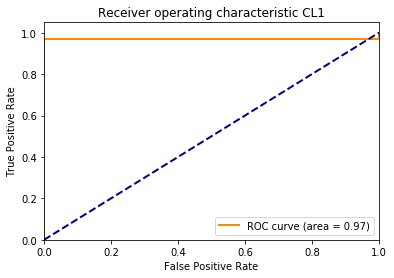

...

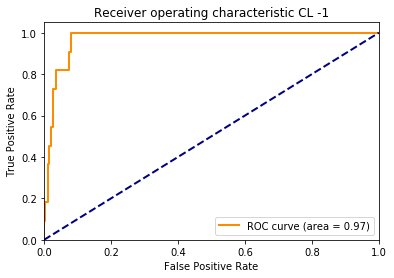

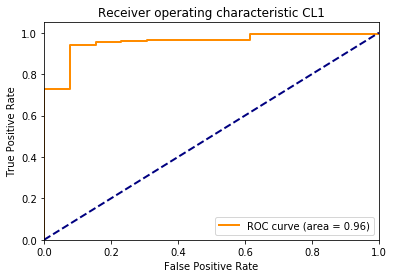

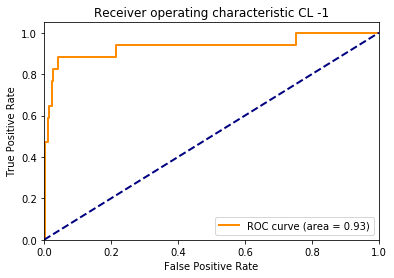

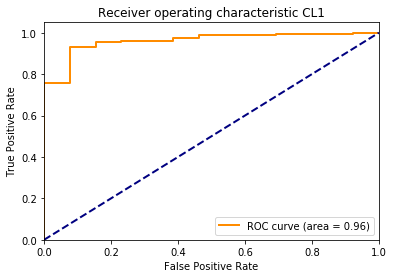

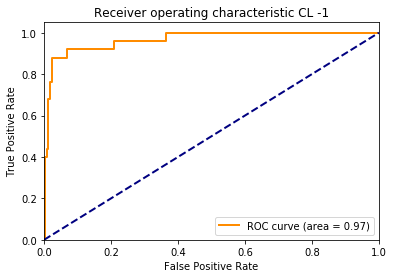

df_tune_data:
    cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0   5.0   0.10    NaN      643.0      0.16   0.98375     0.969     0.01475
1   5.0   0.05    NaN      901.0      0.23   0.97825     0.961     0.01725
2   5.0   1.00    NaN      472.0      0.12   0.99500     0.986     0.00900
3   5.0   5.00    NaN     1835.0      0.46   0.99925     0.970     0.02925
4   5.0   8.00    NaN     2703.0      0.68   0.99975     0.962     0.03775


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 5.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


in heatmap: rbf


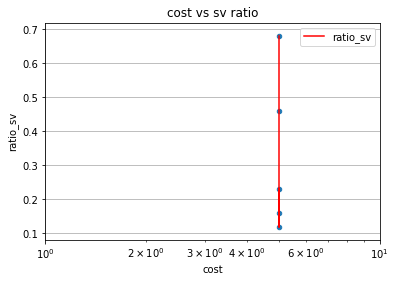

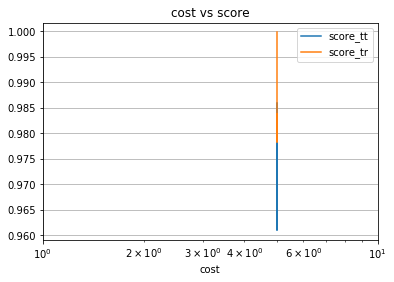

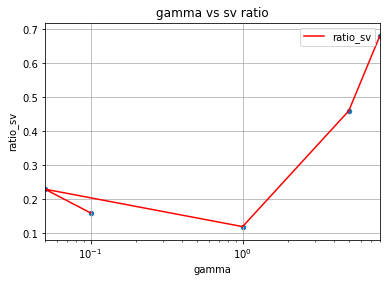

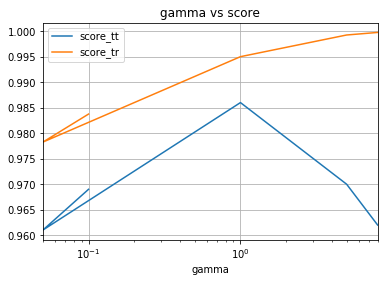

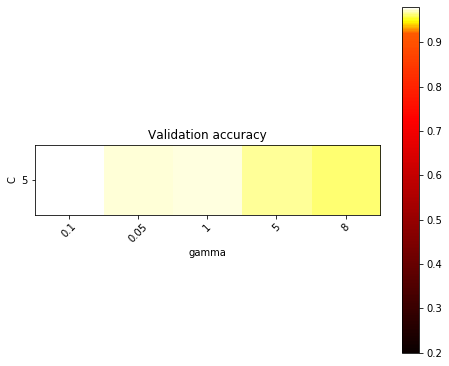

In [0]:
#finetuning for gamma between 0.1 to 10
C_range = [svm_linear.best_params['C']]
gamma_range = [0.1,0.05,1,5,8]

tuned_parameters = {'kernel': ['rbf'], 'C': C_range, 'gamma': gamma_range}
nfolds = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=42)
svm_radial.tune(tuned_parameters,nfolds,False)


kernel_type :  rbf
------Fitting train data into svm model-----
# Tuning hyper-parameters


Best parameters set found on development set:

{'C': 10.0, 'gamma': 1, 'kernel': 'rbf'}

Grid scores on development set:

0.923 (+/-0.019) for {'C': 0.01, 'gamma': 1, 'kernel': 'rbf'}
0.954 (+/-0.008) for {'C': 0.1, 'gamma': 1, 'kernel': 'rbf'}
0.973 (+/-0.008) for {'C': 1.0, 'gamma': 1, 'kernel': 'rbf'}
0.979 (+/-0.007) for {'C': 10.0, 'gamma': 1, 'kernel': 'rbf'}
0.977 (+/-0.008) for {'C': 100.0, 'gamma': 1, 'kernel': 'rbf'}
------Fitting train data into svm model-----


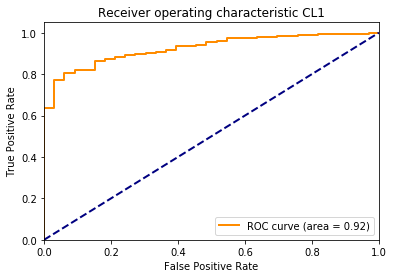

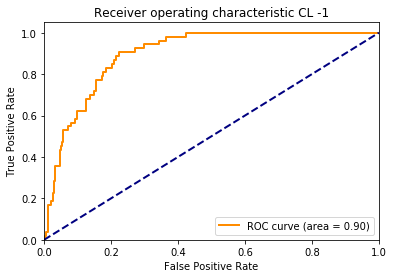

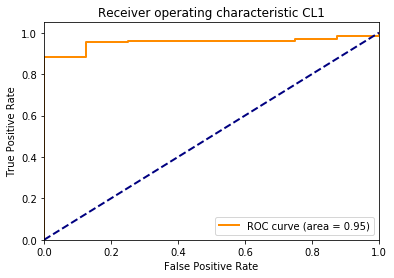

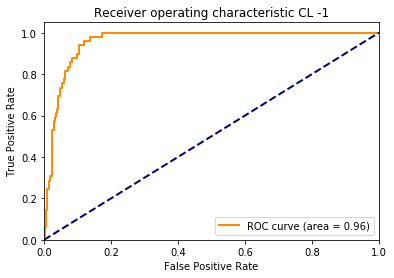

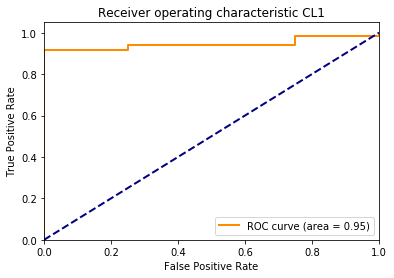

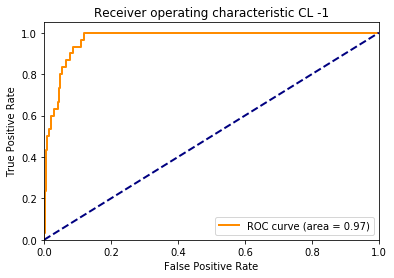

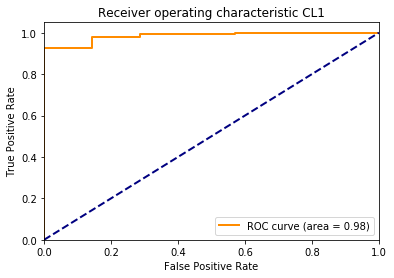

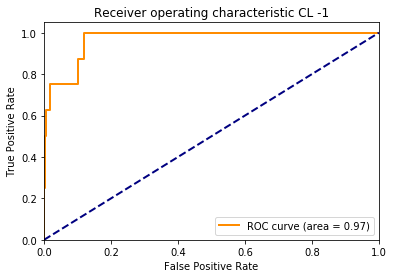

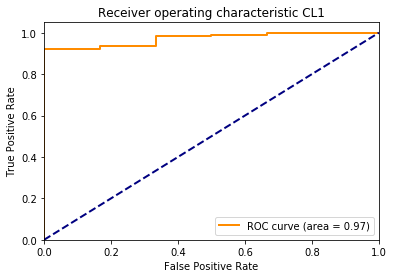

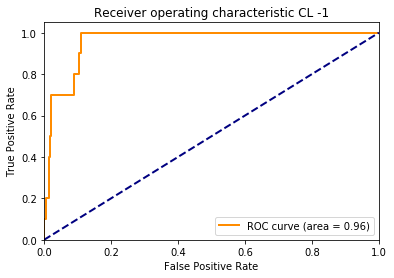

df_tune_data:
      cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0    0.01    1.0    NaN     3828.0      0.96   0.93350     0.914     0.01950
1    0.10    1.0    NaN     1748.0      0.44   0.97225     0.943     0.02925
2    1.00    1.0    NaN      783.0      0.20   0.98450     0.966     0.01850
3   10.00    1.0    NaN      384.0      0.10   0.99650     0.985     0.01150
4  100.00    1.0    NaN      291.0      0.07   0.99975     0.984     0.01575


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


------calculating scores for test data for various svm models-----


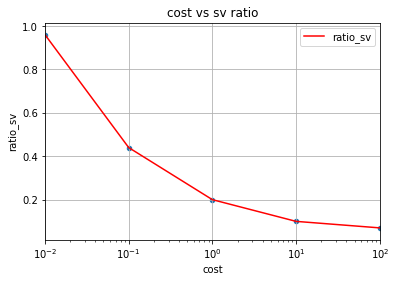

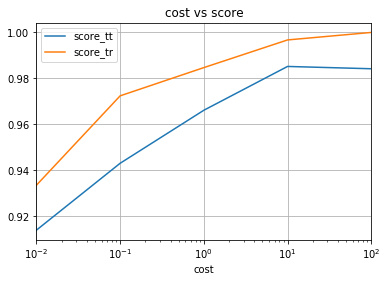

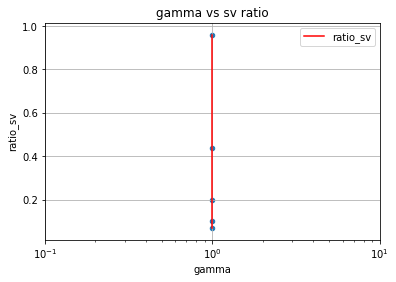

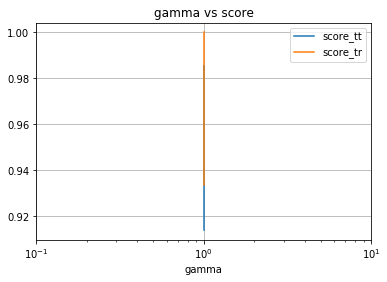

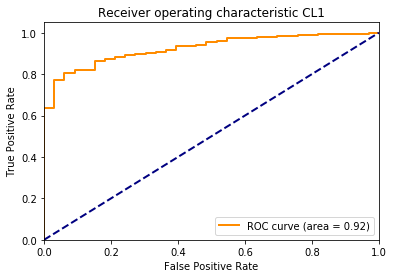

...

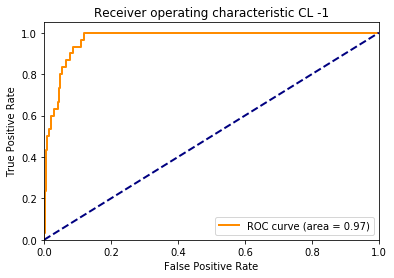

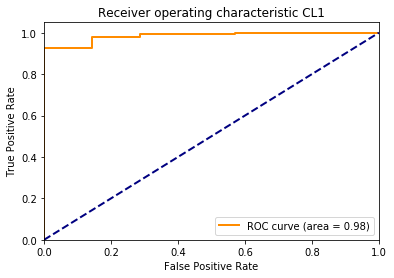

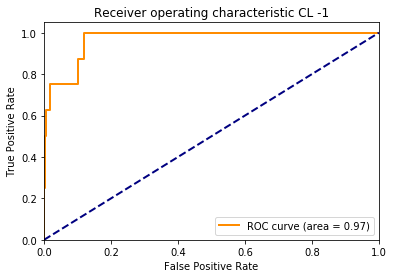

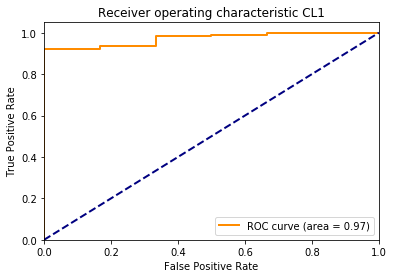

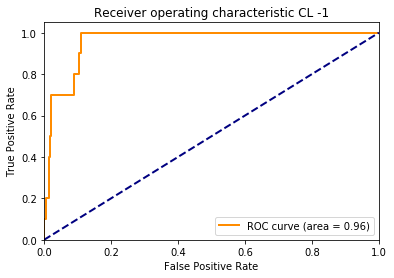

df_tune_data:
      cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0    0.01    1.0    NaN     3828.0      0.96   0.93350     0.914     0.01950
1    0.10    1.0    NaN     1748.0      0.44   0.97225     0.943     0.02925
2    1.00    1.0    NaN      783.0      0.20   0.98450     0.966     0.01850
3   10.00    1.0    NaN      384.0      0.10   0.99650     0.985     0.01150
4  100.00    1.0    NaN      291.0      0.07   0.99975     0.984     0.01575


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


in heatmap: rbf


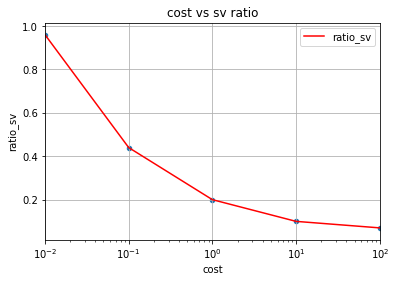

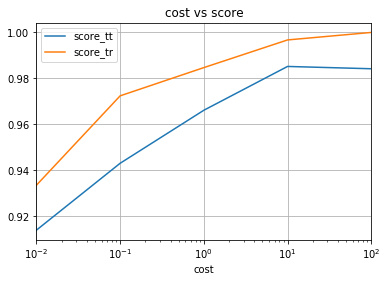

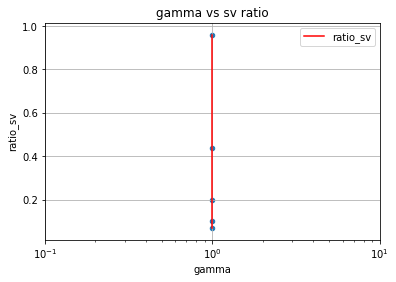

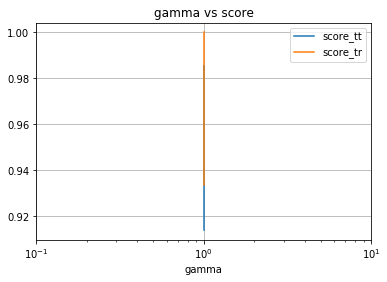

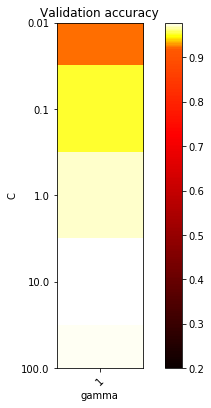

In [0]:
# gamma fixed to 0.1

#broad tuning  for cost 
C_range = np.logspace(-2, 2, 5)
gamma_range = [1]

tuned_parameters = {'kernel': ['rbf'], 'C': C_range, 'gamma': gamma_range}
nfolds = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=42)
svm_radial.tune(tuned_parameters,nfolds,False)

kernel_type :  rbf
------Fitting train data into svm model-----
# Tuning hyper-parameters


Best parameters set found on development set:

{'C': 110, 'gamma': 0.1, 'kernel': 'rbf'}

Grid scores on development set:

0.989 (+/-0.007) for {'C': 80, 'gamma': 0.1, 'kernel': 'rbf'}
0.989 (+/-0.007) for {'C': 90, 'gamma': 0.1, 'kernel': 'rbf'}
0.990 (+/-0.006) for {'C': 95, 'gamma': 0.1, 'kernel': 'rbf'}
0.990 (+/-0.006) for {'C': 100, 'gamma': 0.1, 'kernel': 'rbf'}
0.991 (+/-0.006) for {'C': 110, 'gamma': 0.1, 'kernel': 'rbf'}
------Fitting train data into svm model-----


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


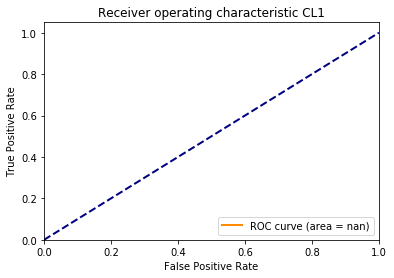

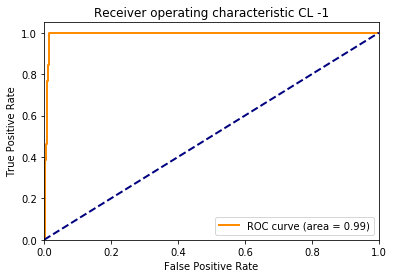

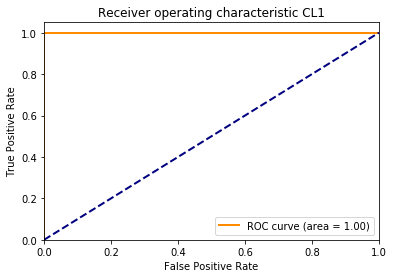

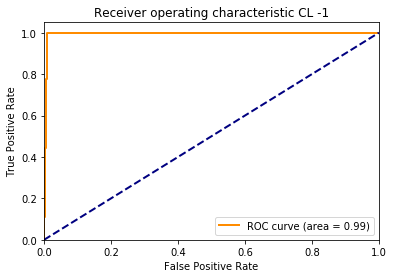

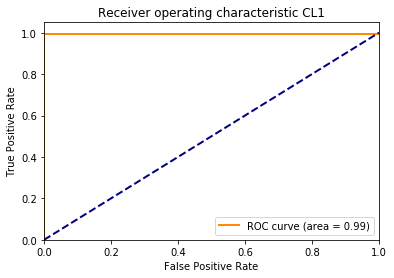

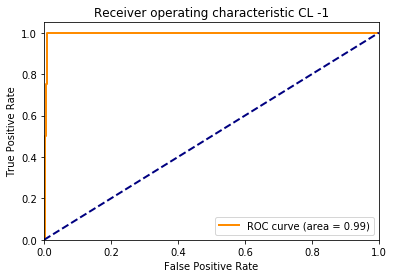

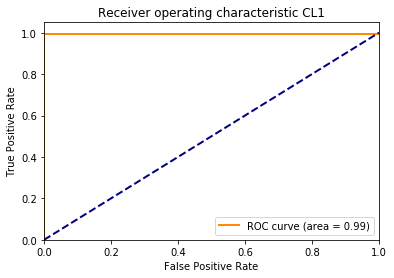

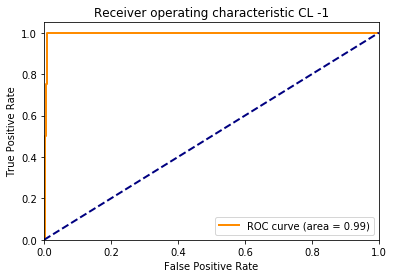

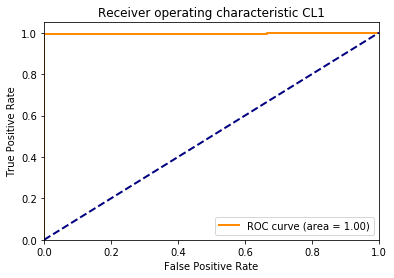

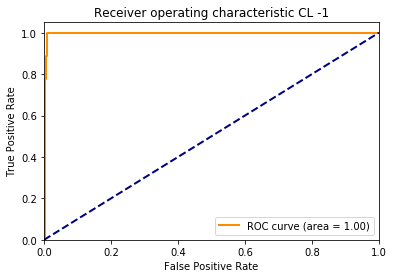

df_tune_data:
     cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0   80.0    0.1    NaN      274.0      0.07   0.99275     0.987     0.00575
1   90.0    0.1    NaN      256.0      0.06   0.99400     0.989     0.00500
2   95.0    0.1    NaN      253.0      0.06   0.99500     0.990     0.00500
3  100.0    0.1    NaN      249.0      0.06   0.99525     0.990     0.00525
4  110.0    0.1    NaN      242.0      0.06   0.99525     0.988     0.00725


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 0.1 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


------calculating scores for test data for various svm models-----


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


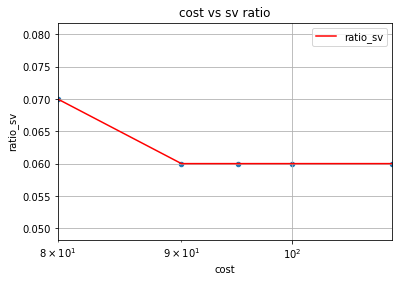

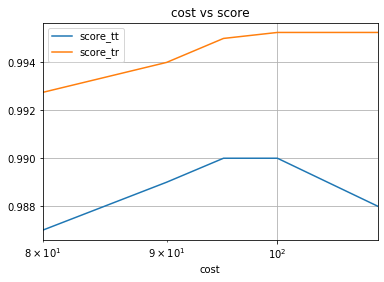

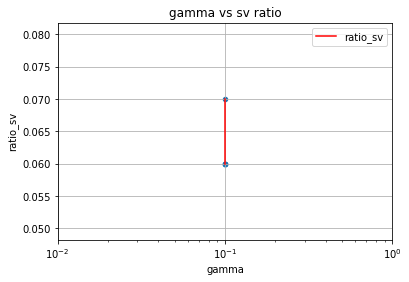

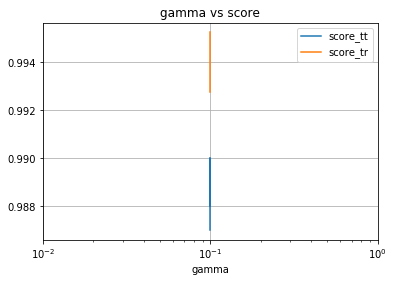

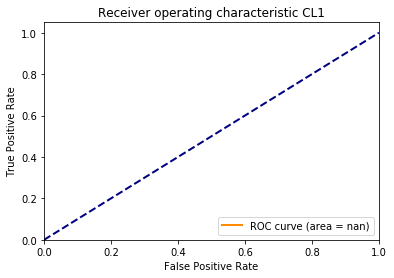

...

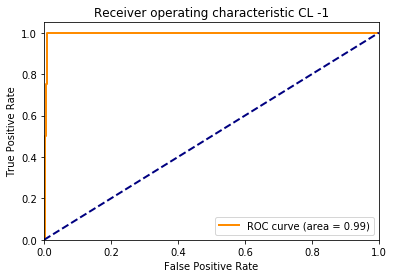

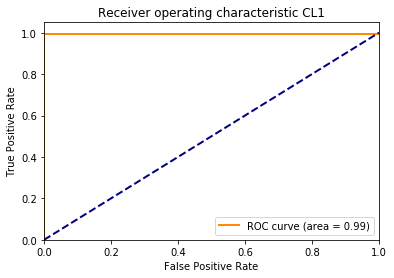

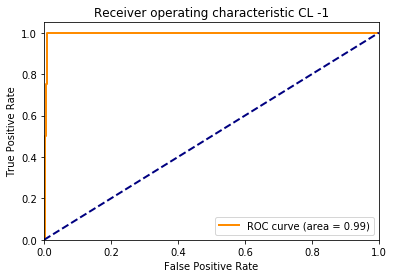

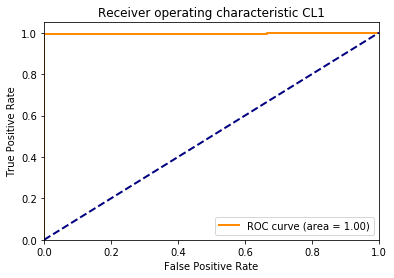

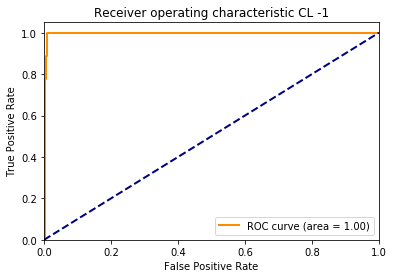

df_tune_data:
     cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0   80.0    0.1    NaN      274.0      0.07   0.99275     0.987     0.00575
1   90.0    0.1    NaN      256.0      0.06   0.99400     0.989     0.00500
2   95.0    0.1    NaN      253.0      0.06   0.99500     0.990     0.00500
3  100.0    0.1    NaN      249.0      0.06   0.99525     0.990     0.00525
4  110.0    0.1    NaN      242.0      0.06   0.99525     0.988     0.00725


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 0.1 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


in heatmap: rbf


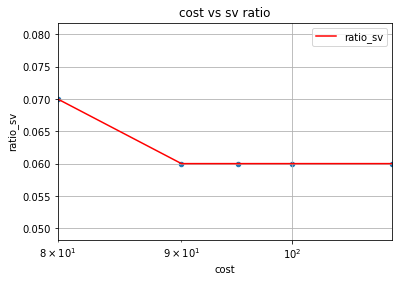

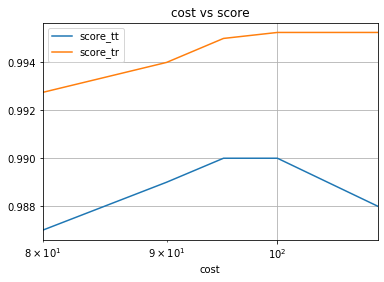

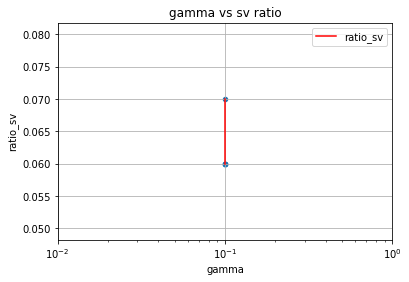

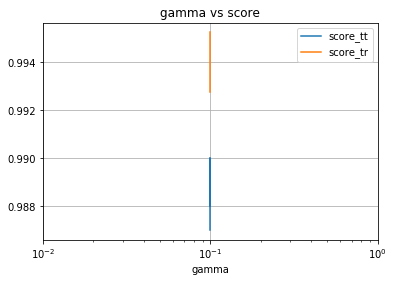

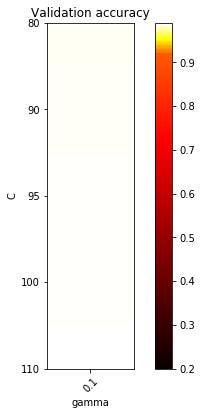

In [0]:
# gamma fixed to 0.1

#fine tuning  for cost in range
C_range = [80,90,95,100,110]
gamma_range = [0.1]
#gamma_range = [0.1,0.05,1,5,8]
tuned_parameters = {'kernel': ['rbf'], 'C': C_range, 'gamma': gamma_range}
nfolds = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=42)
svm_radial.tune(tuned_parameters,nfolds,False)

kernel_type :  rbf
------Fitting train data into svm model-----
# Tuning hyper-parameters


Best parameters set found on development set:

{'C': 110, 'gamma': 0.1, 'kernel': 'rbf'}

Grid scores on development set:

0.989 (+/-0.007) for {'C': 80, 'gamma': 0.1, 'kernel': 'rbf'}
0.986 (+/-0.007) for {'C': 80, 'gamma': 0.05, 'kernel': 'rbf'}
0.976 (+/-0.009) for {'C': 80, 'gamma': 1, 'kernel': 'rbf'}
0.966 (+/-0.011) for {'C': 80, 'gamma': 5, 'kernel': 'rbf'}
0.962 (+/-0.012) for {'C': 80, 'gamma': 8, 'kernel': 'rbf'}
0.989 (+/-0.007) for {'C': 90, 'gamma': 0.1, 'kernel': 'rbf'}
0.987 (+/-0.006) for {'C': 90, 'gamma': 0.05, 'kernel': 'rbf'}
0.976 (+/-0.008) for {'C': 90, 'gamma': 1, 'kernel': 'rbf'}
0.966 (+/-0.011) for {'C': 90, 'gamma': 5, 'kernel': 'rbf'}
0.962 (+/-0.012) for {'C': 90, 'gamma': 8, 'kernel': 'rbf'}
0.990 (+/-0.006) for {'C': 95, 'gamma': 0.1, 'kernel': 'rbf'}
0.987 (+/-0.006) for {'C': 95, 'gamma': 0.05, 'kernel': 'rbf'}
0.976 (+/-0.008) for {'C': 95, 'gamma': 1, 'kernel

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


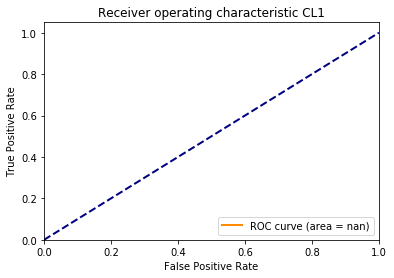

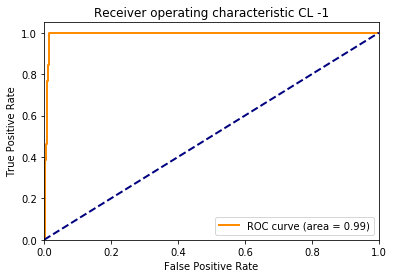

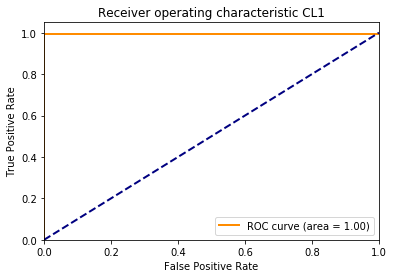

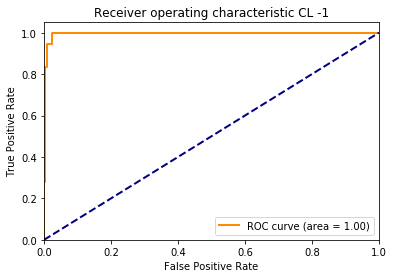

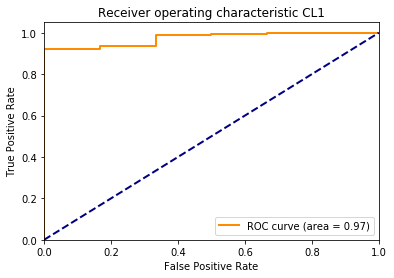

...

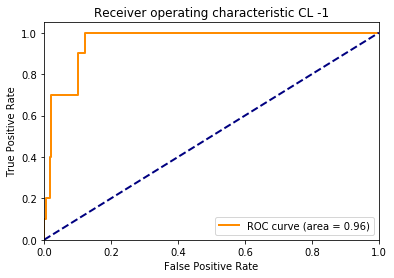

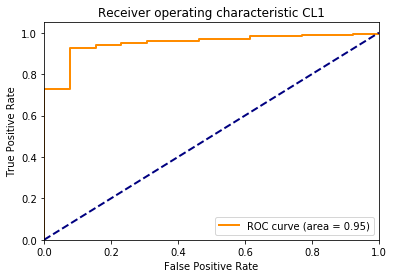

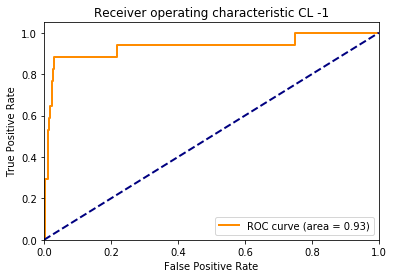

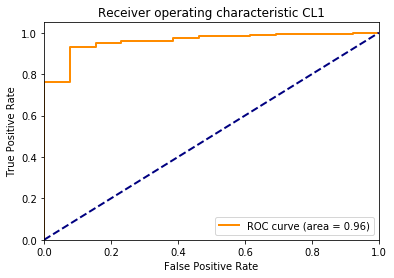

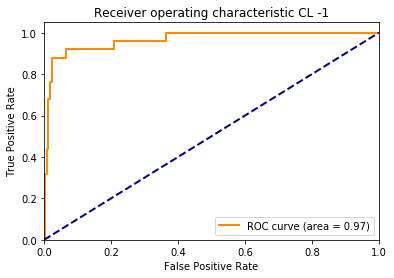

df_tune_data:
      cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0    80.0   0.10    NaN      274.0      0.07   0.99275     0.987     0.00575
1    80.0   0.05    NaN      372.0      0.09   0.99075     0.981     0.00975
2    80.0   1.00    NaN      299.0      0.07   0.99975     0.984     0.01575
3    80.0   5.00    NaN     1819.0      0.45   1.00000     0.970     0.03000
4    80.0   8.00    NaN     2692.0      0.67   1.00000     0.962     0.03800
5    90.0   0.10    NaN      256.0      0.06   0.99400     0.989     0.00500
6    90.0   0.05    NaN      358.0      0.09   0.99100     0.981     0.01000
7    90.0   1.00    NaN      288.0      0.07   0.99975     0.984     0.01575
8    90.0   5.00    NaN     1819.0      0.45   1.00000     0.970     0.03000
9    90.0   8.00    NaN     2692.0      0.67   1.00000     0.962     0.03800
10   95.0   0.10    NaN      253.0      0.06   0.99500     0.990     0.00500
11   95.0   0.05    NaN      352.0      0.09   0.99125     0.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


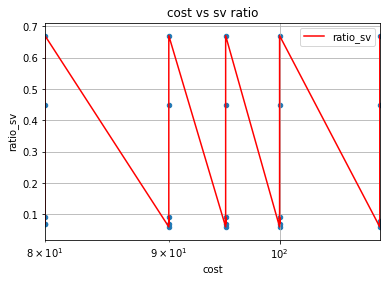

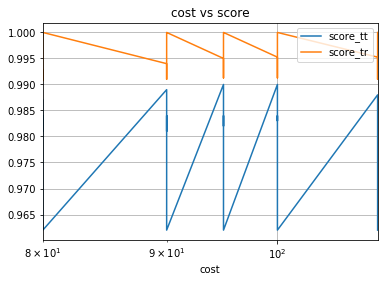

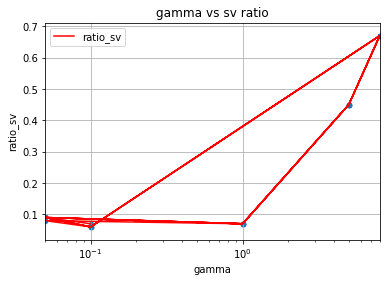

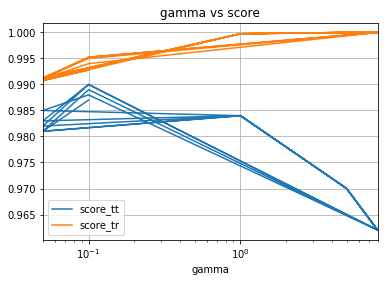

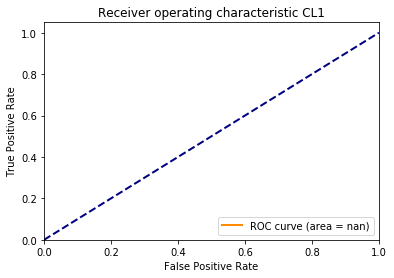

...

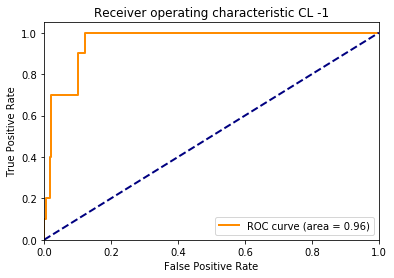

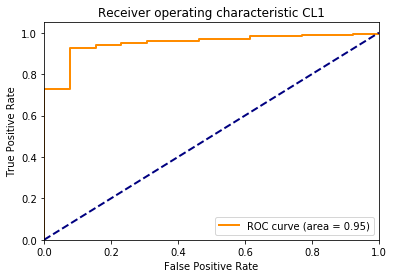

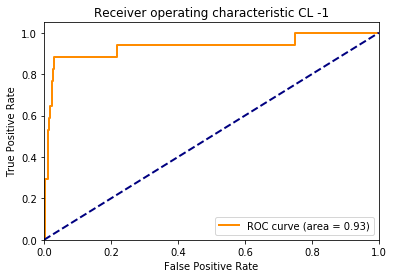

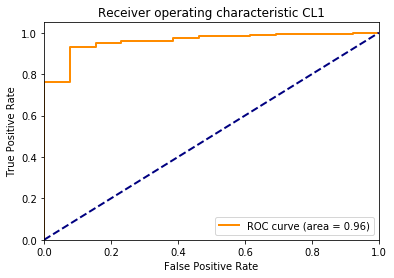

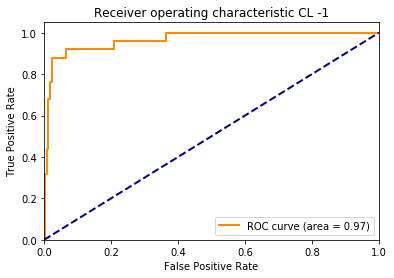

df_tune_data:
      cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0    80.0   0.10    NaN      274.0      0.07   0.99275     0.987     0.00575
1    80.0   0.05    NaN      372.0      0.09   0.99075     0.981     0.00975
2    80.0   1.00    NaN      299.0      0.07   0.99975     0.984     0.01575
3    80.0   5.00    NaN     1819.0      0.45   1.00000     0.970     0.03000
4    80.0   8.00    NaN     2692.0      0.67   1.00000     0.962     0.03800
5    90.0   0.10    NaN      256.0      0.06   0.99400     0.989     0.00500
6    90.0   0.05    NaN      358.0      0.09   0.99100     0.981     0.01000
7    90.0   1.00    NaN      288.0      0.07   0.99975     0.984     0.01575
8    90.0   5.00    NaN     1819.0      0.45   1.00000     0.970     0.03000
9    90.0   8.00    NaN     2692.0      0.67   1.00000     0.962     0.03800
10   95.0   0.10    NaN      253.0      0.06   0.99500     0.990     0.00500
11   95.0   0.05    NaN      352.0      0.09   0.99125     0.

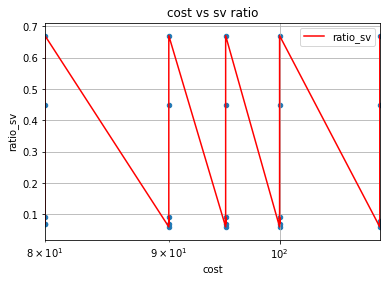

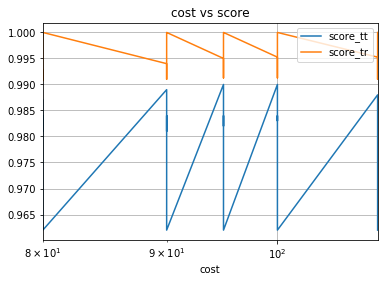

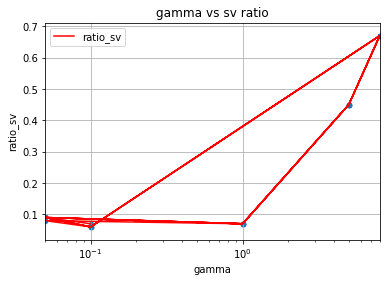

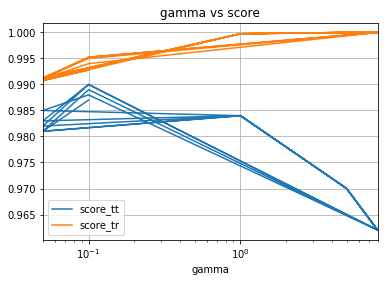

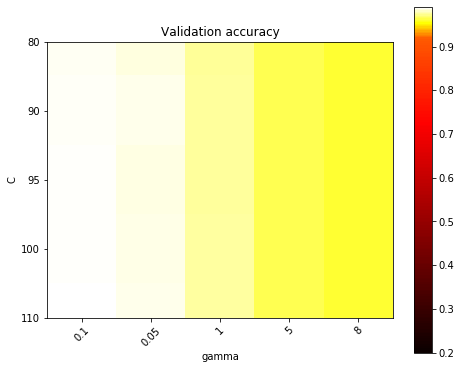

In [0]:
#fine tuning  for cost in range
C_range = [80,90,95,100,110]
#gamma_range = [0.1]
gamma_range = [0.1,0.05,1,5,8]
tuned_parameters = {'kernel': ['rbf'], 'C': C_range, 'gamma': gamma_range}
nfolds = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=42)
svm_radial.tune(tuned_parameters,nfolds,False)

Evaluate the performance characteristics of the "best" radial svm as in question 2

In [0]:
svm_radial.best_params = {'C': 110, 'gamma': 0.1, 'kernel': 'rbf'}


{'C': 110, 'gamma': 0.1, 'kernel': 'rbf'}
kernel_type:  rbf
------Fitting train data into svm model-----
Score for above parameters in SVC model :  0.99525


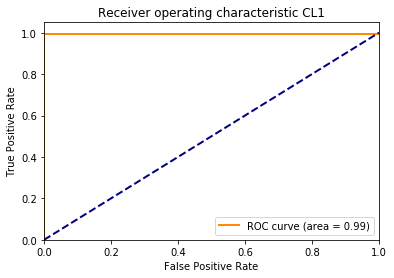

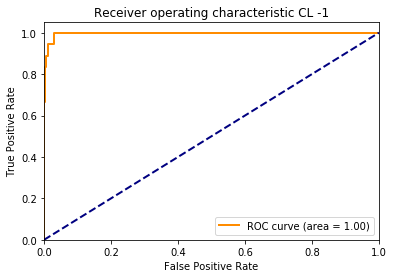

Number of Support vectors,S :  242
Ratio of Support vectors,s :  0.06
------SVM applied on test set-----
Score for above parameters in SVC model for testset :  0.988


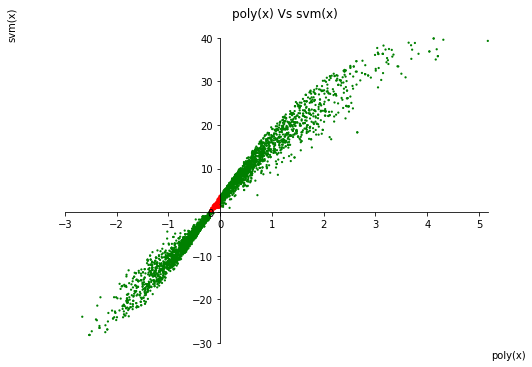

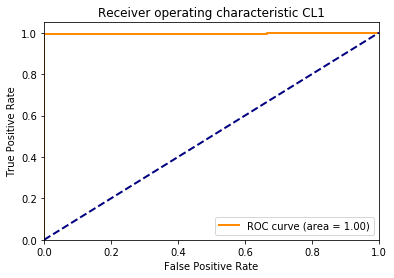

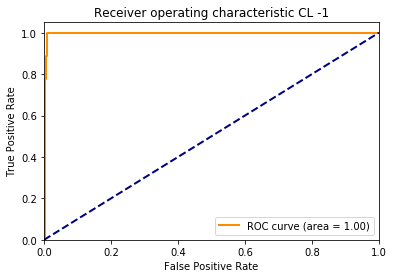

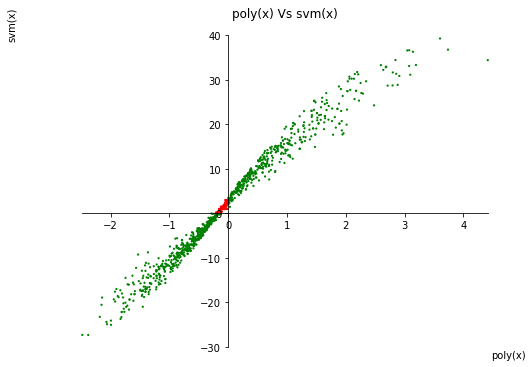

In [0]:
parameters = svm_radial.best_params
print(parameters)
# svm_radial.best_params_ = grid.best_params_
svm_radial.svm_call("rbf",parameters,False)


In [0]:

svm_radial.calc_correct_pred()
print('Predictions Train:\n',svm_radial.pred_train)
print('Predictions Test:\n',svm_radial.pred_test)

svm_radial.calc_confusionmatrix()
print('Confusion matrix for Train:\n',svm_radial.confmat_train)
print('Confusion matrix for Test:\n',svm_radial.confmat_test)

svm_radial.error_estimate()
print('prediction errors train:\n',svm_radial.pred_train)
print('prediction errors test:\n',svm_radial.pred_test)

print('confmat_train_error:\n',svm_radial.confmat_train_error)
print('confmat_train_confint:\n',svm_radial.confmat_train_confint)
print('confmat_test_error:\n',svm_radial.confmat_test_error)
print('confmat_test_confint:\n',svm_radial.confmat_test_confint)

Predictions Train:
          pred  error        conf_int
total  99.525   0.11  [99.31, 99.74]
cl1    99.100   0.21  [98.69, 99.51]
cl_1   99.950   0.05    [99.85, 100]
Predictions Test:
        pred  error        conf_int
total  98.8   0.34  [98.13, 99.47]
cl1    98.2   0.59  [97.04, 99.36]
cl_1   99.4   0.35    [98.71, 100]
Confusion matrix for Train:
            pred_CL1  pred_CL_1
true_CL1      99.10       0.90
true_CL_1      0.05      99.95
Confusion matrix for Test:
            pred_CL1  pred_CL_1
true_CL1       98.2        1.8
true_CL_1       0.6       99.4
prediction errors train:
          pred  error        conf_int
total  99.525   0.11  [99.31, 99.74]
cl1    99.100   0.21  [98.69, 99.51]
cl_1   99.950   0.05    [99.85, 100]
prediction errors test:
        pred  error        conf_int
total  98.8   0.34  [98.13, 99.47]
cl1    98.2   0.59  [97.04, 99.36]
cl_1   99.4   0.35    [98.71, 100]
confmat_train_error:
            pred_CL1  pred_CL_1
true_CL1       0.21       0.21
true_CL

Interpret your results

# Question 6 : SVM classification using a polynomial kernel
Implement the steps of question 4 and 
K(x,y) = (a + <x,y>)^4
You will have to optimize the choice of the two parameters "a" >0 and ''cost"

In [0]:
svm_poly = SvmClassification(simulated_data.train_data,simulated_data.test_data)

In [0]:
svm_radial.best_params['C']

110

kernel_type:  poly
------Fitting train data into svm model-----
Score for above parameters in SVC model :  1.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


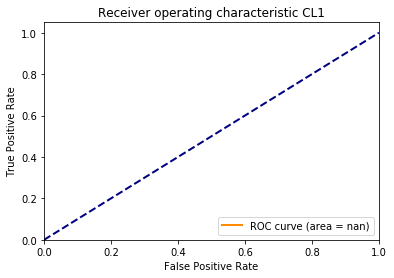

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


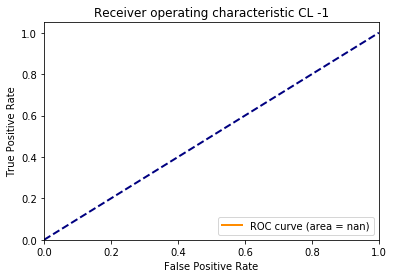

Number of Support vectors,S :  68
Ratio of Support vectors,s :  0.02
------SVM applied on test set-----
Score for above parameters in SVC model for testset :  0.994


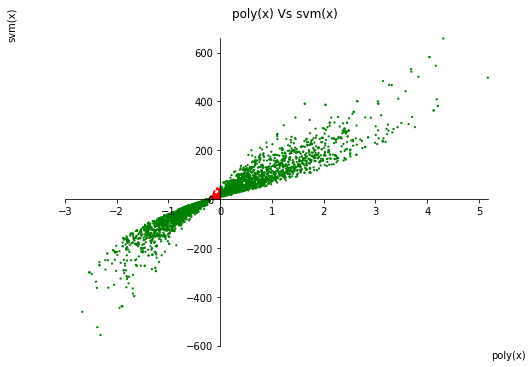

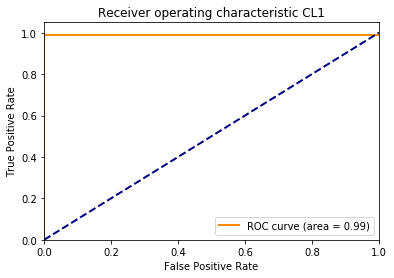

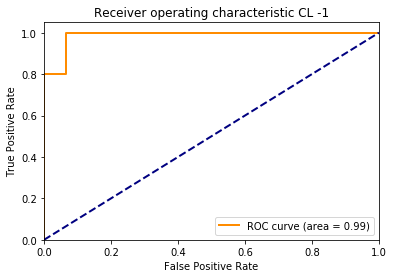

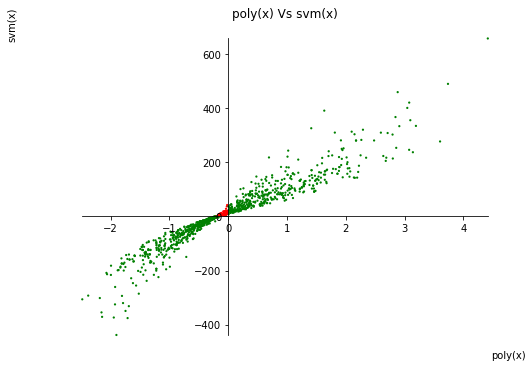

In [0]:
parameters = {'kernel': ['poly'], 'C': svm_radial.best_params['C'],
              'degree' : 4,'coef0' : 1,'gamma':1}
svm_poly.svm_call('poly',parameters,False)
 

In [0]:


svm_poly.calc_correct_pred()
print('Predictions Train:\n',svm_poly.pred_train)
print('Predictions Test:\n',svm_poly.pred_test)

svm_poly.calc_confusionmatrix()
print('Confusion matrix for Train:\n',svm_poly.confmat_train)
print('Confusion matrix for Test:\n',svm_poly.confmat_test)


svm_poly.error_estimate()
print('prediction errors train:\n',svm_poly.pred_train)
print('prediction errors test:\n',svm_poly.pred_test)

print('confmat_train_error:\n',svm_poly.confmat_train_error)
print('confmat_train_confint:\n',svm_poly.confmat_train_confint)
print('confmat_test_error:\n',svm_poly.confmat_test_error)
print('confmat_test_confint:\n',svm_poly.confmat_test_confint)


Predictions Train:
         pred  error  conf_int
total  100.0      0         0
cl1    100.0      0         0
cl_1   100.0      0         0
Predictions Test:
        pred  error  conf_int
total  99.4      0         0
cl1    99.0      0         0
cl_1   99.8      0         0
Confusion matrix for Train:
            pred_CL1  pred_CL_1
true_CL1      100.0        0.0
true_CL_1       0.0      100.0
Confusion matrix for Test:
            pred_CL1  pred_CL_1
true_CL1       99.0        1.0
true_CL_1       0.2       99.8
prediction errors train:
         pred  error        conf_int
total  100.0    0.0  [100.0, 100.0]
cl1    100.0    0.0  [100.0, 100.0]
cl_1   100.0    0.0  [100.0, 100.0]
prediction errors test:
        pred  error        conf_int
total  99.4   0.24  [98.93, 99.87]
cl1    99.0   0.44  [98.14, 99.86]
cl_1   99.8   0.20    [99.41, 100]
confmat_train_error:
            pred_CL1  pred_CL_1
true_CL1        0.0        0.0
true_CL_1       0.0        0.0
confmat_train_confint:
         

# Q6a: optimize the parameters 'cost' and 'a' based on the polynomial kernel

In [0]:
#broad tuning for coef0(a) between 0.01 to 100
C_range = [svm_radial.best_params['C']]
gamma_range = [1]

kernel_type :  poly
------Fitting train data into svm model-----
# Tuning hyper-parameters


Best parameters set found on development set:

{'C': 110, 'coef0': 10.0, 'gamma': 1, 'kernel': 'poly'}

Grid scores on development set:

0.974 (+/-0.012) for {'C': 110, 'coef0': 0.01, 'gamma': 1, 'kernel': 'poly'}
0.993 (+/-0.006) for {'C': 110, 'coef0': 0.1, 'gamma': 1, 'kernel': 'poly'}
0.995 (+/-0.005) for {'C': 110, 'coef0': 1.0, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.005) for {'C': 110, 'coef0': 10.0, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 110, 'coef0': 100.0, 'gamma': 1, 'kernel': 'poly'}
------Fitting train data into svm model-----
kernel_type:  poly


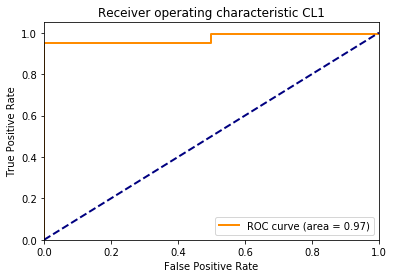

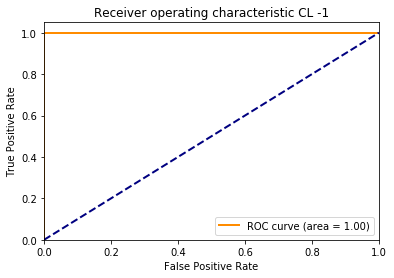

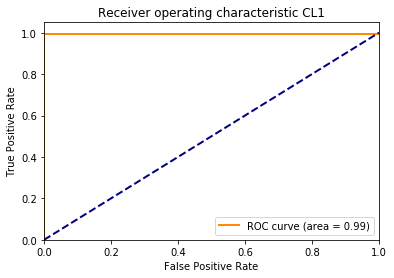

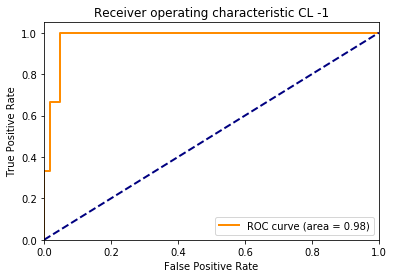

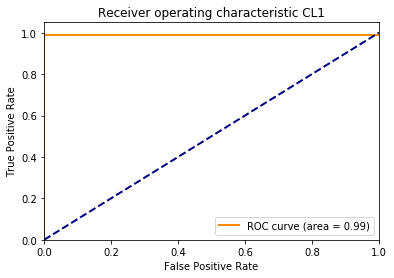

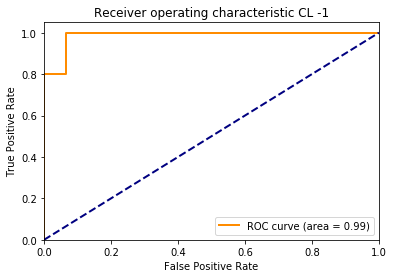

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


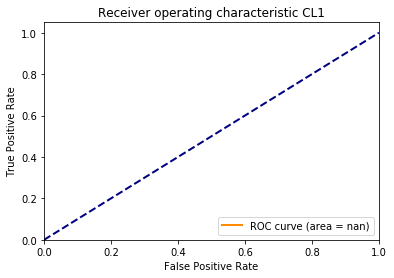

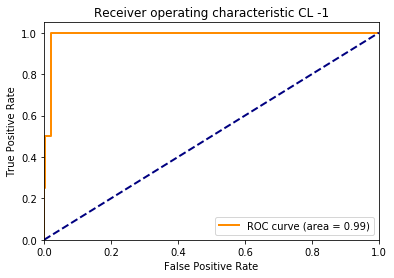

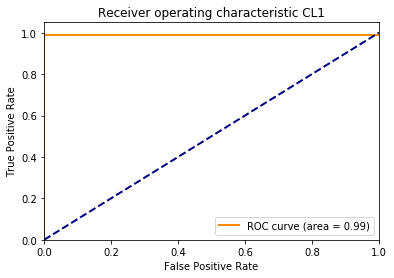

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


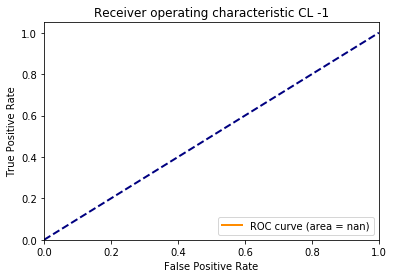

df_tune_data:
     cost  gamma   coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0  110.0    1.0    0.01       97.0      0.02    0.9975     0.992      0.0055
1  110.0    1.0    0.10       84.0      0.02    0.9990     0.995      0.0040
2  110.0    1.0    1.00       68.0      0.02    1.0000     0.994      0.0060
3  110.0    1.0   10.00       49.0      0.01    1.0000     0.996      0.0040
4  110.0    1.0  100.00       38.0      0.01    1.0000     0.999      0.0010


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 110.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


------calculating scores for test data for various svm models-----
kernel_type:  poly


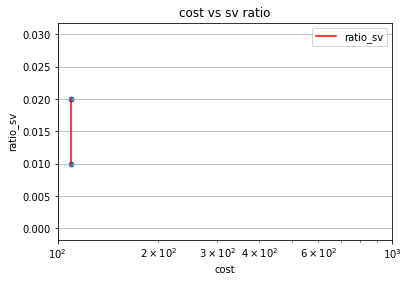

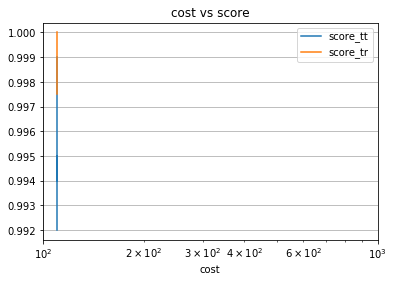

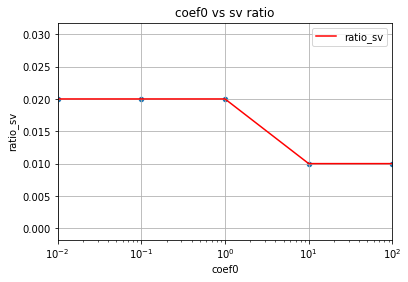

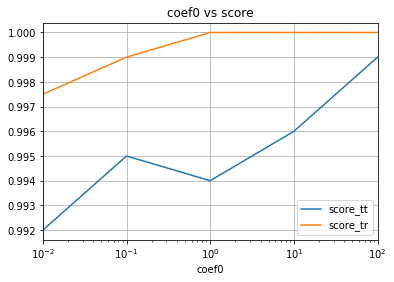

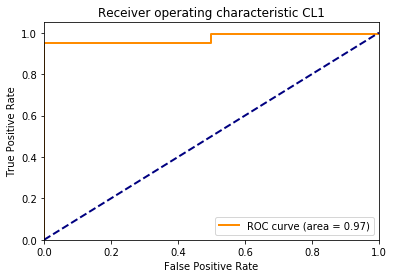

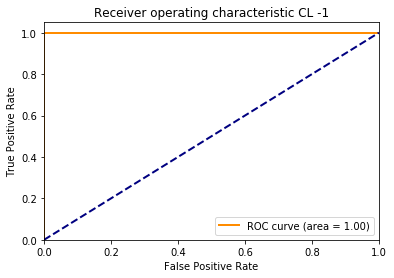

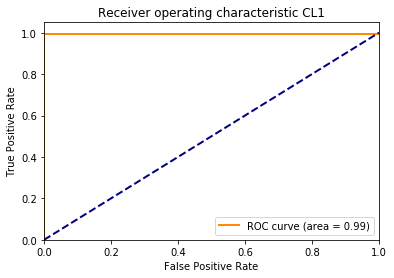

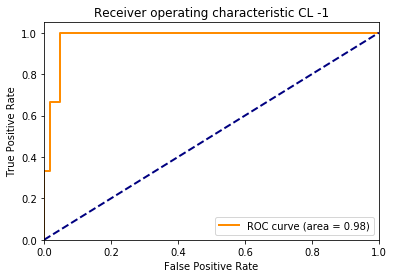

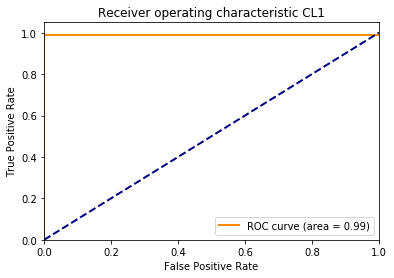

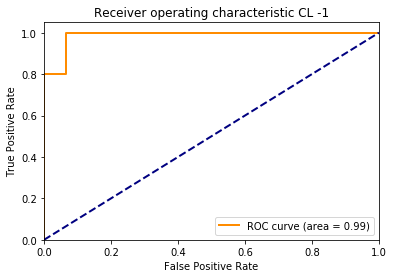

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


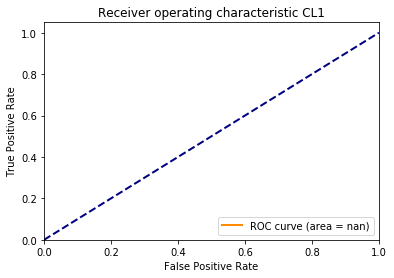

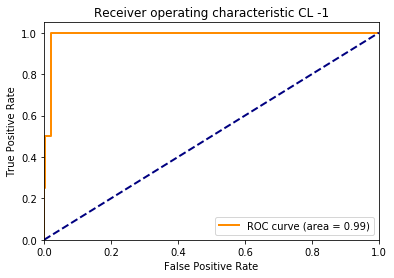

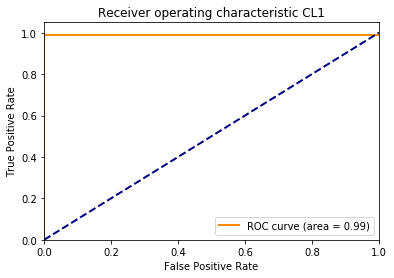

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


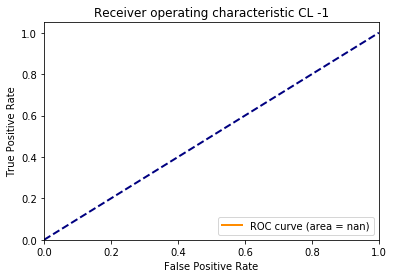

df_tune_data:
     cost  gamma   coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0  110.0    1.0    0.01       97.0      0.02    0.9975     0.992      0.0055
1  110.0    1.0    0.10       84.0      0.02    0.9990     0.995      0.0040
2  110.0    1.0    1.00       68.0      0.02    1.0000     0.994      0.0060
3  110.0    1.0   10.00       49.0      0.01    1.0000     0.996      0.0040
4  110.0    1.0  100.00       38.0      0.01    1.0000     0.999      0.0010


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 110.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


in heatmap: poly


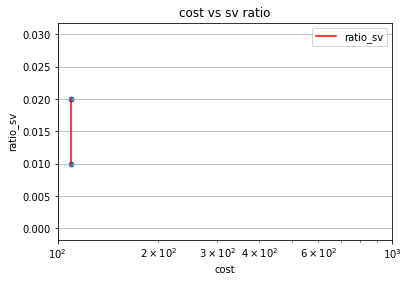

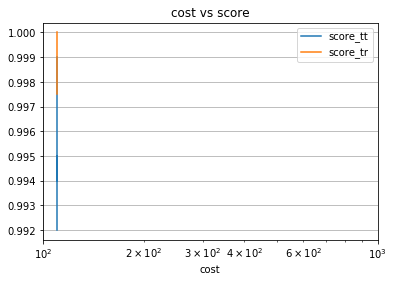

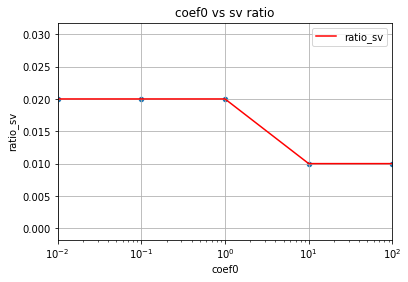

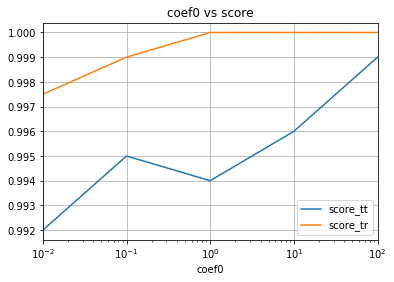

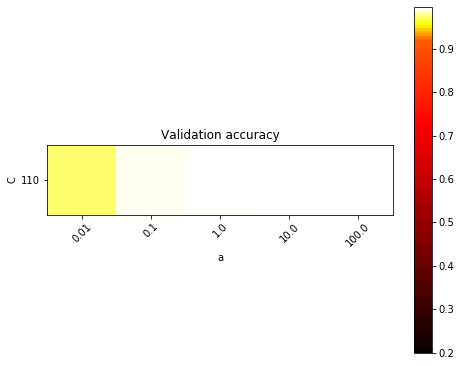

In [0]:
#broad tuning for coef0(a) between 0.01 to 100
#C_range = [svm_radial.best_params['C']]
C_range = [110]
gamma_range = [1]
coef0_range = np.logspace(-2, 2,5)
tuned_parameters = {'kernel': ['poly'], 'C': C_range, 'coef0' : coef0_range,'gamma': [1]}
nfolds = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=42)
#tuning for Train set
svm_poly.tune(tuned_parameters,nfolds,False)


kernel_type :  poly
------Fitting train data into svm model-----
# Tuning hyper-parameters


Best parameters set found on development set:

{'C': 100.0, 'coef0': 10, 'gamma': 1, 'kernel': 'poly'}

Grid scores on development set:

0.986 (+/-0.005) for {'C': 0.01, 'coef0': 10, 'gamma': 1, 'kernel': 'poly'}
0.994 (+/-0.005) for {'C': 0.1, 'coef0': 10, 'gamma': 1, 'kernel': 'poly'}
0.995 (+/-0.006) for {'C': 1.0, 'coef0': 10, 'gamma': 1, 'kernel': 'poly'}
0.995 (+/-0.005) for {'C': 10.0, 'coef0': 10, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.005) for {'C': 100.0, 'coef0': 10, 'gamma': 1, 'kernel': 'poly'}
------Fitting train data into svm model-----
kernel_type:  poly


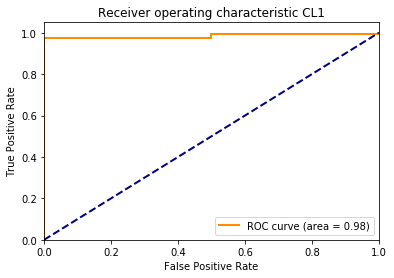

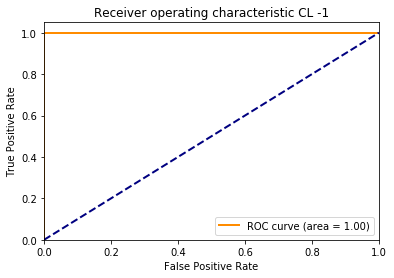

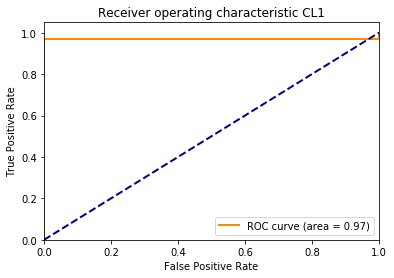

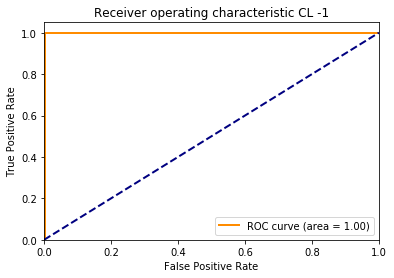

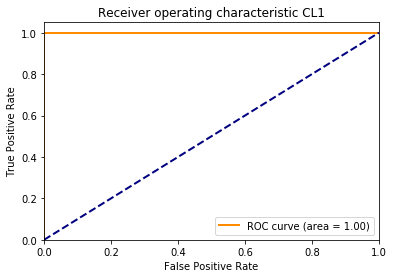

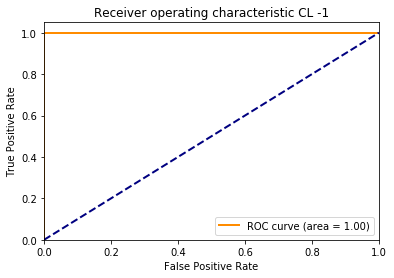

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


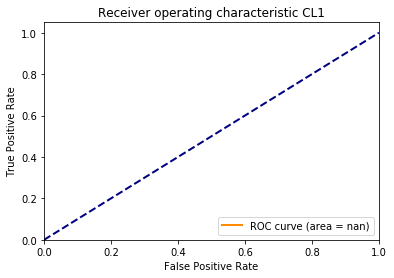

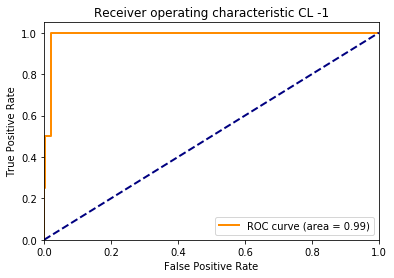

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


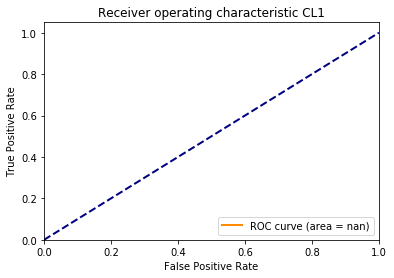

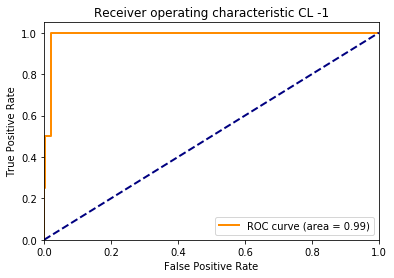

df_tune_data:
      cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0    0.01    1.0   10.0      151.0      0.04   0.99725     0.996     0.00125
1    0.10    1.0   10.0       82.0      0.02   0.99875     0.996     0.00275
2    1.00    1.0   10.0       63.0      0.02   1.00000     0.994     0.00600
3   10.00    1.0   10.0       49.0      0.01   1.00000     0.996     0.00400
4  100.00    1.0   10.0       49.0      0.01   1.00000     0.996     0.00400


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 10.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


------calculating scores for test data for various svm models-----
kernel_type:  poly


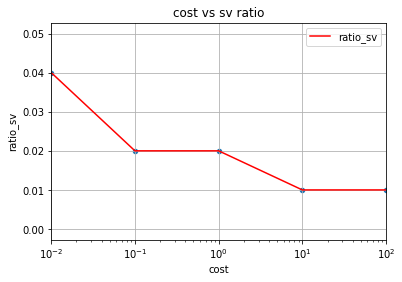

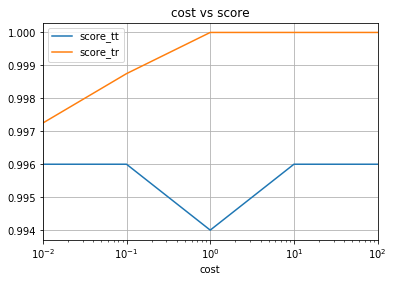

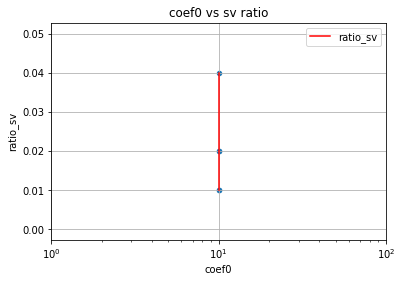

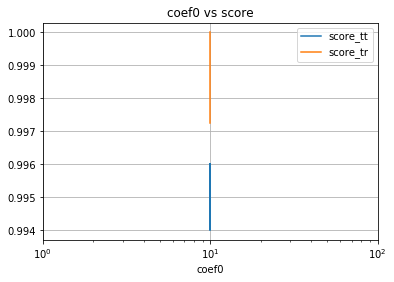

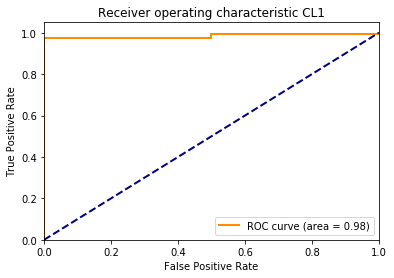

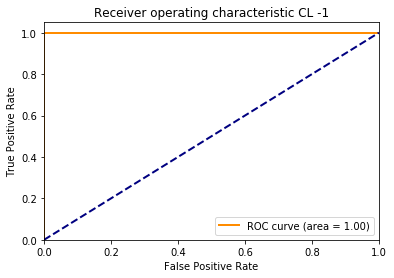

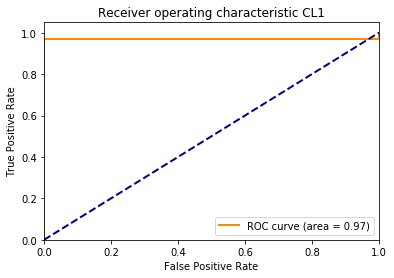

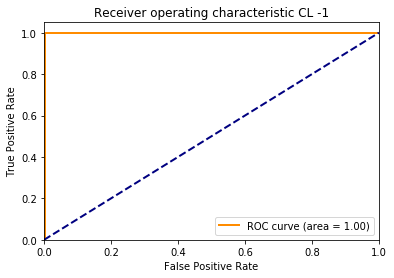

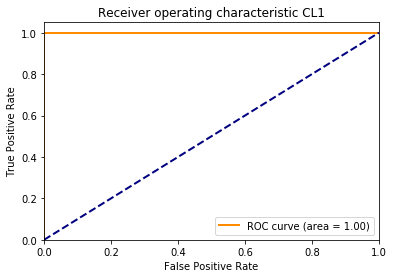

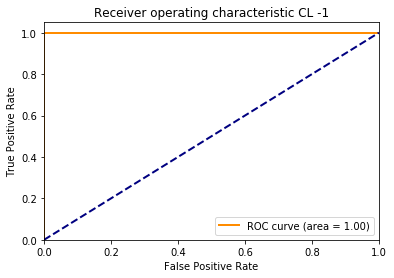

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


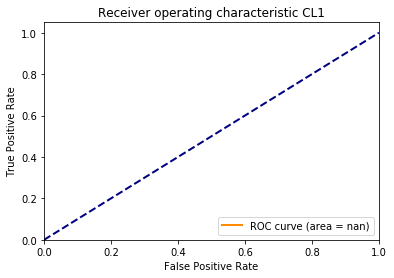

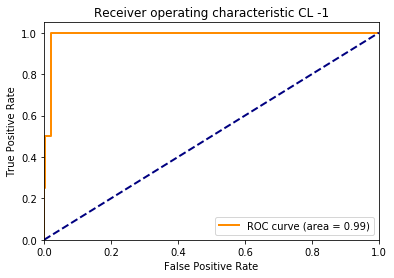

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


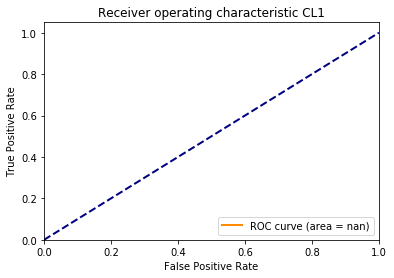

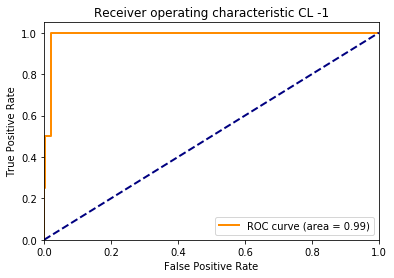

df_tune_data:
      cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0    0.01    1.0   10.0      151.0      0.04   0.99725     0.996     0.00125
1    0.10    1.0   10.0       82.0      0.02   0.99875     0.996     0.00275
2    1.00    1.0   10.0       63.0      0.02   1.00000     0.994     0.00600
3   10.00    1.0   10.0       49.0      0.01   1.00000     0.996     0.00400
4  100.00    1.0   10.0       49.0      0.01   1.00000     0.996     0.00400


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 10.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


in heatmap: poly


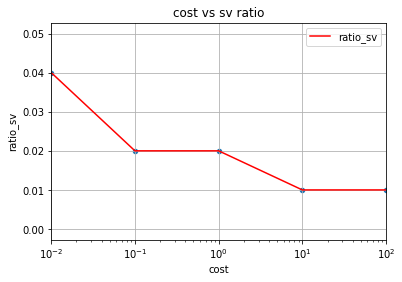

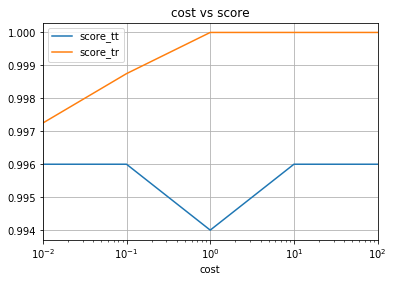

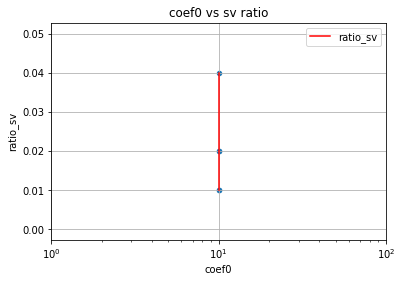

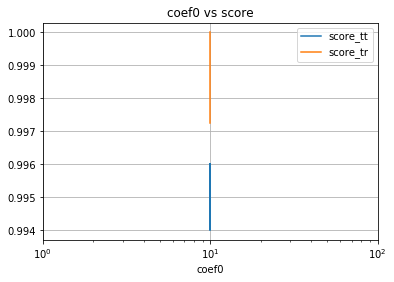

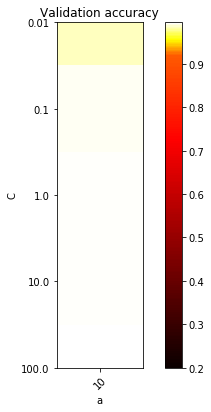

In [0]:
#broad tuning for C between 0.01 to 100
C_range = np.logspace(-2, 2,5)
gamma_range = [1]
#best value from broad tuning
coef0_range = [10]
tuned_parameters = {'kernel': ['poly'], 'C': C_range, 'coef0' : coef0_range,'gamma': gamma_range}
nfolds = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=42)
#tuning for Train set
svm_poly.tune(tuned_parameters,nfolds,False)


kernel_type :  poly
------Fitting train data into svm model-----
# Tuning hyper-parameters


Best parameters set found on development set:

{'C': 10, 'coef0': 30, 'gamma': 1, 'kernel': 'poly'}

Grid scores on development set:

0.995 (+/-0.005) for {'C': 10, 'coef0': 10, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 10, 'coef0': 30, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 10, 'coef0': 70, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 10, 'coef0': 90, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 10, 'coef0': 100, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 30, 'coef0': 10, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.005) for {'C': 30, 'coef0': 30, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 30, 'coef0': 70, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 30, 'coef0': 90, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 30, 'coef0': 100, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.005) for {'C': 50, 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


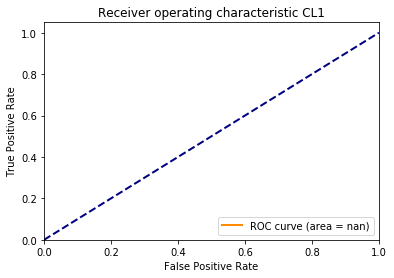

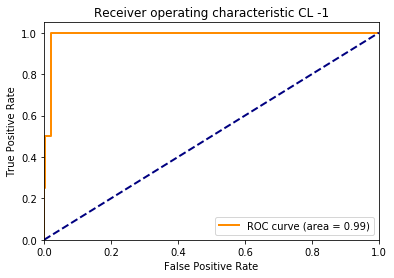

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


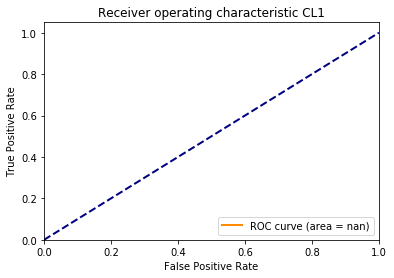

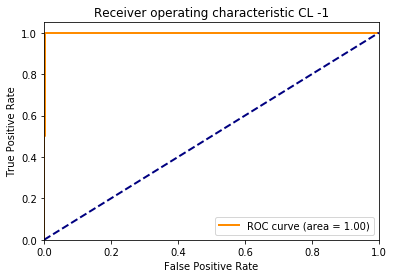

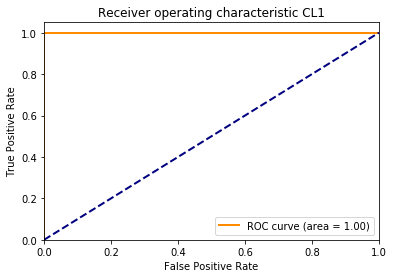

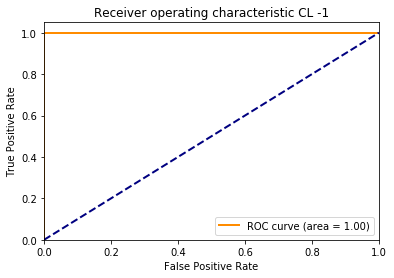

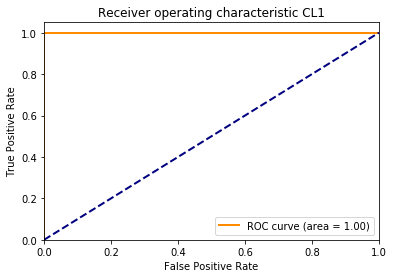

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


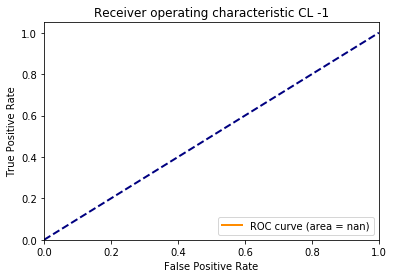

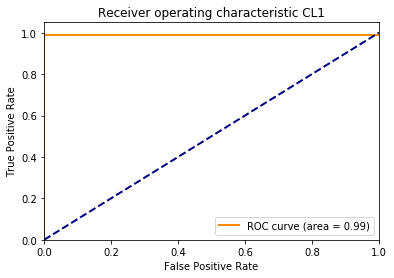

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


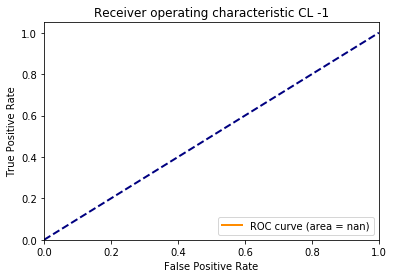

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


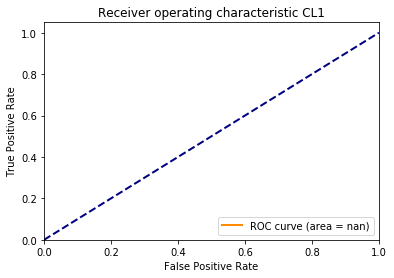

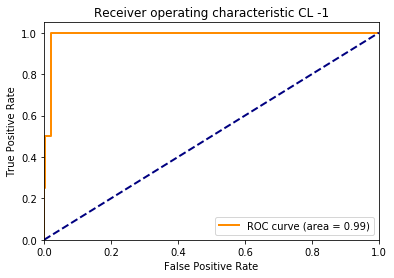

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


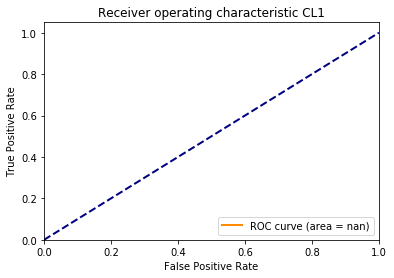

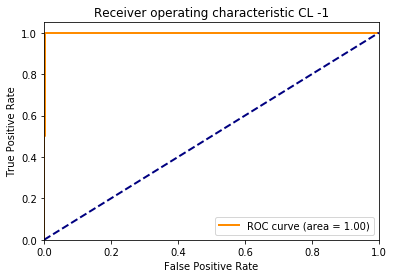

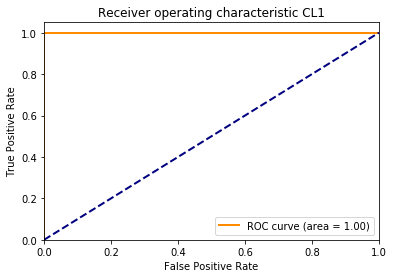

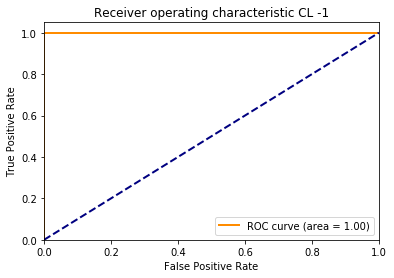

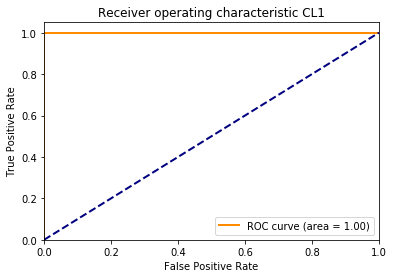

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


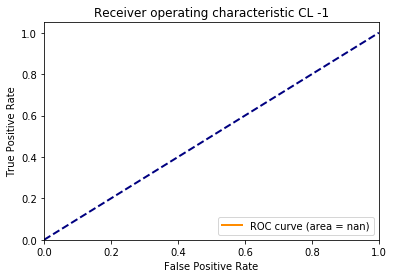

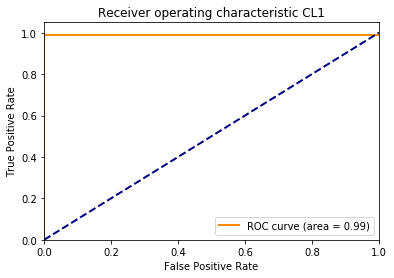

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


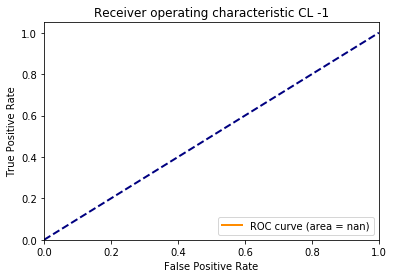

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


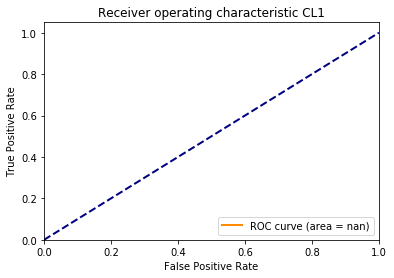

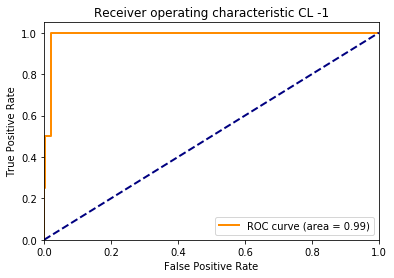

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


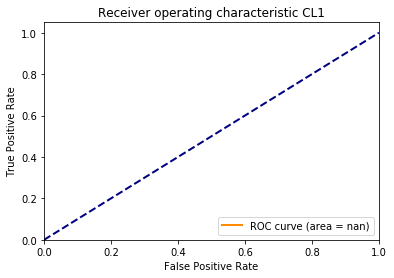

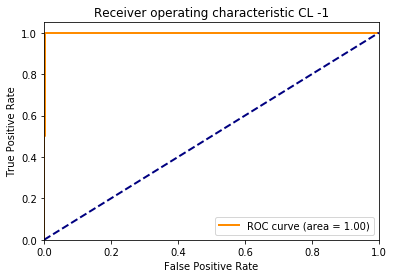

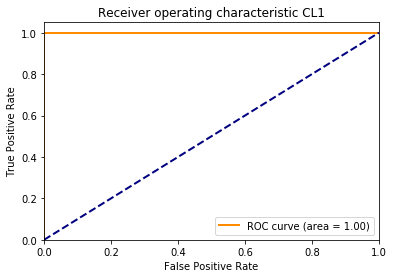

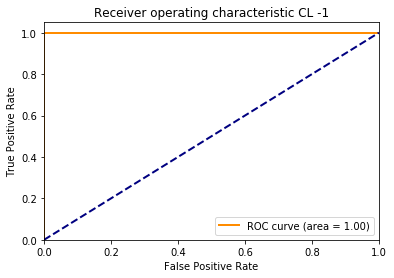

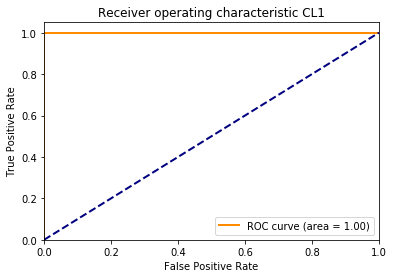

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


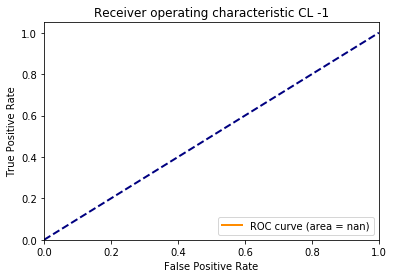

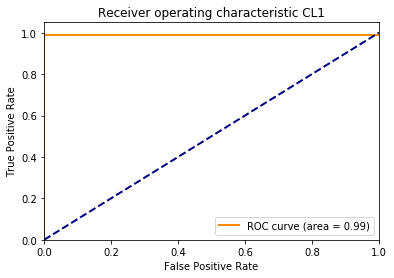

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


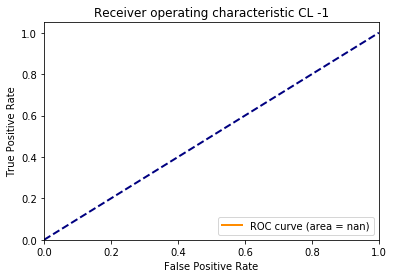

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


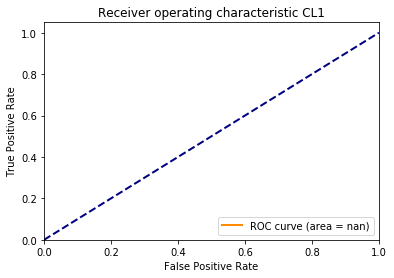

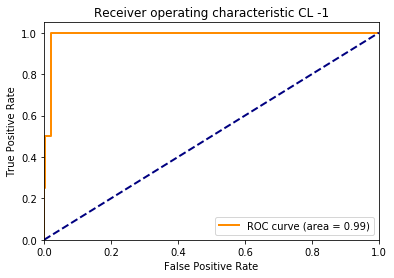

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


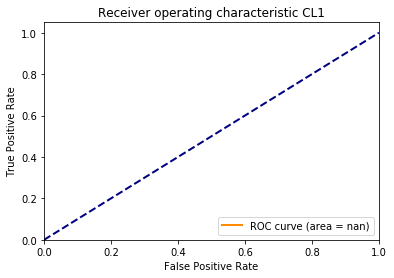

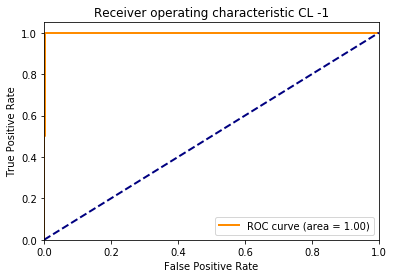

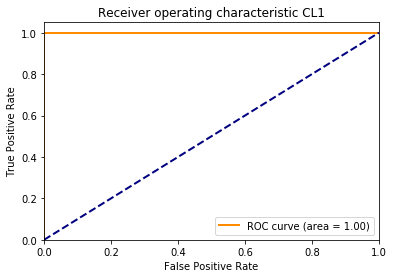

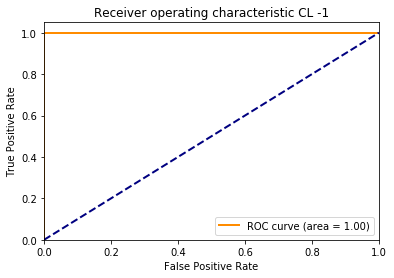

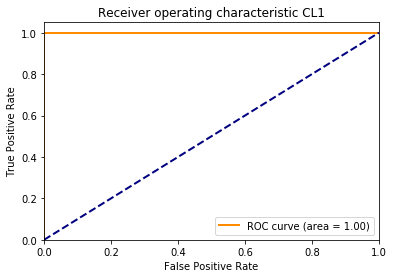

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


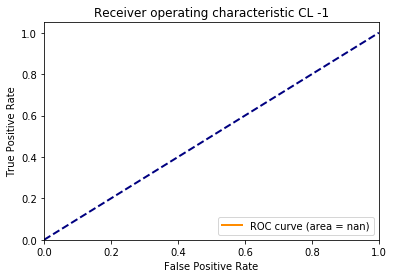

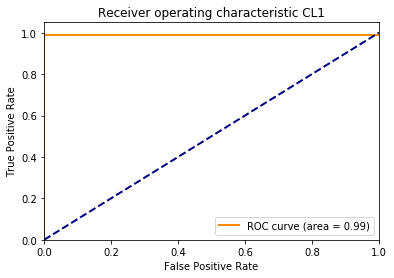

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


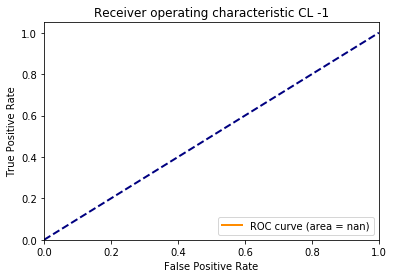

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


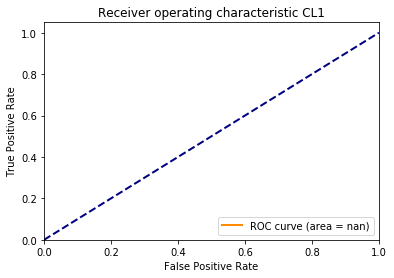

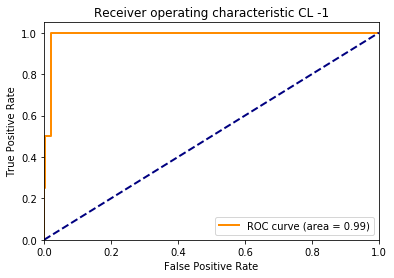

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


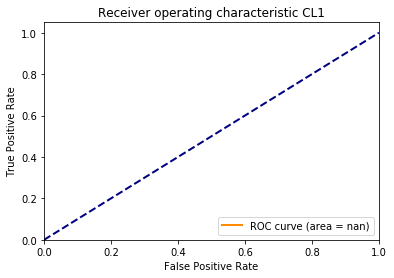

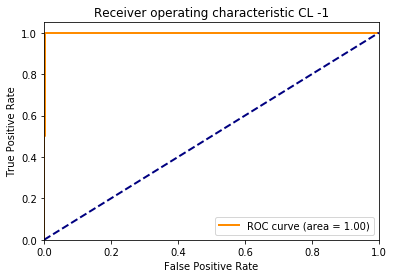

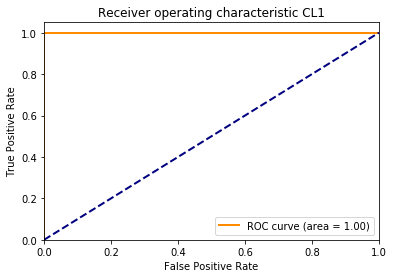

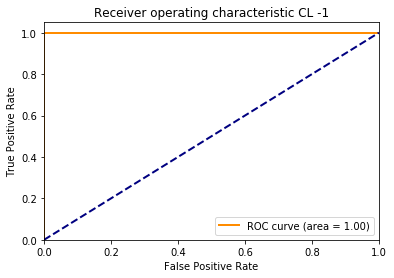

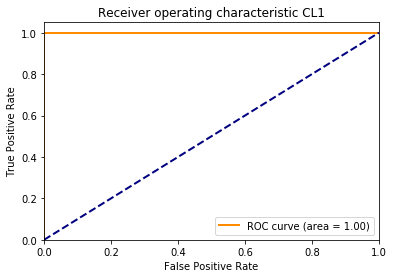

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


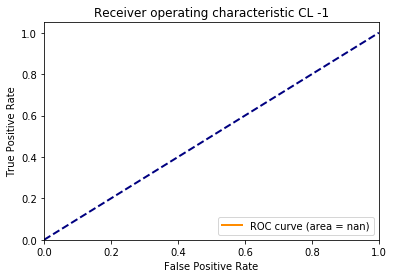

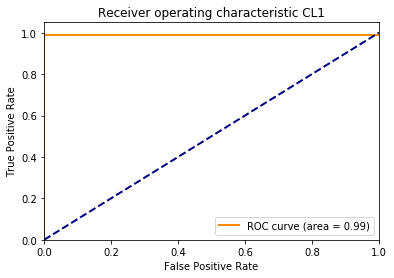

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


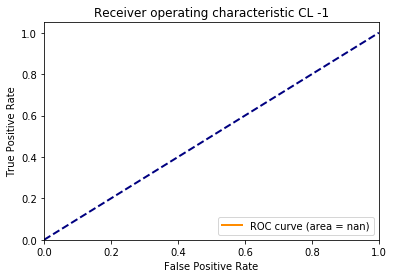

df_tune_data:
      cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0    10.0    1.0   10.0       49.0      0.01       1.0     0.996       0.004
1    10.0    1.0   30.0       41.0      0.01       1.0     0.996       0.004
2    10.0    1.0   70.0       43.0      0.01       1.0     0.997       0.003
3    10.0    1.0   90.0       37.0      0.01       1.0     0.999       0.001
4    10.0    1.0  100.0       38.0      0.01       1.0     0.999       0.001
5    30.0    1.0   10.0       49.0      0.01       1.0     0.996       0.004
6    30.0    1.0   30.0       41.0      0.01       1.0     0.996       0.004
7    30.0    1.0   70.0       43.0      0.01       1.0     0.997       0.003
8    30.0    1.0   90.0       37.0      0.01       1.0     0.999       0.001
9    30.0    1.0  100.0       38.0      0.01       1.0     0.999       0.001
10   50.0    1.0   10.0       49.0      0.01       1.0     0.996       0.004
11   50.0    1.0   30.0       41.0      0.01       1.0     0.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


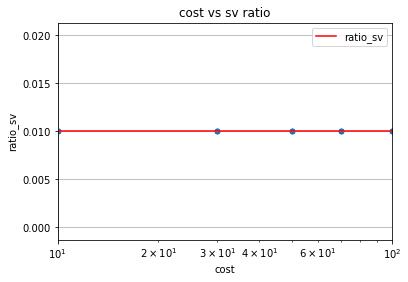

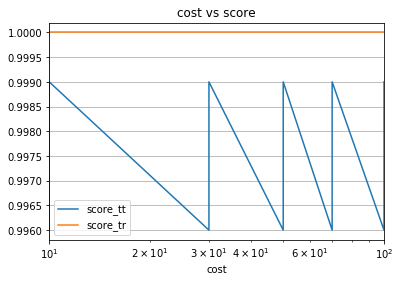

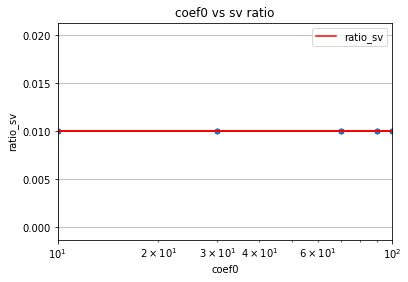

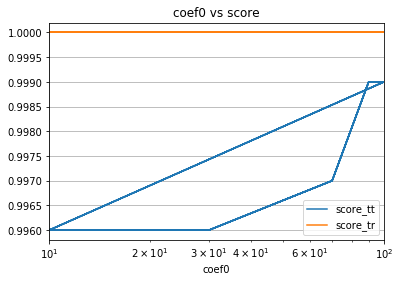

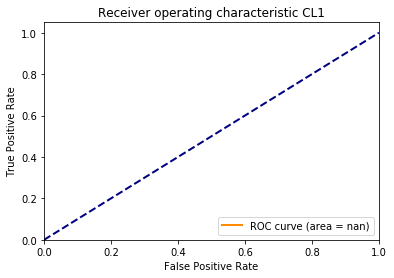

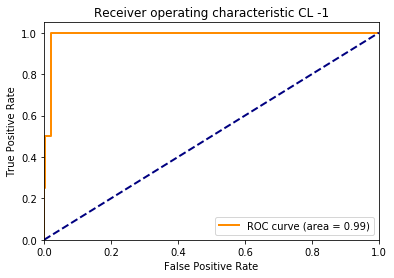

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


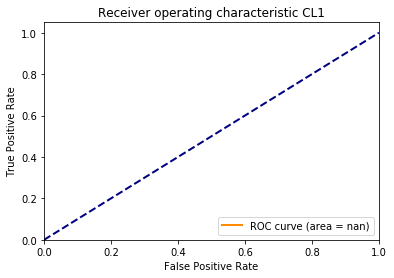

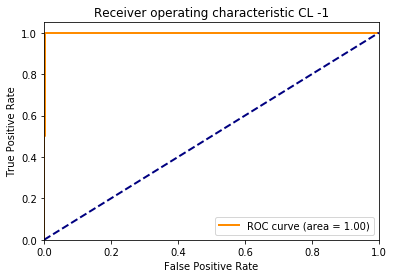

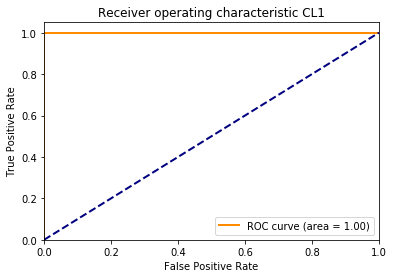

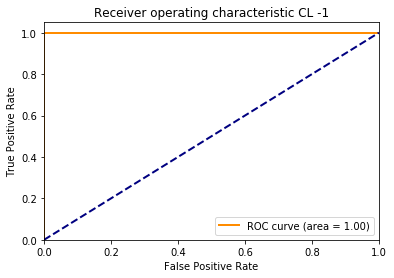

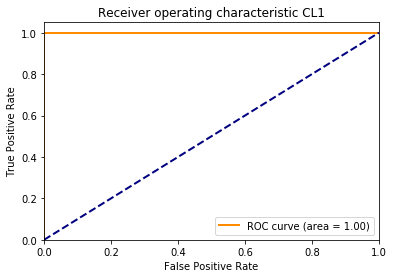

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


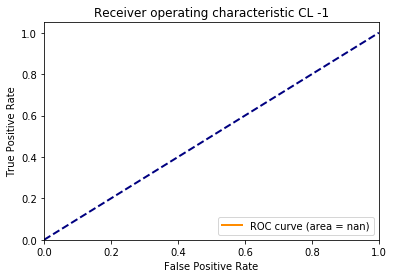

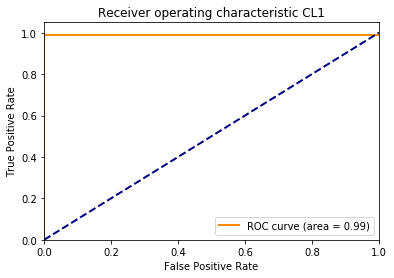

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


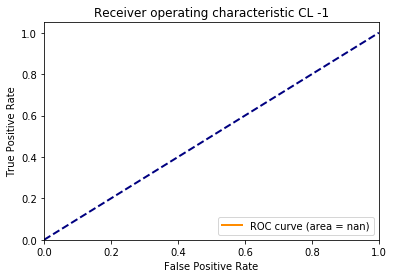

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


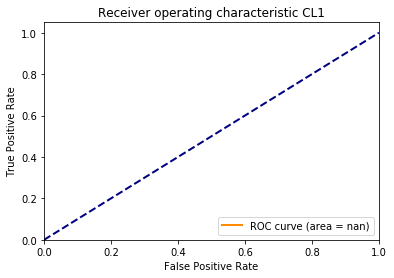

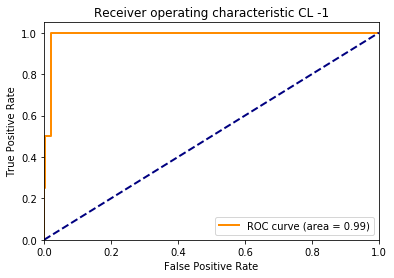

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


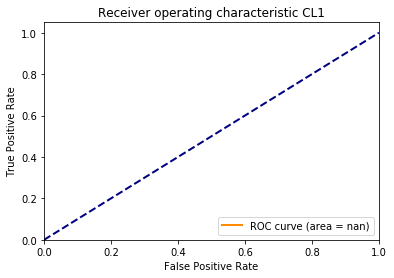

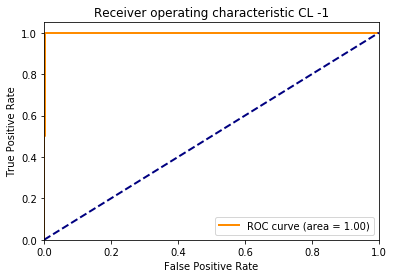

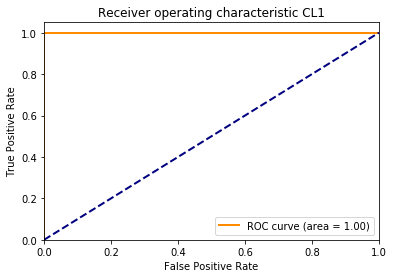

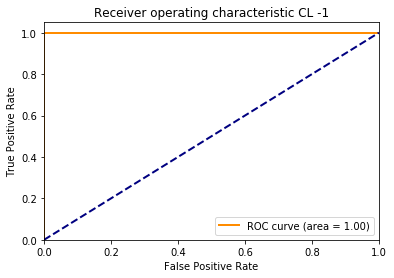

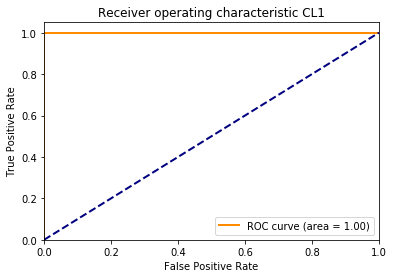

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


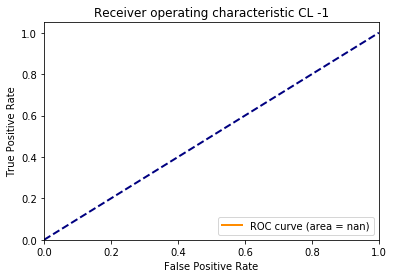

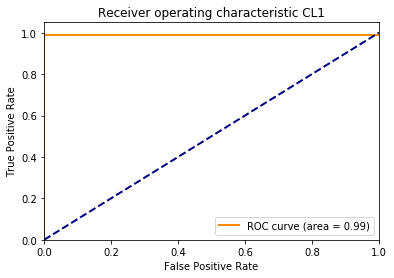

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


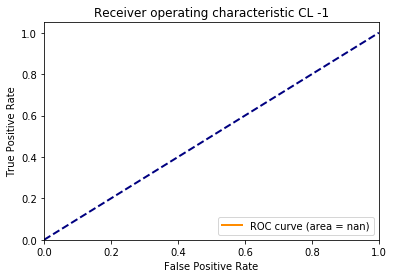

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


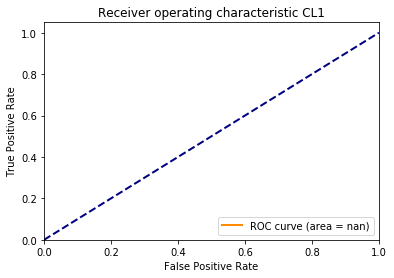

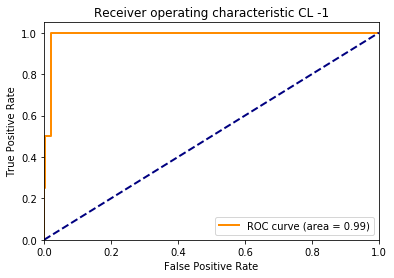

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


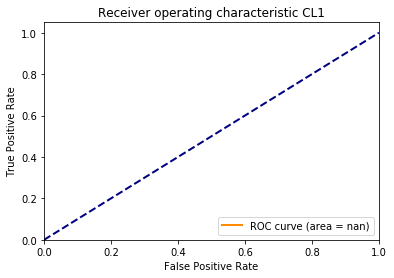

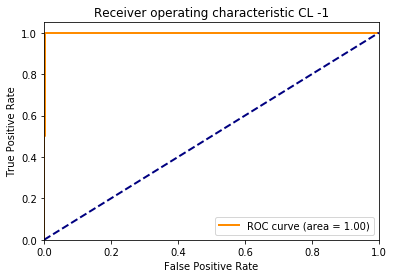

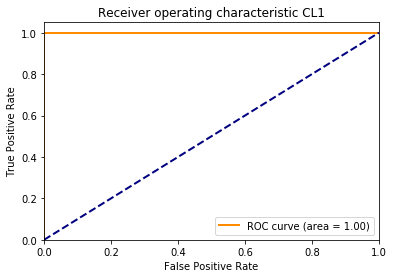

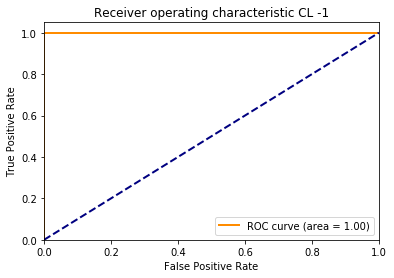

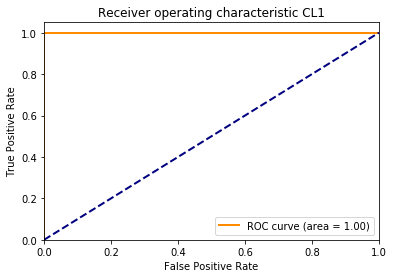

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


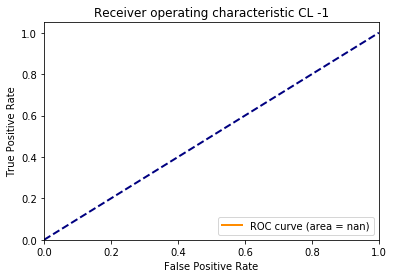

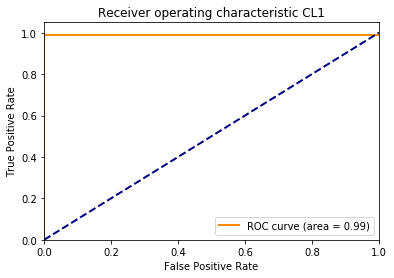

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


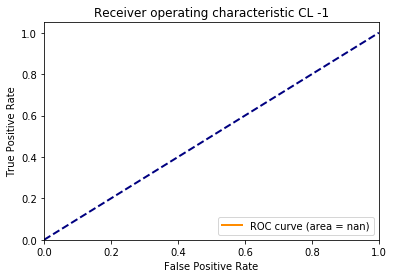

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


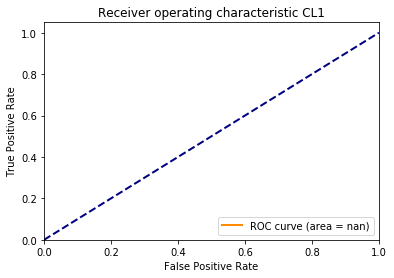

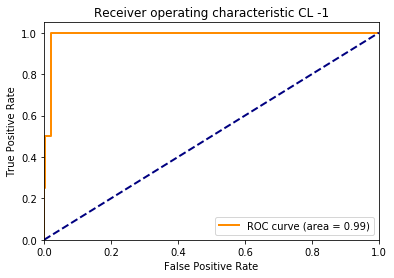

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


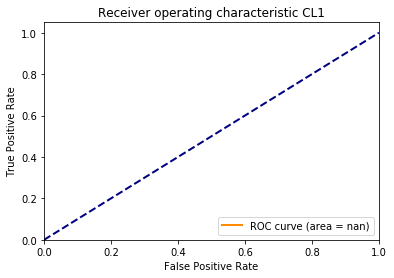

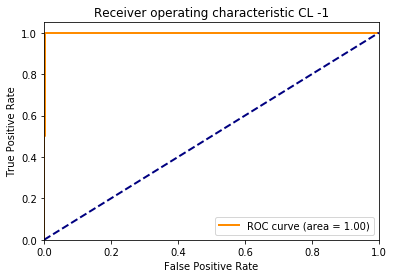

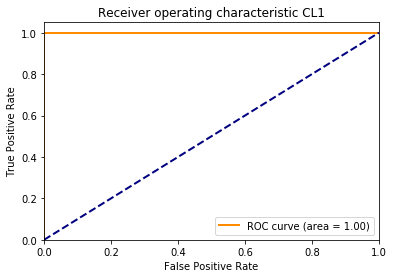

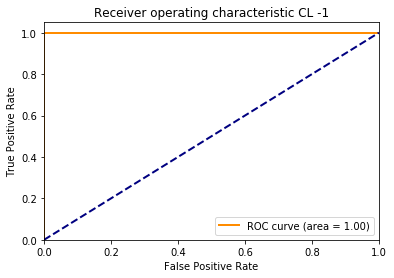

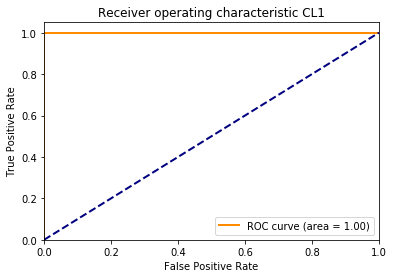

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


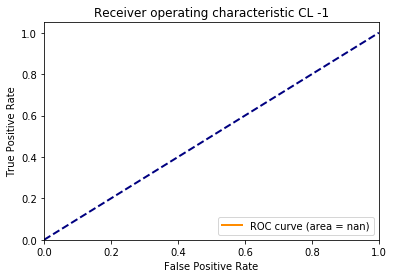

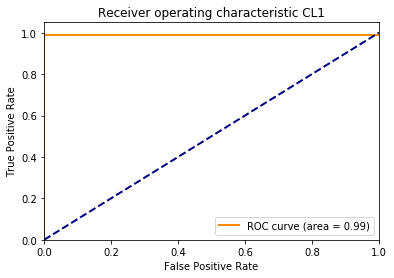

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


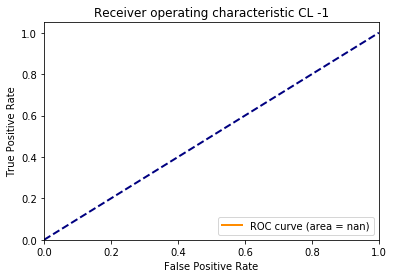

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


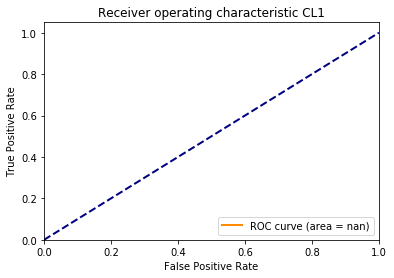

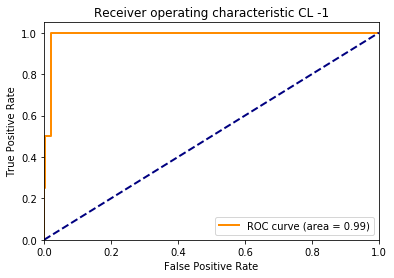

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


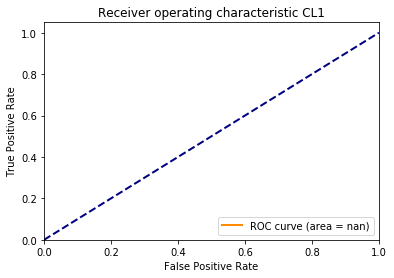

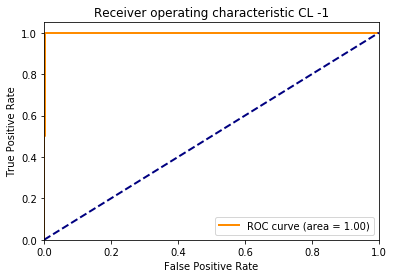

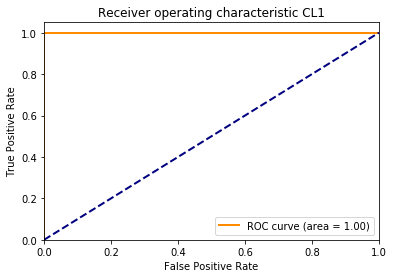

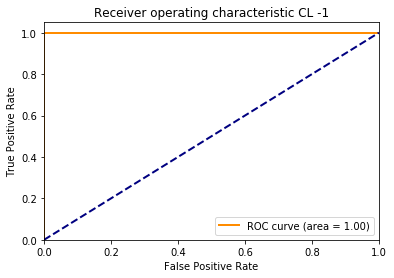

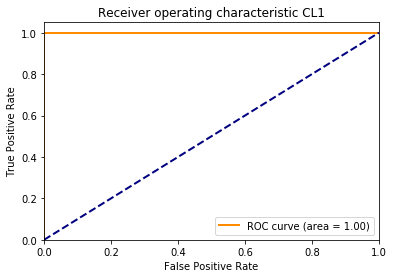

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


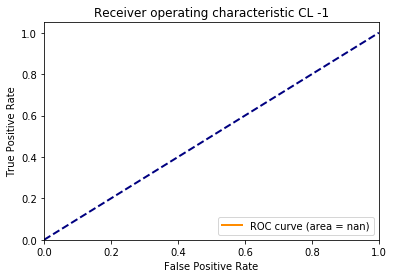

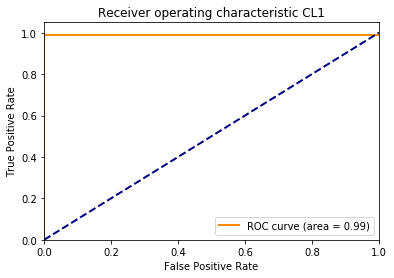

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


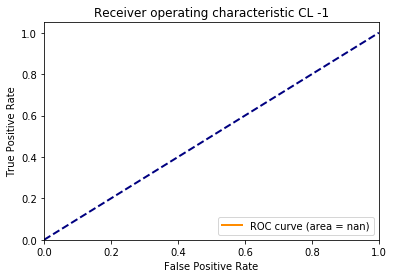

df_tune_data:
      cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0    10.0    1.0   10.0       49.0      0.01       1.0     0.996       0.004
1    10.0    1.0   30.0       41.0      0.01       1.0     0.996       0.004
2    10.0    1.0   70.0       43.0      0.01       1.0     0.997       0.003
3    10.0    1.0   90.0       37.0      0.01       1.0     0.999       0.001
4    10.0    1.0  100.0       38.0      0.01       1.0     0.999       0.001
5    30.0    1.0   10.0       49.0      0.01       1.0     0.996       0.004
6    30.0    1.0   30.0       41.0      0.01       1.0     0.996       0.004
7    30.0    1.0   70.0       43.0      0.01       1.0     0.997       0.003
8    30.0    1.0   90.0       37.0      0.01       1.0     0.999       0.001
9    30.0    1.0  100.0       38.0      0.01       1.0     0.999       0.001
10   50.0    1.0   10.0       49.0      0.01       1.0     0.996       0.004
11   50.0    1.0   30.0       41.0      0.01       1.0     0.

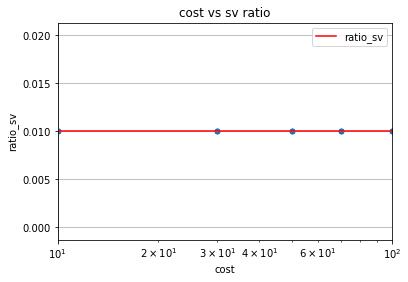

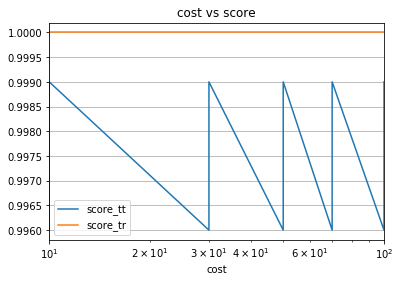

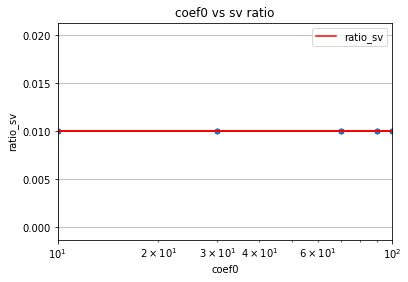

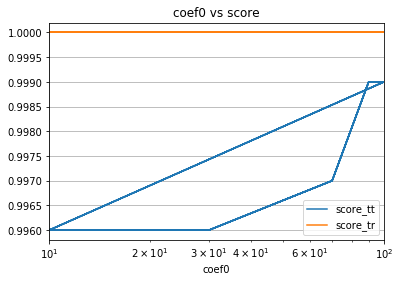

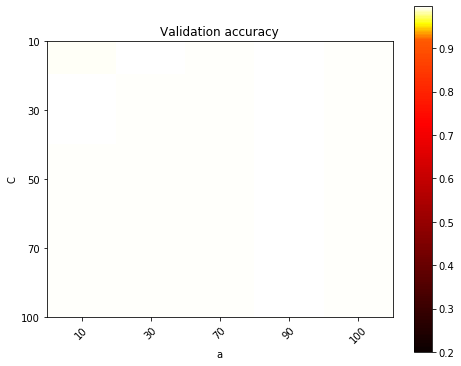

In [0]:
#fine tuning for C and coef0
gamma_range = [1]
C_range = [10,30,50,70,100]
coef0_range = [10,30,70,90,100]

tuned_parameters = {'kernel': ['poly'], 'C': C_range, 'coef0' : coef0_range,'gamma': [1]}
nfolds = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=42)
#tuning for Train set
svm_poly.tune(tuned_parameters,nfolds,False)

kernel_type :  poly
------Fitting train data into svm model-----
# Tuning hyper-parameters


Best parameters set found on development set:

{'C': 10, 'coef0': 30, 'gamma': 1, 'kernel': 'poly'}

Grid scores on development set:

0.995 (+/-0.005) for {'C': 10, 'coef0': 10, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 10, 'coef0': 30, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 10, 'coef0': 50, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.005) for {'C': 10, 'coef0': 75, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 10, 'coef0': 100, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 30, 'coef0': 10, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.005) for {'C': 30, 'coef0': 30, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.006) for {'C': 30, 'coef0': 50, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.005) for {'C': 30, 'coef0': 75, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.004) for {'C': 30, 'coef0': 100, 'gamma': 1, 'kernel': 'poly'}
0.996 (+/-0.005) for {'C': 50, 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


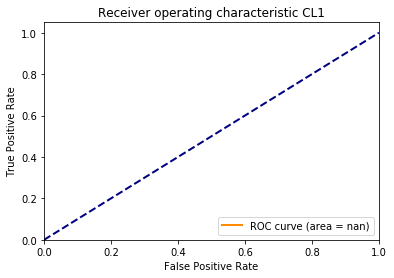

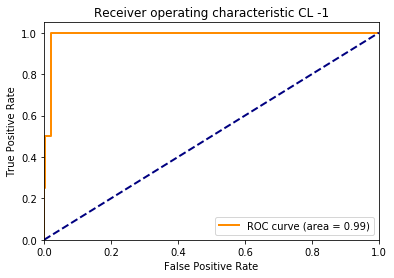

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


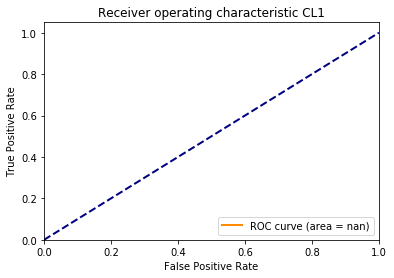

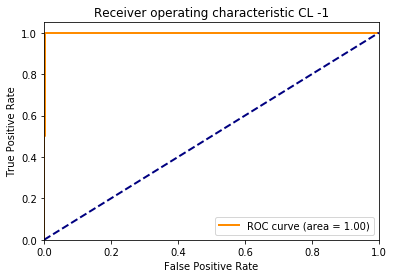

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


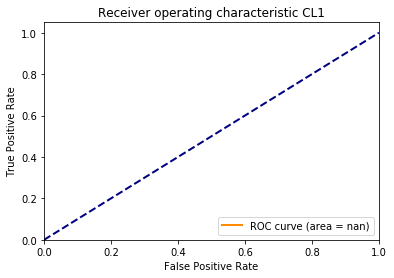

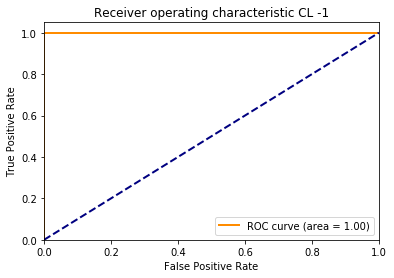

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


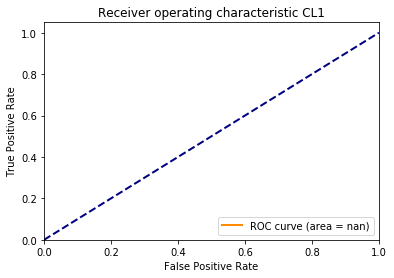

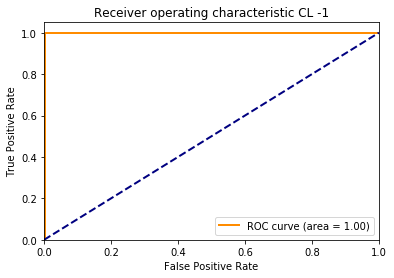

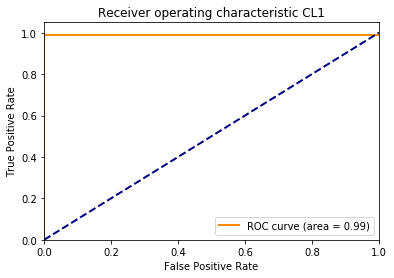

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


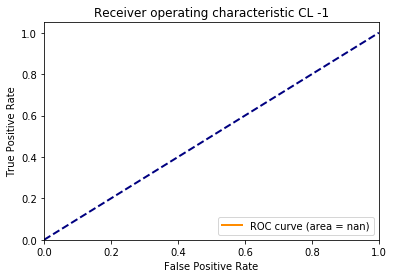

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


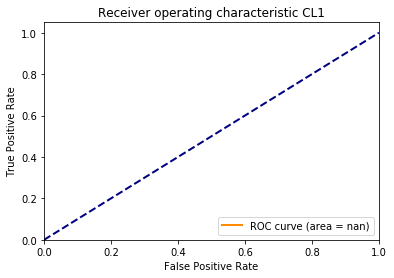

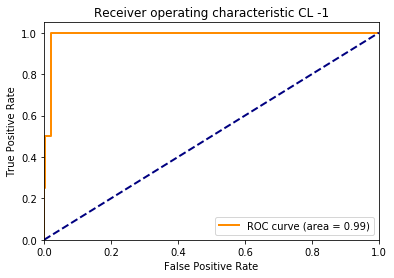

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


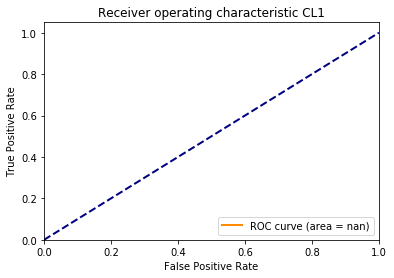

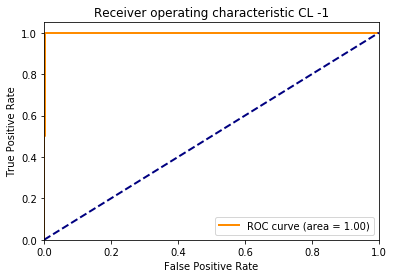

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


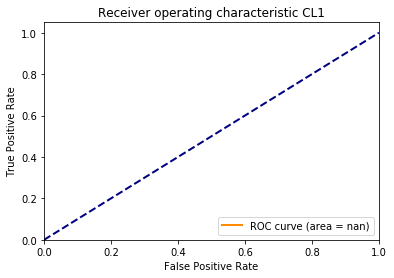

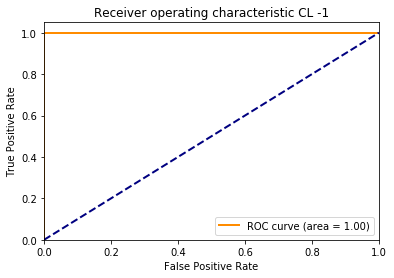

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


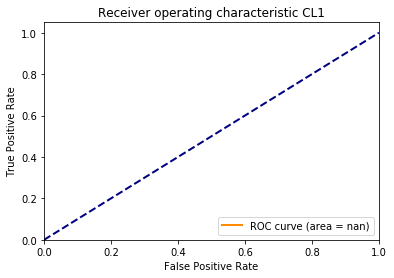

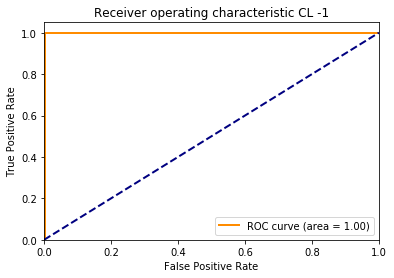

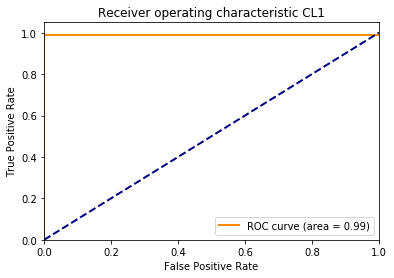

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


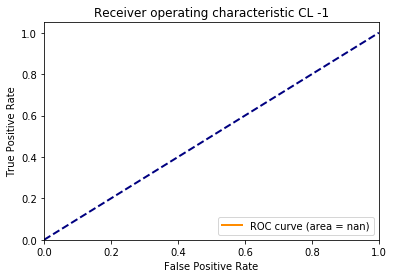

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


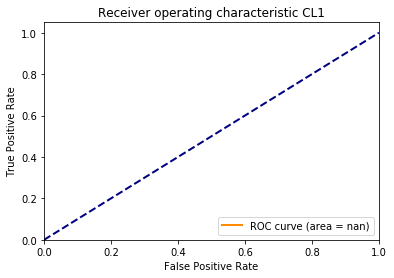

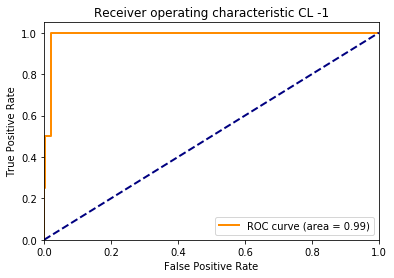

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


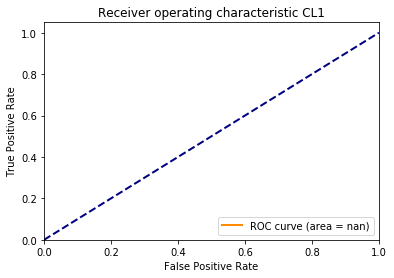

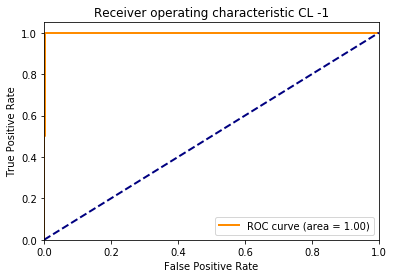

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


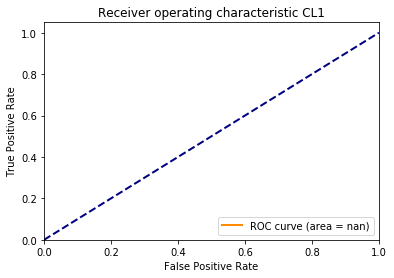

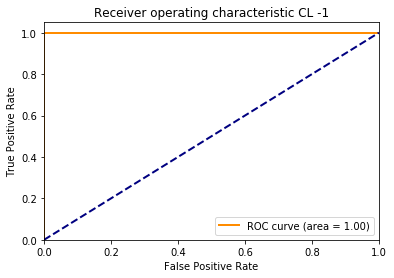

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


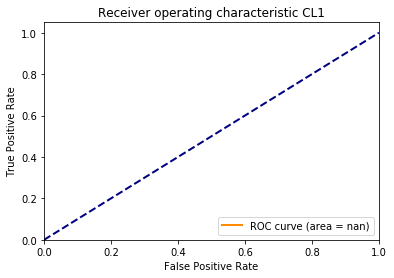

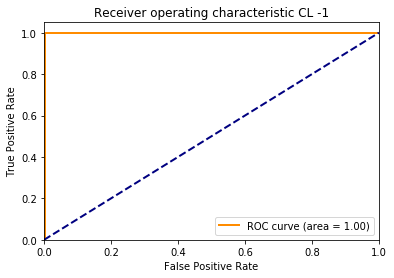

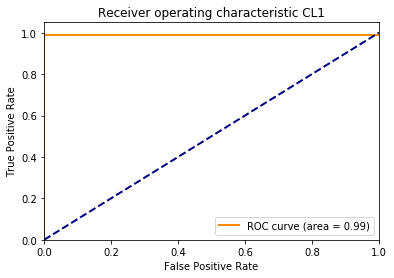

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


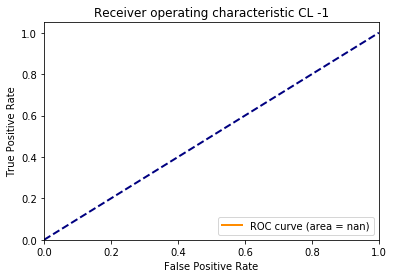

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


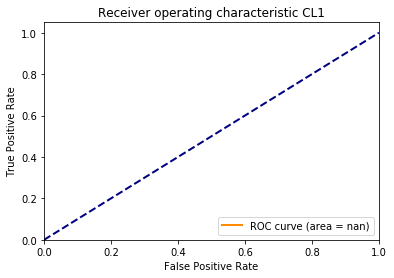

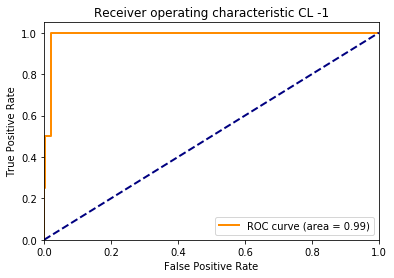

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


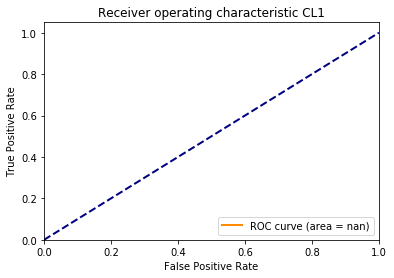

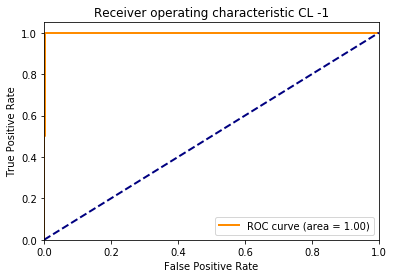

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


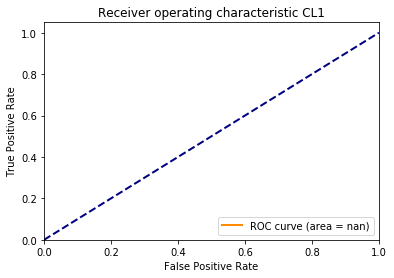

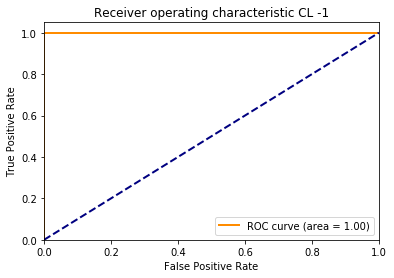

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


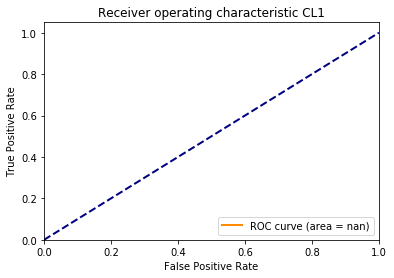

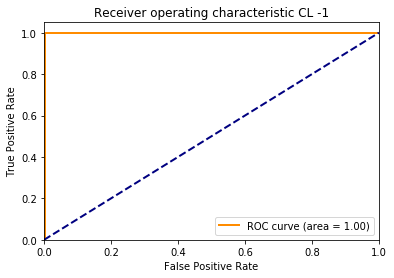

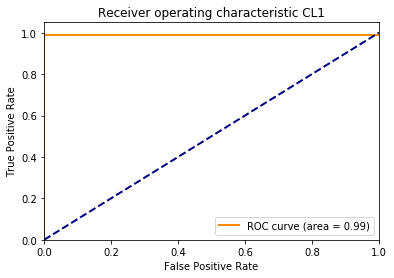

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


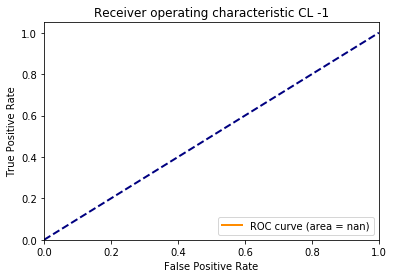

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


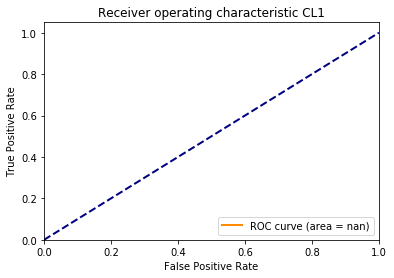

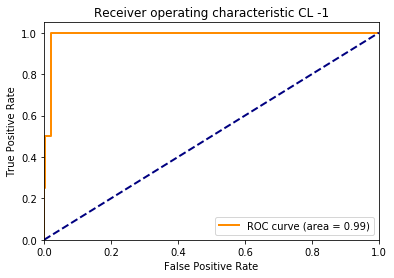

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


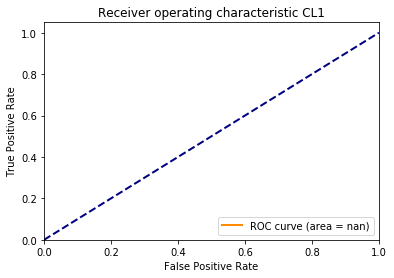

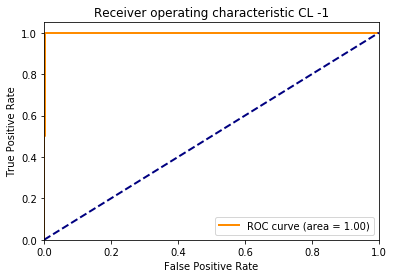

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


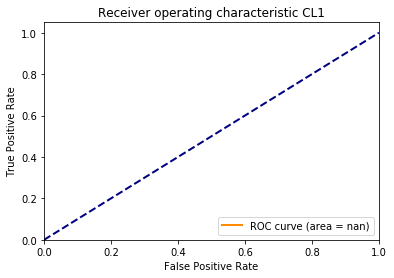

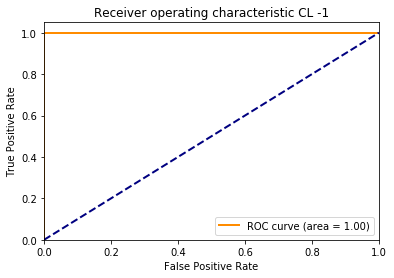

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


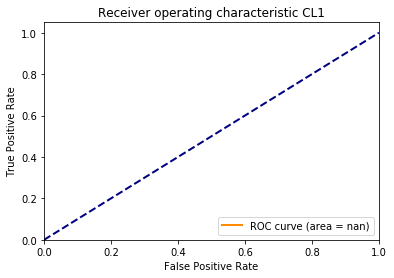

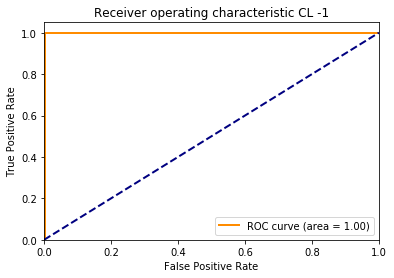

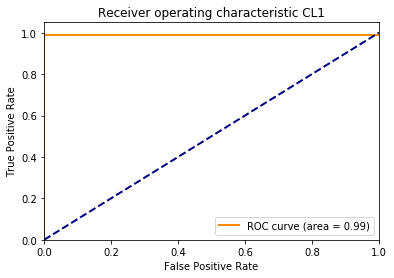

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


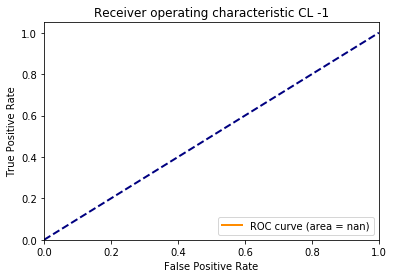

df_tune_data:
      cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0    10.0    1.0   10.0       49.0      0.01       1.0     0.996       0.004
1    10.0    1.0   30.0       41.0      0.01       1.0     0.996       0.004
2    10.0    1.0   50.0       40.0      0.01       1.0     0.999       0.001
3    10.0    1.0   75.0       38.0      0.01       1.0     0.999       0.001
4    10.0    1.0  100.0       38.0      0.01       1.0     0.999       0.001
5    30.0    1.0   10.0       49.0      0.01       1.0     0.996       0.004
6    30.0    1.0   30.0       41.0      0.01       1.0     0.996       0.004
7    30.0    1.0   50.0       40.0      0.01       1.0     0.999       0.001
8    30.0    1.0   75.0       38.0      0.01       1.0     0.999       0.001
9    30.0    1.0  100.0       38.0      0.01       1.0     0.999       0.001
10   50.0    1.0   10.0       49.0      0.01       1.0     0.996       0.004
11   50.0    1.0   30.0       41.0      0.01       1.0     0.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


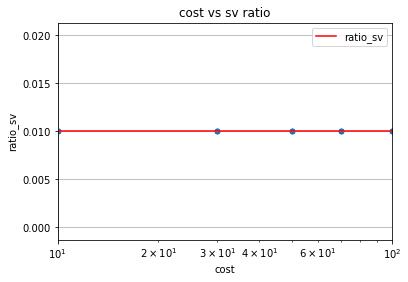

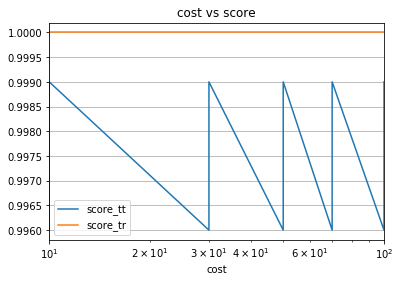

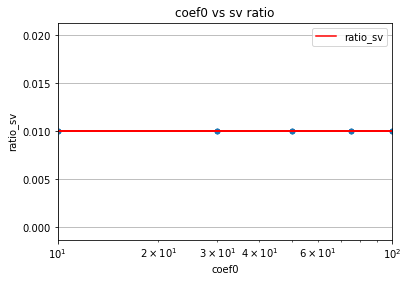

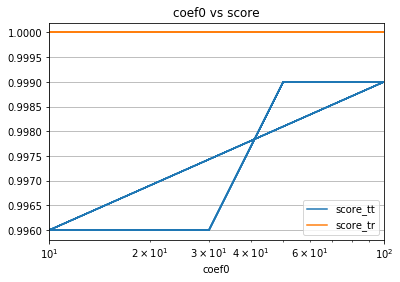

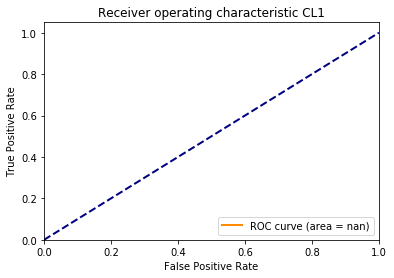

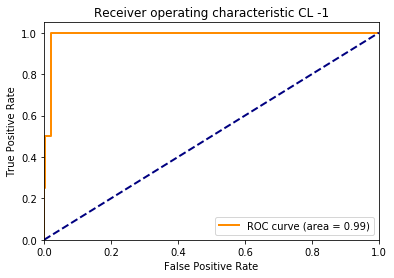

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


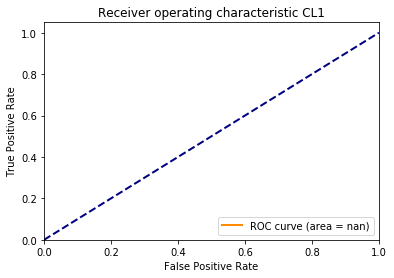

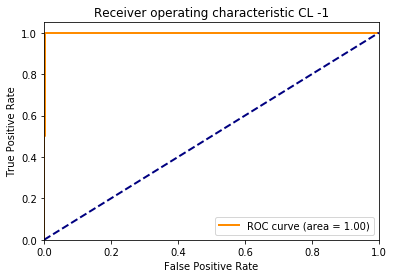

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


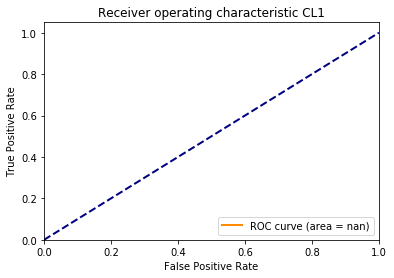

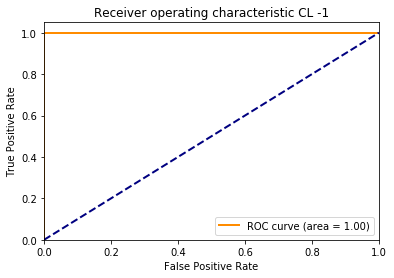

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


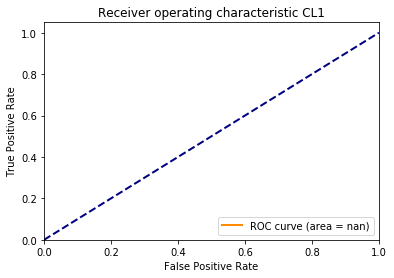

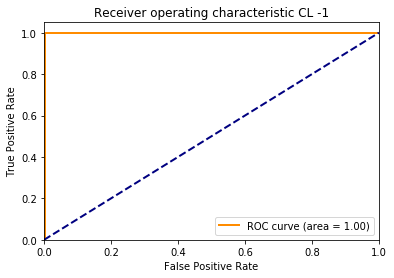

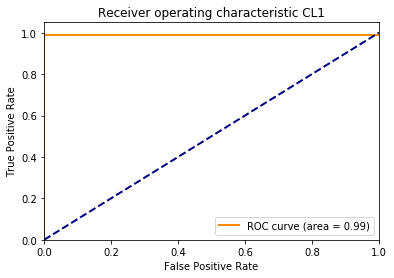

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


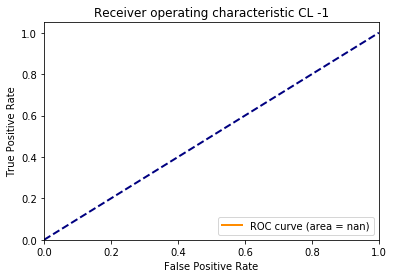

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


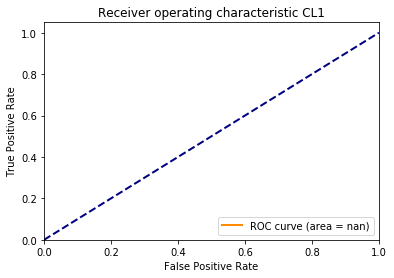

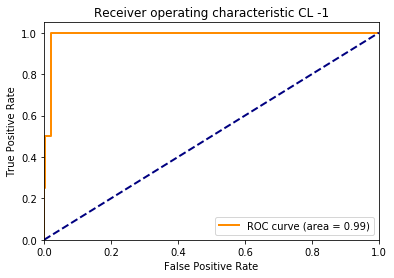

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


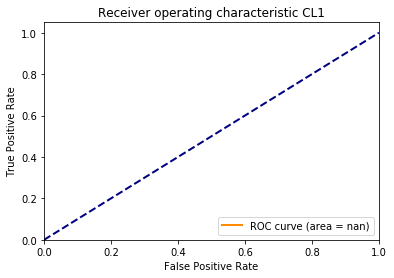

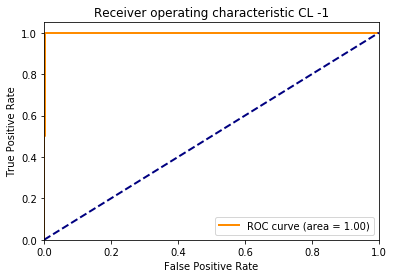

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


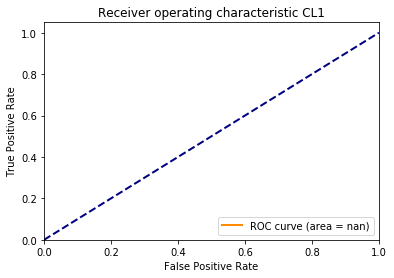

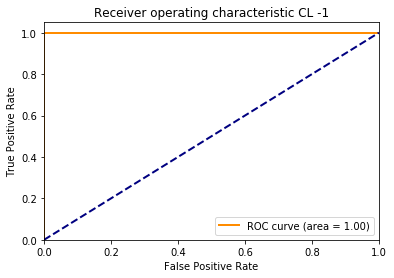

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


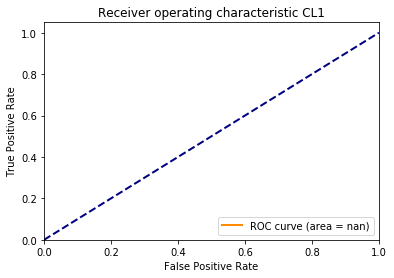

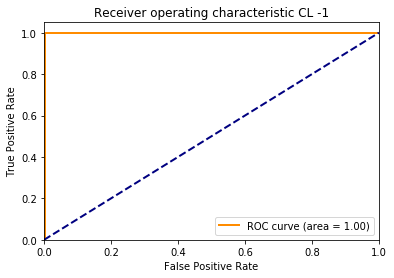

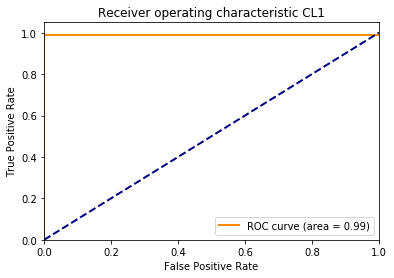

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


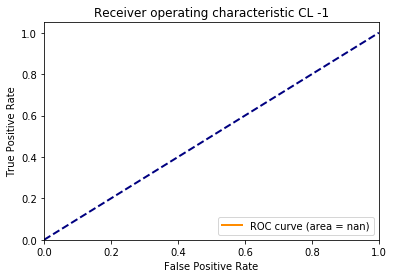

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


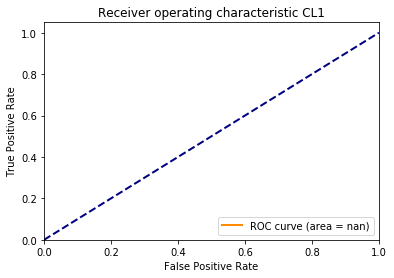

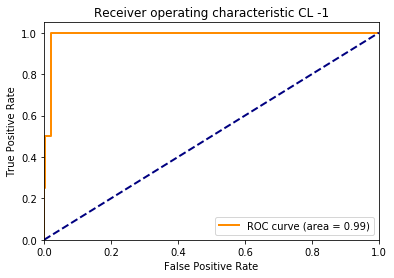

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


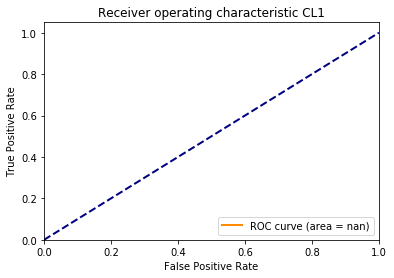

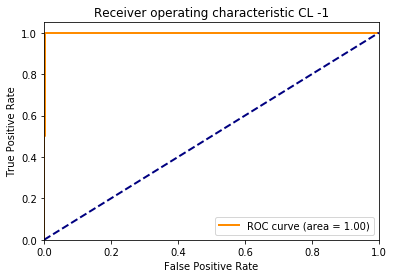

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


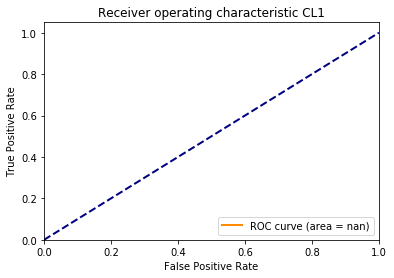

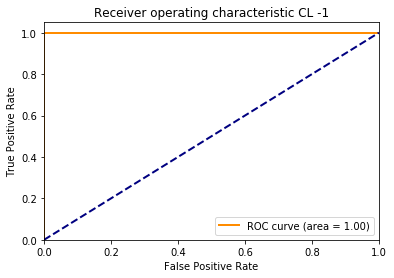

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


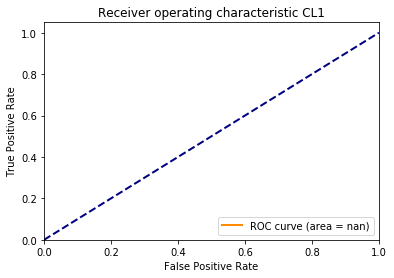

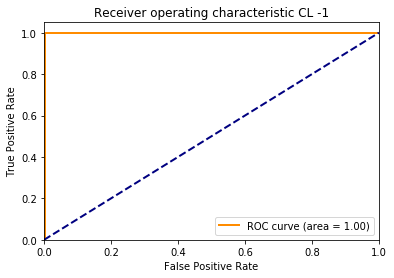

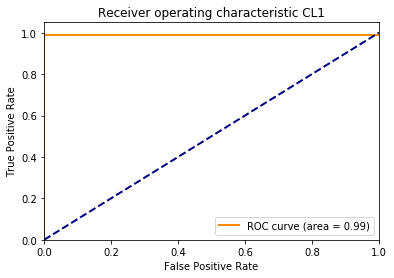

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


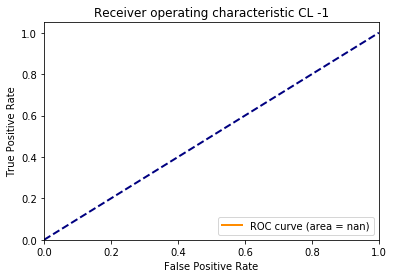

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


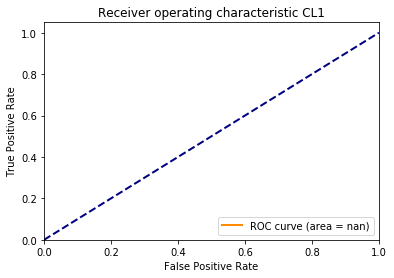

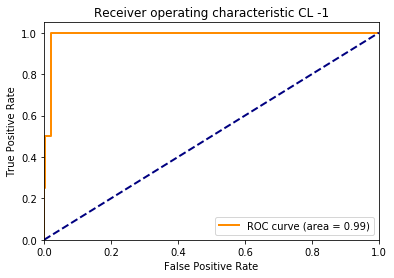

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


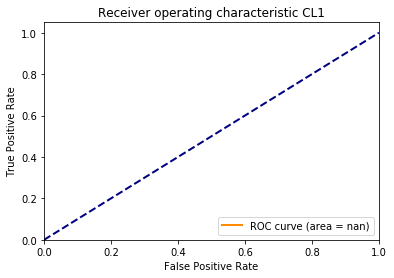

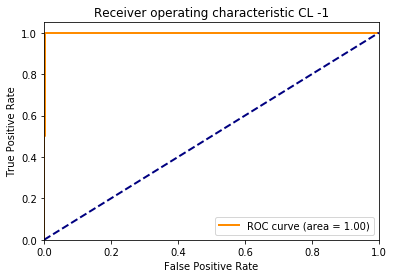

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


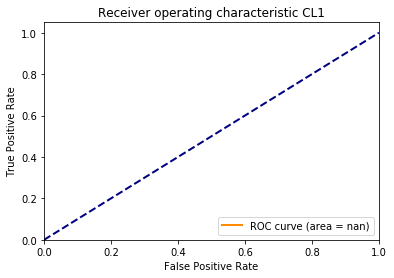

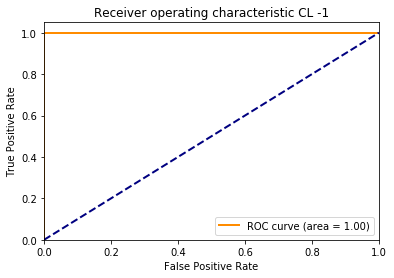

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


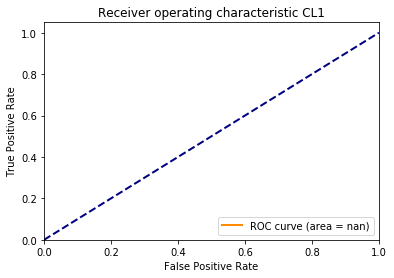

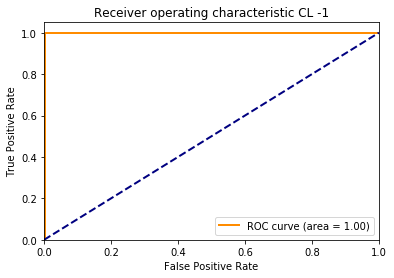

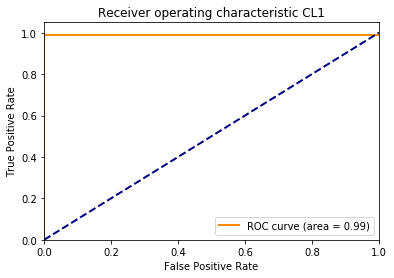

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


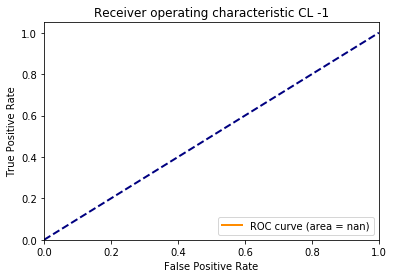

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


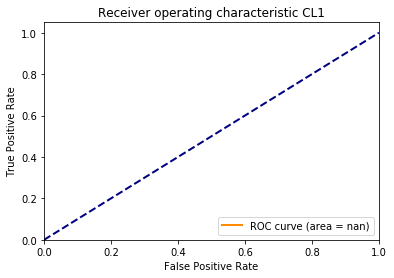

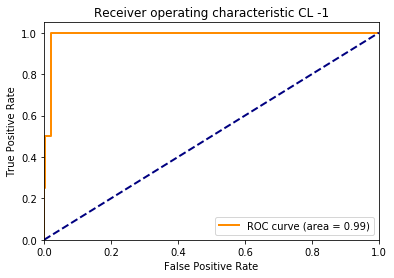

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


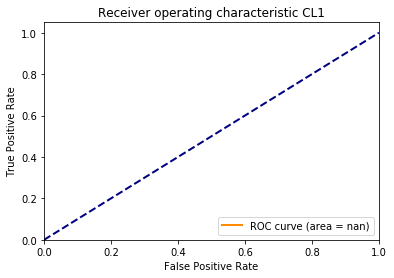

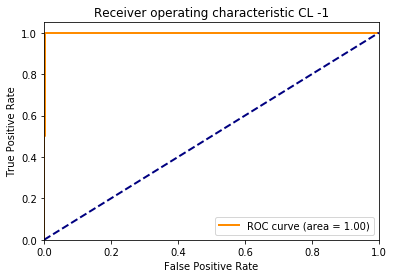

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


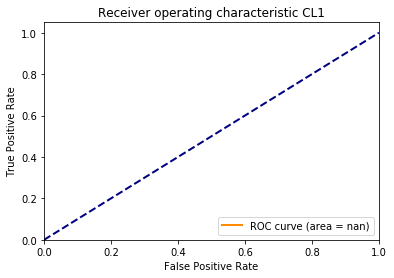

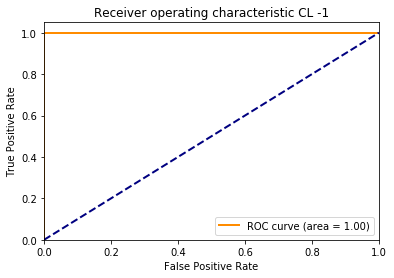

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


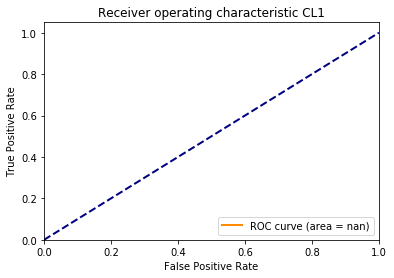

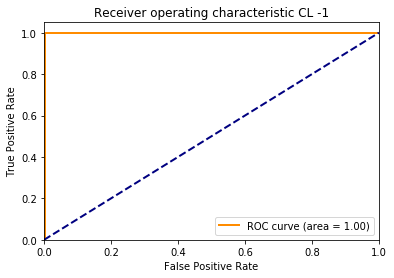

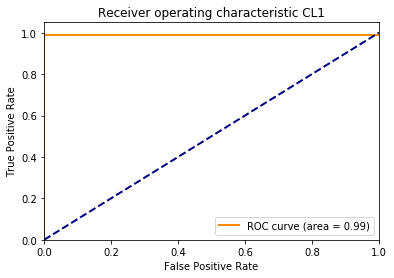

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


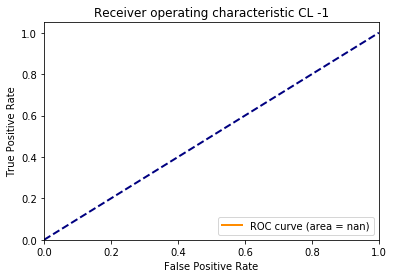

df_tune_data:
      cost  gamma  coef0  number_sv  ratio_sv  score_tr  score_tt  score_diff
0    10.0    1.0   10.0       49.0      0.01       1.0     0.996       0.004
1    10.0    1.0   30.0       41.0      0.01       1.0     0.996       0.004
2    10.0    1.0   50.0       40.0      0.01       1.0     0.999       0.001
3    10.0    1.0   75.0       38.0      0.01       1.0     0.999       0.001
4    10.0    1.0  100.0       38.0      0.01       1.0     0.999       0.001
5    30.0    1.0   10.0       49.0      0.01       1.0     0.996       0.004
6    30.0    1.0   30.0       41.0      0.01       1.0     0.996       0.004
7    30.0    1.0   50.0       40.0      0.01       1.0     0.999       0.001
8    30.0    1.0   75.0       38.0      0.01       1.0     0.999       0.001
9    30.0    1.0  100.0       38.0      0.01       1.0     0.999       0.001
10   50.0    1.0   10.0       49.0      0.01       1.0     0.996       0.004
11   50.0    1.0   30.0       41.0      0.01       1.0     0.

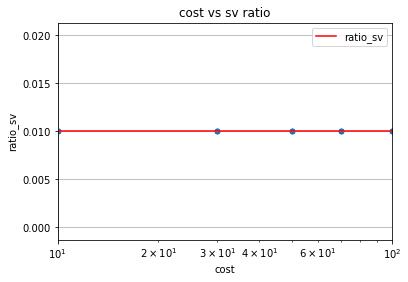

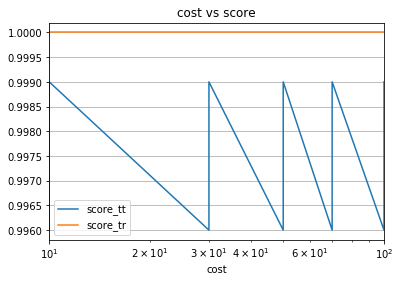

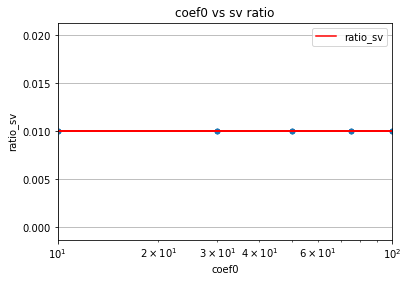

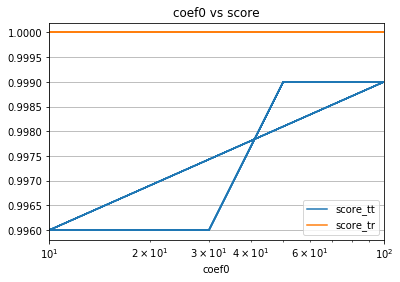

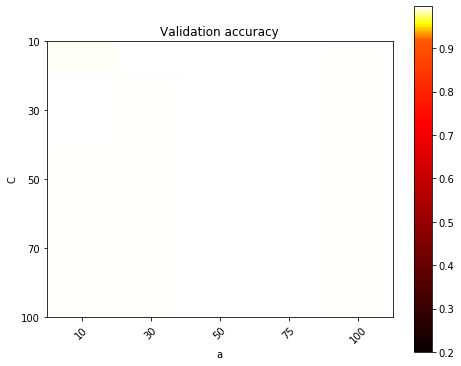

In [0]:
#fine tuning for C and coef0
gamma_range = [1]
C_range = [10,30,50,70,100]
#coef0_range = [10,30,70,90,100]
coef0_range = [10,30,50,75,100]
tuned_parameters = {'kernel': ['poly'], 'C': C_range, 'coef0' : coef0_range,'gamma': [1]}
nfolds = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=42)
#tuning for Train set
svm_poly.tune(tuned_parameters,nfolds,False)

In [0]:
def tune_heatmap(self,tuned_parameters,grid):
    
    kernel_type = tuned_parameters['kernel'][0]
    if kernel_type == 'rbf':
      C_range = tuned_parameters['C']
      parameter_range = tuned_parameters['gamma']      
      parameter_name = 'gamma'
    elif kernel_type == 'poly':
      C_range = tuned_parameters['C']
      parameter_range = tuned_parameters['coef0']
      parameter_name = 'a'

    scores = grid.cv_results_['mean_test_score'].reshape(len(C_range),
                              len(parameter_range))

    
    
    # Draw heatmap of the validation accuracy as a function of gamma and C
    #
    # The score are encoded as colors with the hot colormap which varies from dark
    # red to bright yellow. As the most interesting scores are all located in the
    # 0.92 to 0.97 range we use a custom normalizer to set the mid-point to 0.92 so
    # as to make it easier to visualize the small variations of score values in the
    # interesting range while not brutally collapsing all the low score values to
    # the same color.

    plt.figure(figsize=(8, 6))
    plt.subplots_adjust(left=.2, right=0.95, bottom=0.15, top=0.95)
    plt.imshow(scores, interpolation='nearest', cmap=plt.cm.hot,
          norm=MidpointNormalize(vmin=0.2, midpoint=0.92))
    plt.xlabel(parameter_name)
    
    plt.ylabel('C')
    plt.colorbar()
    plt.xticks(np.arange(len(parameter_range)), parameter_range, rotation=45)
    plt.yticks(np.arange(len(C_range)), C_range)
    plt.title('Validation accuracy')
    plt.show()

{'C': 10, 'coef0': 30, 'gamma': 1, 'kernel': 'poly'}
kernel_type:  poly
------Fitting train data into svm model-----
Score for above parameters in SVC model :  1.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


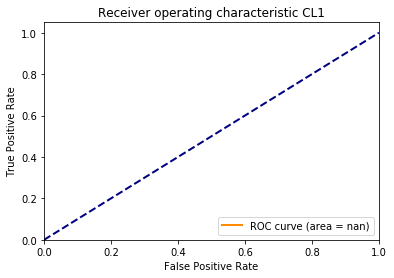

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:659: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


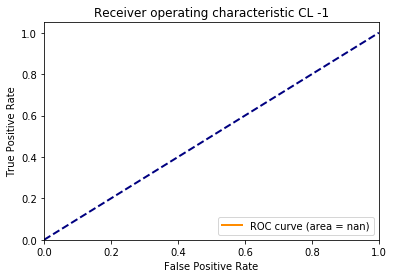

Number of Support vectors,S :  41
Ratio of Support vectors,s :  0.01
------SVM applied on test set-----
Score for above parameters in SVC model for testset :  0.996


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:651: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/ranking.py:113: RuntimeWarning: invalid value encountered in less
  if np.any(dx < 0):


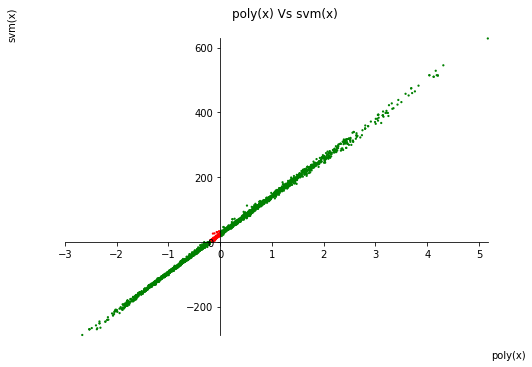

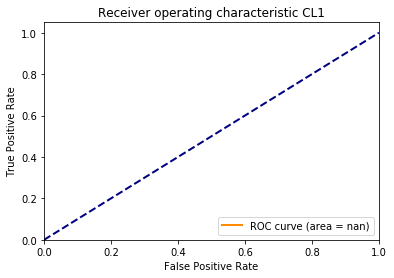

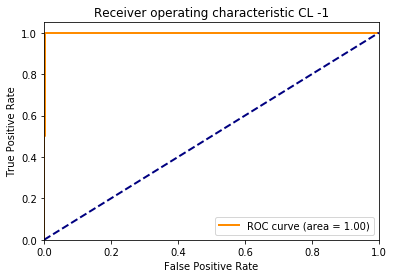

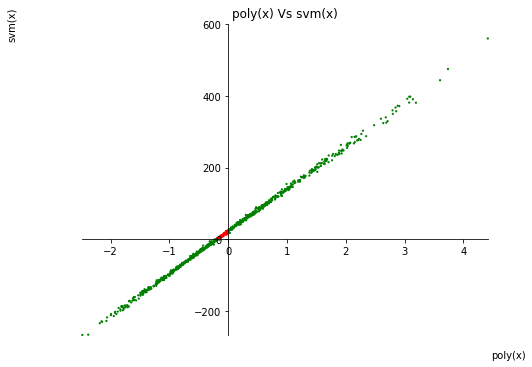

In [0]:
svm_poly.best_params = {'C': 10, 'coef0': 30, 'gamma': 1, 'kernel': 'poly'}
parameters = svm_poly.best_params
print(parameters)
svm_poly.svm_call("poly",parameters,False)


In [0]:


svm_poly.calc_correct_pred()
print('Predictions Train:\n',svm_radial.pred_train)
print('Predictions Test:\n',svm_radial.pred_test)

svm_poly.calc_confusionmatrix()
print('Confusion matrix for Train:\n',svm_radial.confmat_train)
print('Confusion matrix for Test:\n',svm_radial.confmat_test)

svm_poly.error_estimate()
print('prediction errors train:\n',svm_radial.pred_train)
print('prediction errors test:\n',svm_radial.pred_test)

print('confmat_train_error:\n',svm_radial.confmat_train_error)
print('confmat_train_confint:\n',svm_radial.confmat_train_confint)
print('confmat_test_error:\n',svm_radial.confmat_test_error)
print('confmat_test_confint:\n',svm_radial.confmat_test_confint)

Predictions Train:
          pred  error        conf_int
total  99.525   0.11  [99.31, 99.74]
cl1    99.100   0.21  [98.69, 99.51]
cl_1   99.950   0.05    [99.85, 100]
Predictions Test:
        pred  error        conf_int
total  98.8   0.34  [98.13, 99.47]
cl1    98.2   0.59  [97.04, 99.36]
cl_1   99.4   0.35    [98.71, 100]
Confusion matrix for Train:
            pred_CL1  pred_CL_1
true_CL1      99.10       0.90
true_CL_1      0.05      99.95
Confusion matrix for Test:
            pred_CL1  pred_CL_1
true_CL1       98.2        1.8
true_CL_1       0.6       99.4
prediction errors train:
          pred  error        conf_int
total  99.525   0.11  [99.31, 99.74]
cl1    99.100   0.21  [98.69, 99.51]
cl_1   99.950   0.05    [99.85, 100]
prediction errors test:
        pred  error        conf_int
total  98.8   0.34  [98.13, 99.47]
cl1    98.2   0.59  [97.04, 99.36]
cl_1   99.4   0.35    [98.71, 100]
confmat_train_error:
            pred_CL1  pred_CL_1
true_CL1       0.21       0.21
true_CL